In [173]:
from matplotlib import pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve, precision_recall_curve, auc, recall_score, confusion_matrix
import sys 
sys.path.append('/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/')
from RF_atomver import *
from VisUtils import *
import pandas as pd
import numpy as np

In [174]:
import scipy as sp
from sklearn.metrics import pairwise_distances

# ---------------------------------------------
def calc_AD_kmean_dist(train_dset, pred_dset, k, train_dset_pair_distance=None, dist_metric="euclidean"):
    """
    calculate the probability of the prediction dataset fall in the the domain of traning set. Use Euclidean distance of the K nearest neighbours.
    train_dset and pred_dset should be in 2D numpy array format where each row is a compound.
    """
    if train_dset_pair_distance is None:
        # calcualate the pairwise distance of training set
        train_dset_pair_distance = pairwise_distances(X=train_dset, metric=dist_metric)
    train_kmean_dis = []
    for i in range(len(train_dset_pair_distance)):
        kn_idx = np.argpartition(train_dset_pair_distance[i], k+1)
        dis = np.mean(train_dset_pair_distance[i][kn_idx[:k+1]])
        train_kmean_dis.append(dis)
    train_dset_distribution = sp.stats.norm.fit(train_kmean_dis)
    # pairwise distance between train and pred set
    pred_size = len(pred_dset)
    train_pred_dis = pairwise_distances(X=pred_dset, Y=train_dset, metric=dist_metric)
    pred_kmean_dis_score = np.zeros(pred_size)
    for i in range(pred_size):
        pred_km_dis = np.mean(np.sort(train_pred_dis[i])[:k])
        train_dset_std = train_dset_distribution[1] if train_dset_distribution[1] != 0 else 1e-6
        pred_kmean_dis_score[i] = max(1e-6, (pred_km_dis - train_dset_distribution[0]) / train_dset_std)
    return pred_kmean_dis_score

In [175]:
figure_path = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/plots/AD/figures/AD_RF_std_prob/'


result_path = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_results/'
pickle_path ='/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_pickles/'
neks = ['NEK2_binding', 'NEK2_inhibition', 'NEK3_binding', 'NEK5_binding', 'NEK9_binding', 'NEK9_inhibition'] 
nek_list = ["2", "3", "5", "9"]
nektype = ['binding','inhibition']
feat_types = ['moe', 'mfp']
samplings = ['scaled', 'UNDER' , 'SMOTE', 'ADASYN']
model_types = ['RF','RF_BCW', 'BRFC', 'BRFC_BCW']


In [1]:
category_order = ['TP', 'TN', 'FP', 'FN']
def get_AD_swarm_data(predictions, true_labels, std1, std0, ad_dist, set_name):
    true_pos = np.where((predictions == 1) & (true_labels == 1).flatten())[0] 
    true_neg = np.where((predictions == 0) & (true_labels == 0).flatten())[0]
    false_pos = np.where((predictions == 1) & (true_labels == 0).flatten())[0] 
    false_neg = np.where((predictions == 0) & (true_labels == 1).flatten())[0] 
    a = std1[true_pos]
    b = std0[true_neg]
    c = std1[false_pos]
    d = std1[false_neg]
    ad_a = ad_dist[true_pos]
    ad_b = ad_dist[true_neg]
    ad_c = ad_dist[false_pos]
    ad_d = ad_dist[false_neg]

    data = {
        'std of probabilities': np.concatenate([a, b, c, d]),
        'Category': ['TP'] * len(a) + ['TN'] * len(b) + ['FP'] * len(c) + ['FN'] * len(d),
        'ADdist': np.concatenate([ad_a, ad_b, ad_c, ad_d]),
        'Set': [set_name] * (len(a) + len(b) + len(c) + len(d))
    }

    # for category in ['TP', 'TN', 'FP', 'FN']:
    #     if category not in data['Category']:
    #         data['std of probabilities'] = np.append(data['std of probabilities'], np.nan)
    #         data['Category'].append(category)
    #         data['ADdist'] = np.append(data['ADdist'], np.nan)
    #         data['Set'].append(set_name)

    return pd.DataFrame(data)
def plot_swarm_AD_std_prob_RF(df, figure_path, title):
    plt.figure(figsize=(10, 6))
    category_order = ['TP', 'TN', 'FP', 'FN']

    # Sorting the dataframe by category to ensure the desired order
    df['Category'] = pd.Categorical(df['Category'], categories=category_order, ordered=True)
    df = df.sort_values('Category')

    # Create color gradients
    cmap_moe = plt.cm.Blues
    cmap_mfp = plt.cm.Oranges

    # Normalize ADdist values to [0, 1] for color mapping
    norm_moe = plt.Normalize(df[df['Set'] == 'moe']['ADdist'].min(), df[df['Set'] == 'moe']['ADdist'].max())
    norm_mfp = plt.Normalize(df[df['Set'] == 'mfp']['ADdist'].min(), df[df['Set'] == 'mfp']['ADdist'].max())

    # Plotting the first swarm plot for 'moe'
    df_moe = df[df['Set'] == 'moe']
    sns.swarmplot(x='Category', y='std of probabilities', data=df_moe, color='blue', alpha=0.7, order=category_order,dodge=True)
    df_mfp = df[df['Set'] == 'mfp']
    sns.swarmplot(x='Category', y='std of probabilities', data=df_mfp, color='orange', alpha=0.7, order=category_order,dodge=True)

    plt.ylim(0, 0.5)
    plt.title(title)
    plt.xlabel('Classification Type')
    plt.ylabel('Std of Tree Probability')
    # plt.savefig(f'{figure_path}{title}.png')
    plt.show()

In [90]:
# prob_path = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_results/proba_dfs/'
# neks = ['NEK2_binding', 'NEK2_inhibition','NEK3_binding', 'NEK5_binding', 'NEK9_binding','NEK9_inhibition']
# RFpath = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_results/'
# numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
# k=7
# col_names = ['prediction_type', 'ADdist', 'model_type']
# model_palette = sns.cubehelix_palette(start=.5, rot=-.5, n_colors=2)
# category_order = ['TP', 'TN', 'FP', 'FN']
# for nek in neks:
#     for feat in feat_types: 

#         for samp in samplings: 
#             df_path = f'/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK{nek}/bind/'
#             full_df = pd.read_csv(f'{df_path}NEK{nek}_binding_{feat}_{samp}_df.csv') 
#             train_df = full_df[full_df['subset'] == 'train'].select_dtypes(include=numerics).drop(columns=['active'])
#             test_df = full_df[full_df['subset'] == 'test'].select_dtypes(include=numerics).drop(columns=['active'])
#             test_dist = calc_AD_kmean_dist(train_df, test_df, k)
#             train_dist = calc_AD_kmean_dist(train_df, train_df, k)
#             for rf in RF_types:

#                 moe_pred = pd.read_csv(f'{result_path}NEK{nek}_binding_moe_{samp}_{rf}_test.csv')
#                 mfp_pred = pd.read_csv(f'{result_path}NEK{nek}_binding_mfp_{samp}_{rf}_test.csv')
#                 stdprobs = pd.read_csv(f'{prob_path}NEK{nek}_binding_std_prob_{samp}_{rf}.csv')
#                 std0_moe = stdprobs['std0_moe']
#                 std1_moe = stdprobs['std1_moe']
#                 std0_mfp = stdprobs['std0_mfp']
#                 std1_mfp  = stdprobs['std1_mfp']
#                 # df['ADdist'] = np.tile(test_dist, 2)
     
#                 moe_df = get_AD_swarm_data(moe_pred['prediction'].to_numpy(), moe_pred['y'].to_numpy(), std1_moe.to_numpy(), std0_moe.to_numpy(), test_dist,'moe')
#                 mfp_df = get_AD_swarm_data(mfp_pred['prediction'].to_numpy(), mfp_pred['y'].to_numpy(), std1_mfp.to_numpy(), std0_mfp.to_numpy(), test_dist,'mfp')
                
#                 df = pd.concat([moe_df, mfp_df])
                
               
         
#                 title = f'NEK{nek} {samp} {rf} std prob (AD)'
#                 plot_swarm_AD_std_prob_RF(df, figure_path, title)
                

In [233]:
RFpath = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_results/'
col_names = ['prediction_type', 'ADdist', 'model_type']
model_palette = sns.cubehelix_palette(start=.5, rot=-.5, n_colors=2)
category_order = ['TP', 'TN', 'FP', 'FN']
test_dists = []
train_dists = [] 
nekNUMS = []
feat_types_all = []
sampling_all = [] 
for nek in nek_list:
    for feat in feat_types: 
        for samp in samplings: 
            df_path = f'/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK{nek}/bind/'
            full_df = pd.read_csv(f'{df_path}NEK{nek}_binding_{feat}_{samp}_df.csv') 
            train_df = full_df[full_df['subset'] == 'train'].select_dtypes(include=numerics).drop(columns=['active'])
            test_df = full_df[full_df['subset'] == 'test'].select_dtypes(include=numerics).drop(columns=['active'])
            test_dist = calc_AD_kmean_dist(train_df, test_df, k)
            train_dist = calc_AD_kmean_dist(train_df, train_df, k)
            print(f'NEK{nek} binding {feat} {samp}')
            print(f'train min: {train_dist.min()}, train max: {train_dist.max()}') 
            print(f'test min: {test_dist.min()}, test max: {test_dist.max()}') 
            test_dists.append(test_dist) 
            train_dists.append(train_dist) 
            nekNUMS = f'NEK{nek}_binding'
            feat_types_all.append(feat) 
            sampling_all.append(samp) 
            
            print()
        if (nek =='2' or nek=='9'): 
            df_path = f'/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK{nek}/inhib/'
            full_df = pd.read_csv(f'{df_path}NEK{nek}_inhibition_{feat}_{samp}_df.csv') 
            print(f'NEK{nek} binding {feat} {samp}')
            train_df = full_df[full_df['subset'] == 'train'].select_dtypes(include=numerics).drop(columns=['active'])
            test_df = full_df[full_df['subset'] == 'test'].select_dtypes(include=numerics).drop(columns=['active'])
            test_dist = calc_AD_kmean_dist(train_df, test_df, k)
            train_dist = calc_AD_kmean_dist(train_df, train_df, k)
            print(f'train min: {train_dist.min()}, train max: {train_dist.max()}') 
            print(f'test min: {test_dist.min()}, test max: {test_dist.max()}')
            test_dists.append(test_dist) 
            train_dists.append(train_dist) 
            nekNUMS = f'NEK{nek}_inhibition'
            feat_types_all.append(feat) 
            sampling_all.append(samp) 
            print()
            


NEK2 binding moe scaled
train min: 1e-06, train max: 6.812133291898046
test min: 1e-06, test max: 7.50479355325113

NEK2 binding moe UNDER
train min: 1e-06, train max: 3.684809374278897
test min: 1e-06, test max: 11.350567305597355

NEK2 binding moe SMOTE
train min: 1e-06, train max: 4.686535361892515
test min: 1e-06, test max: 5.065935456885707

NEK2 binding moe ADASYN
train min: 1e-06, train max: 4.716738084257267
test min: 1e-06, test max: 5.098948187326365

NEK2 binding moe ADASYN
train min: 1e-06, train max: 7.519709644538826
test min: 1e-06, test max: 8.2101402465082

NEK2 binding mfp scaled
train min: 1e-06, train max: 2.616177651540279
test min: 1e-06, test max: 4.737955713074792

NEK2 binding mfp UNDER
train min: 1e-06, train max: 2.3450670414084986
test min: 1e-06, test max: 6.620301609343654

NEK2 binding mfp SMOTE
train min: 1e-06, train max: 2.1975619600316643
test min: 0.21080290302488183, test max: 3.2225842006748806

NEK2 binding mfp ADASYN
train min: 1e-06, train max: 

In [214]:
AD_df = pd.DataFrame({'NEK':nekNUMS, 'strategy': sampling_all, 'feat_type': feat_types_all, 'test_dist': test_dists, 'train_dist': train_dists}) 
AD_df['dataset_category']= AD_df['feat_type'].astype(str)+'_'+ AD_df['strategy'] 

size_df=pd.read_csv('/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/dataset_creation/all_NEK_dataset_sizes.csv') 
size_df = size_df
AD_df = AD_df.replace('scaled', 'raw')
merged_df = pd.merge(size_df, AD_df, on=['NEK', 'strategy', 'feat_type'])
# print('size_df '+size_df.columns) 
merged_df.to_csv('/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/plots/AD/AD_and_sizes_allNEK.csv')
# print('AD_df '+AD_df.columns) 

sizes = []
for entry in merged_df['train_dist']:
    if isinstance(entry, (list, np.ndarray)):  
        # sizes.append(len(entry))
        sizes.append(entry.shape)
    else:
        sizes.append(None) 

/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/pandas/core/missing.py:106: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  new_mask[arr_mask] = arr[arr_mask] == x


NEK2 scaled RF


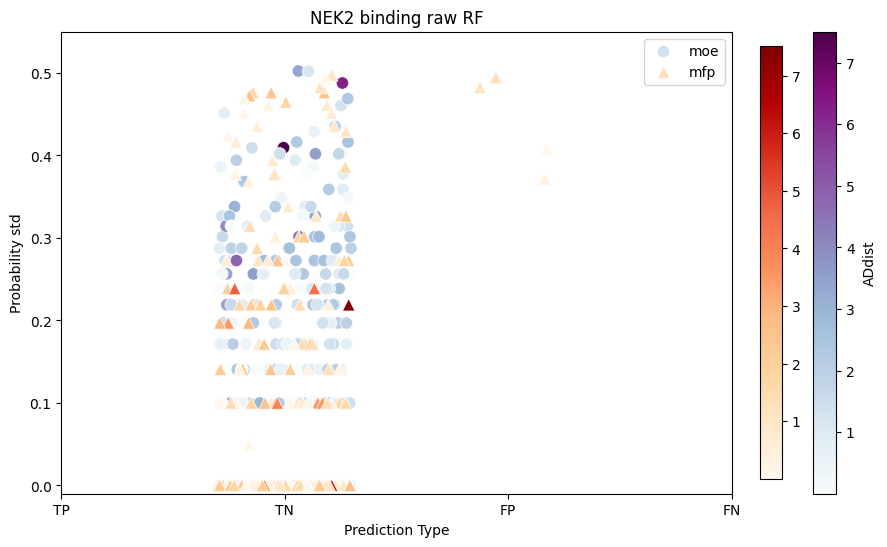

NEK2 scaled RF_BCW


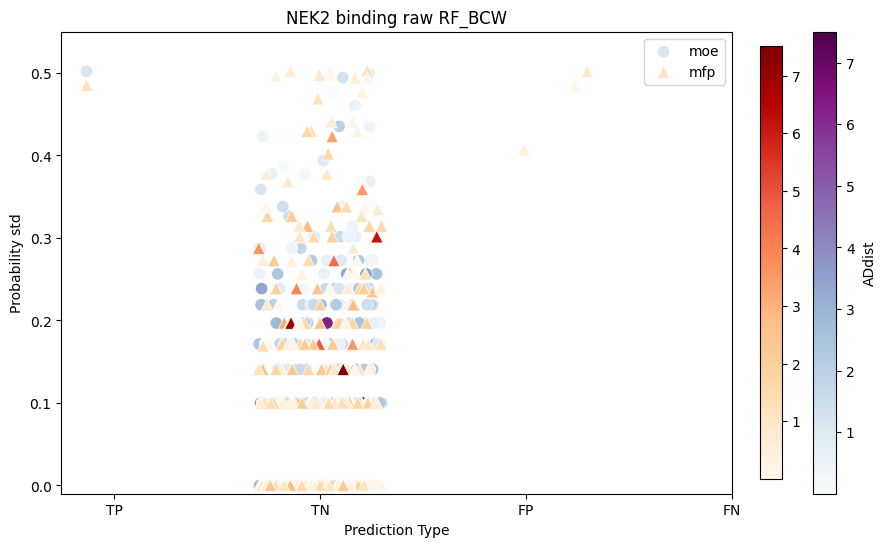

NEK2 scaled BRFC


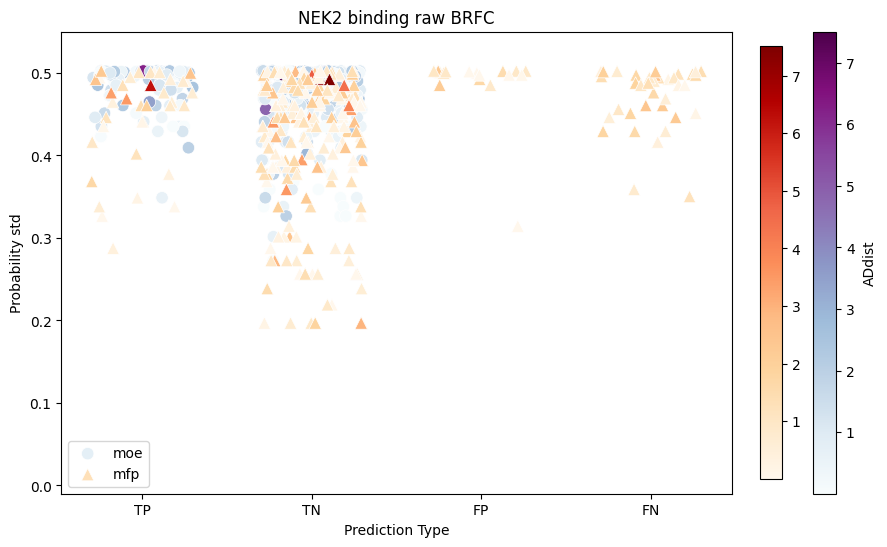

NEK2 scaled BRFC_BCW


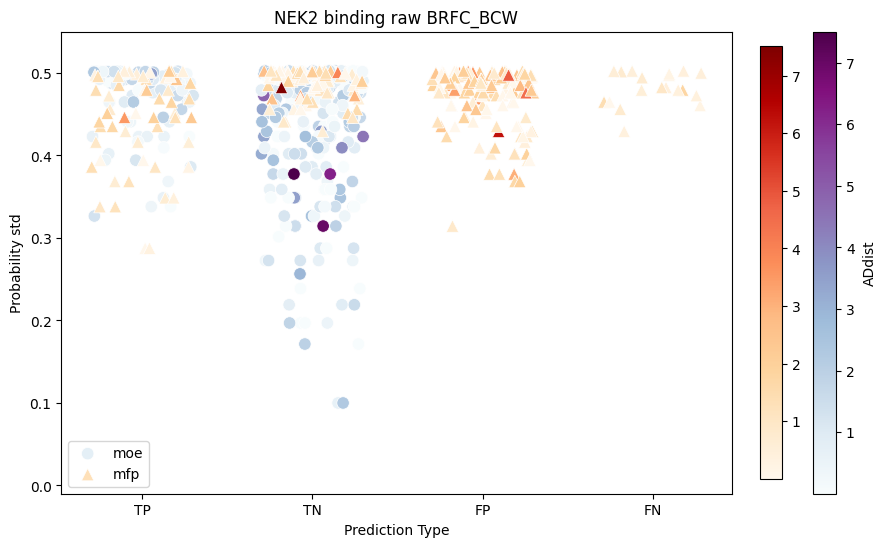

NEK2 UNDER RF


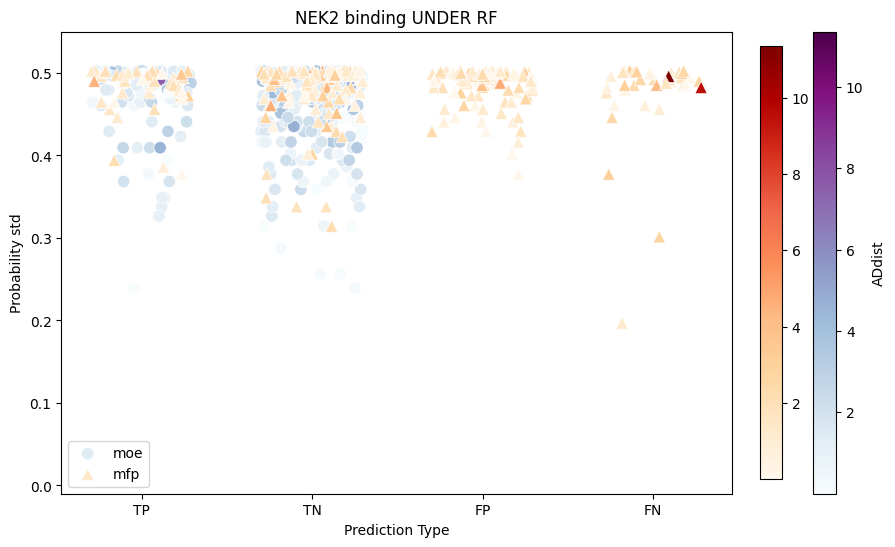

NEK2 UNDER RF_BCW


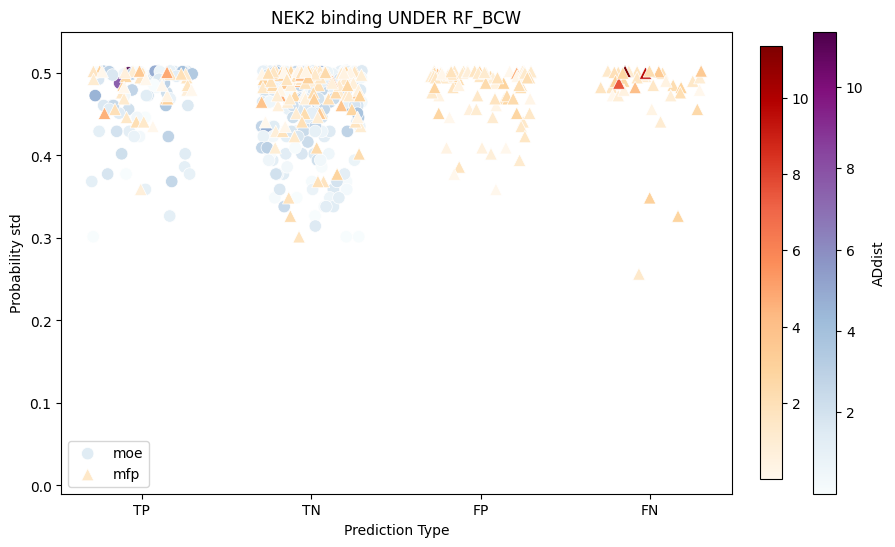

NEK2 UNDER BRFC


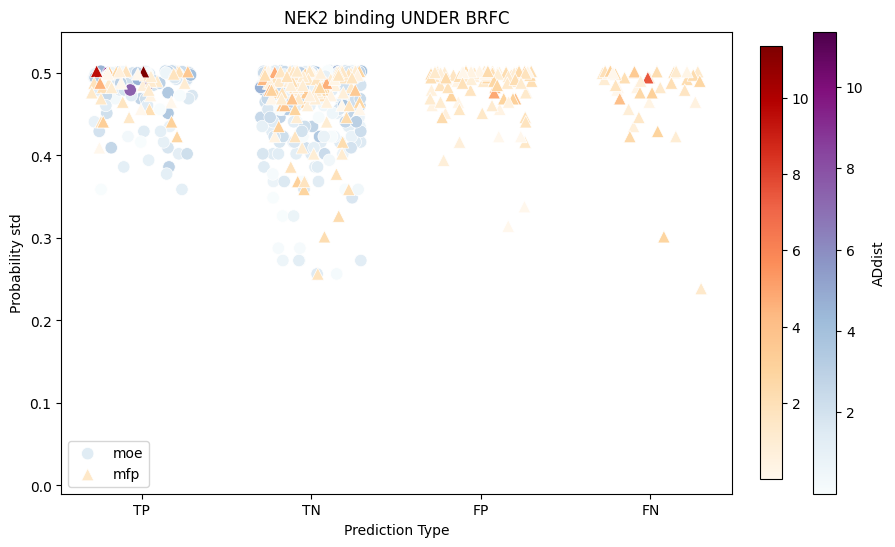

NEK2 UNDER BRFC_BCW


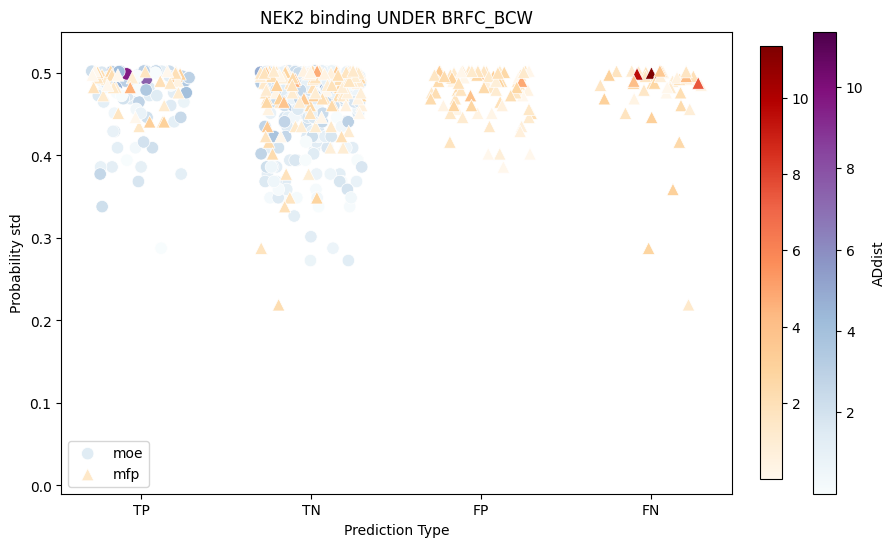

NEK2 SMOTE RF


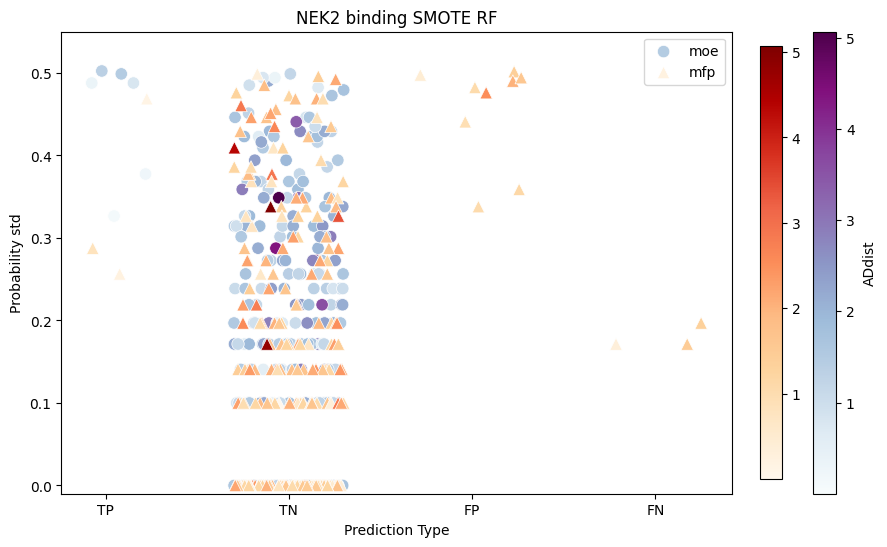

NEK2 SMOTE RF_BCW


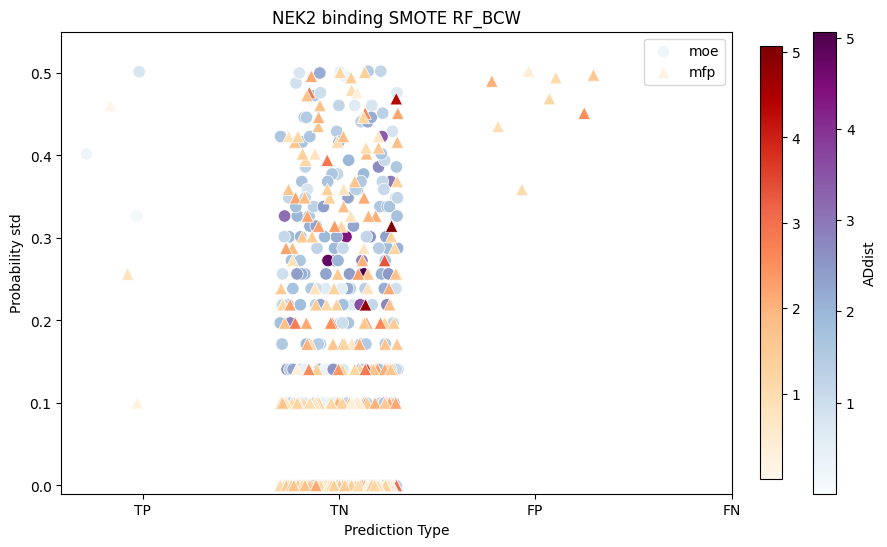

NEK2 SMOTE BRFC


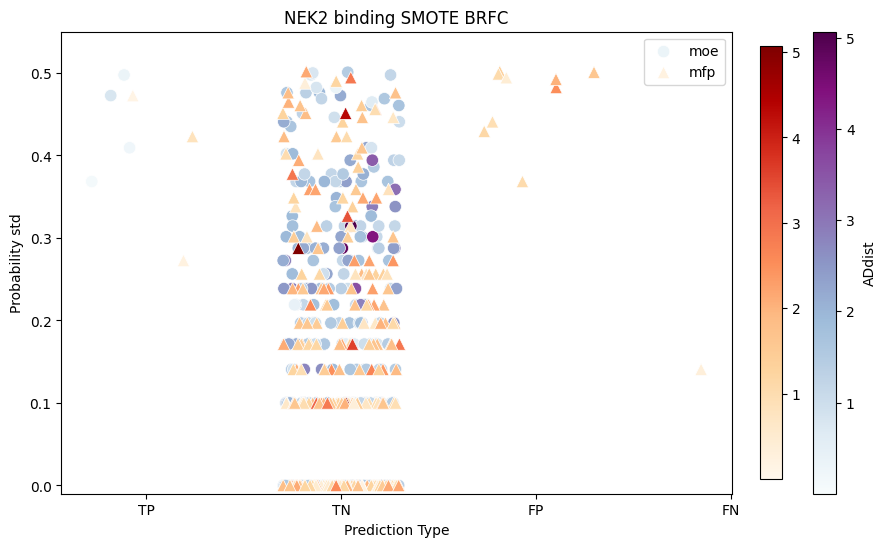

NEK2 SMOTE BRFC_BCW


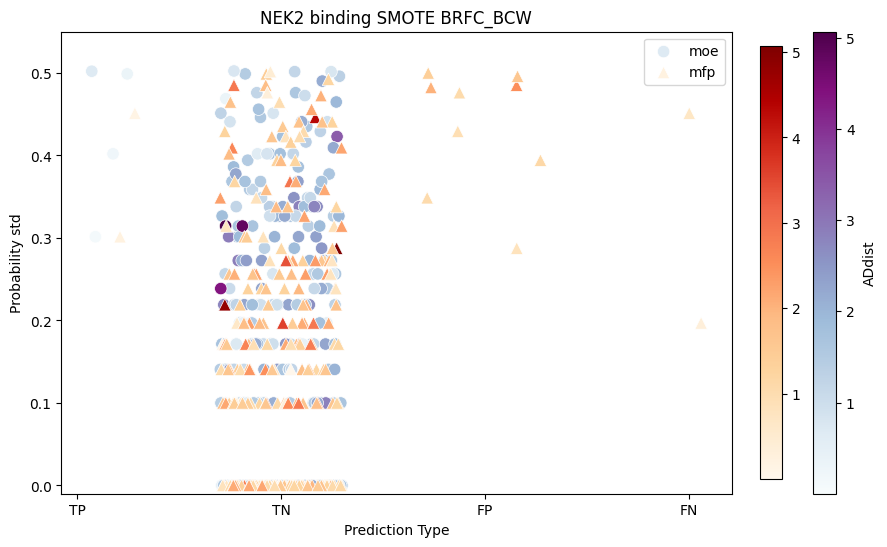

NEK2 ADASYN RF


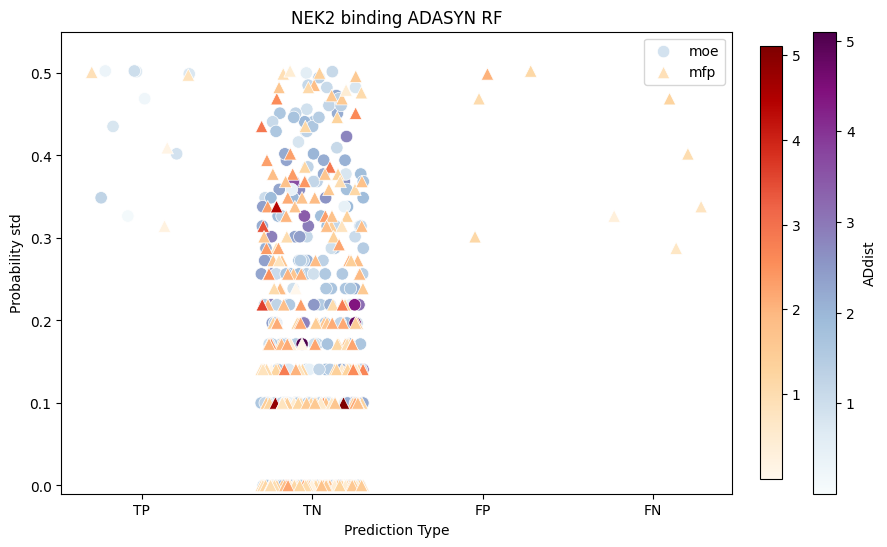

NEK2 ADASYN RF_BCW


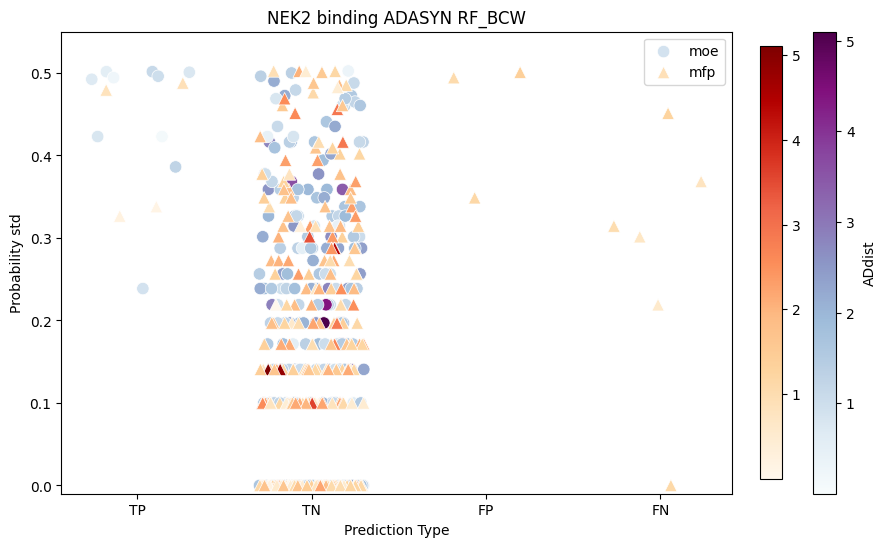

NEK2 ADASYN BRFC


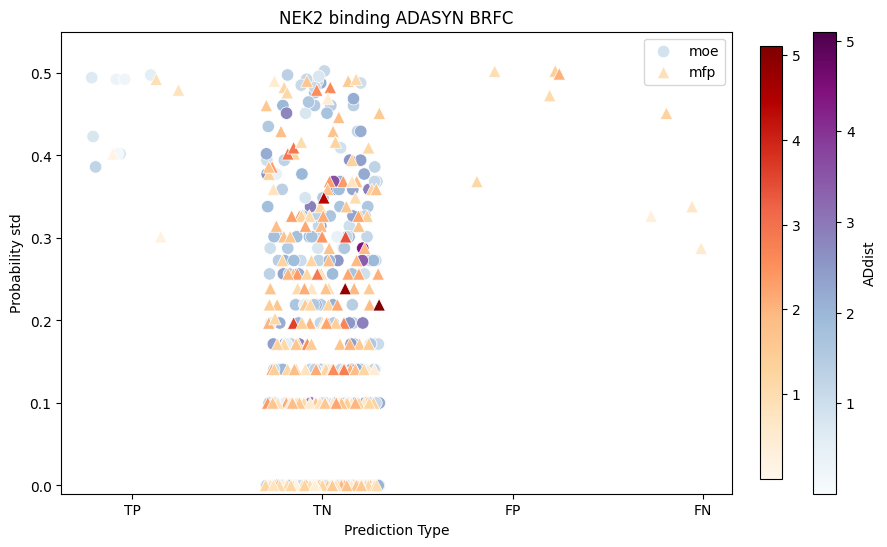

NEK2 ADASYN BRFC_BCW


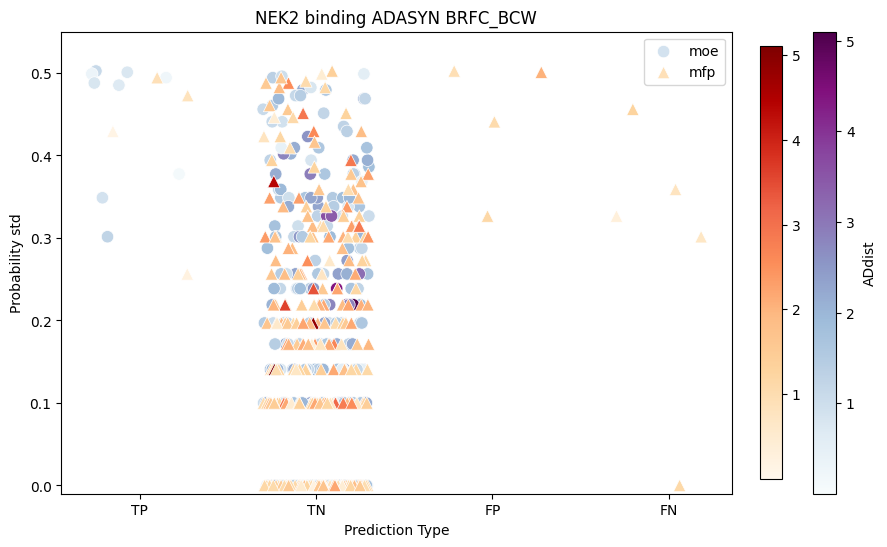

NEK2 scaled RF


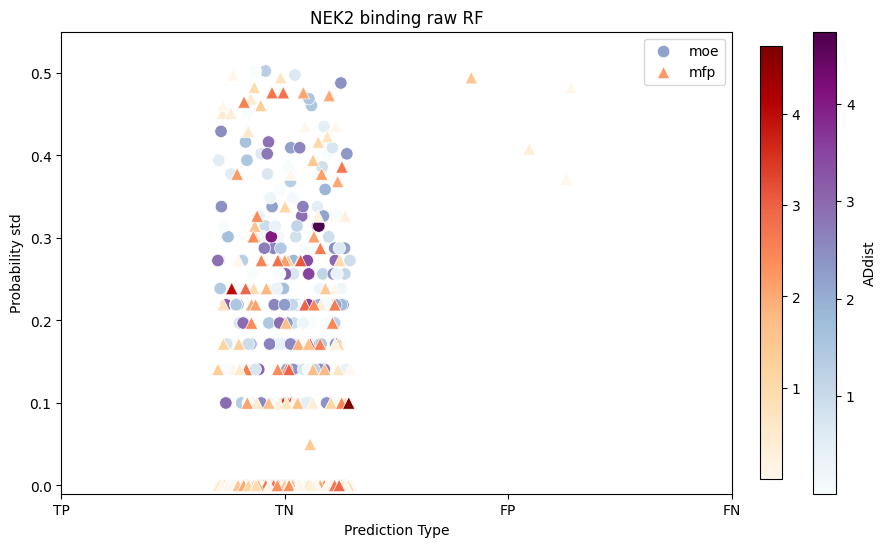

NEK2 scaled RF_BCW


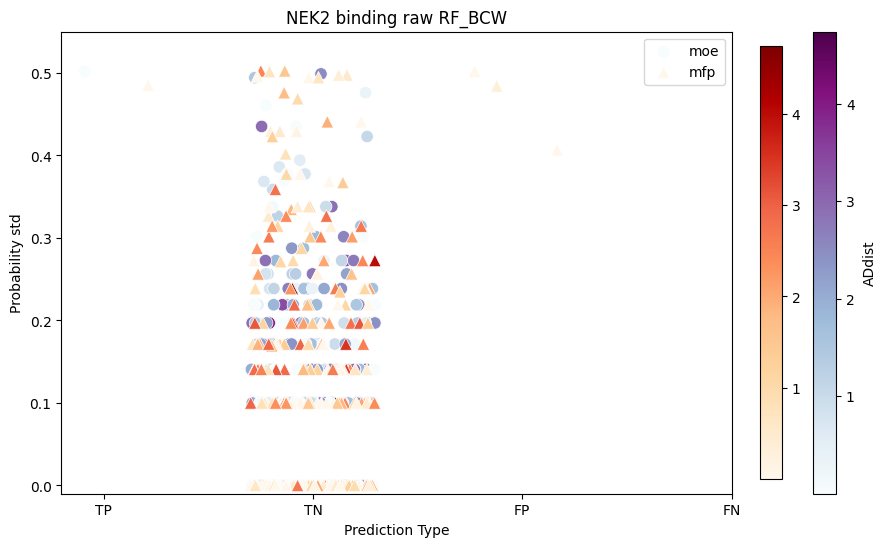

NEK2 scaled BRFC


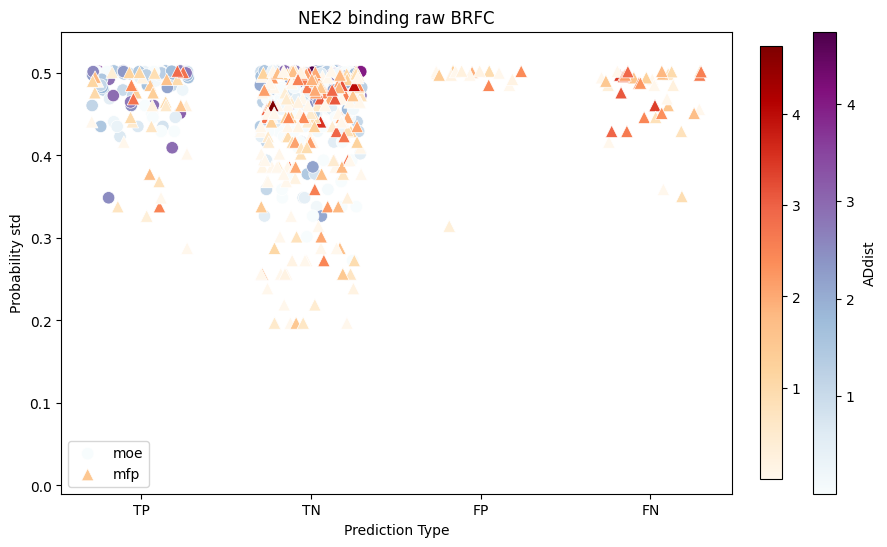

NEK2 scaled BRFC_BCW


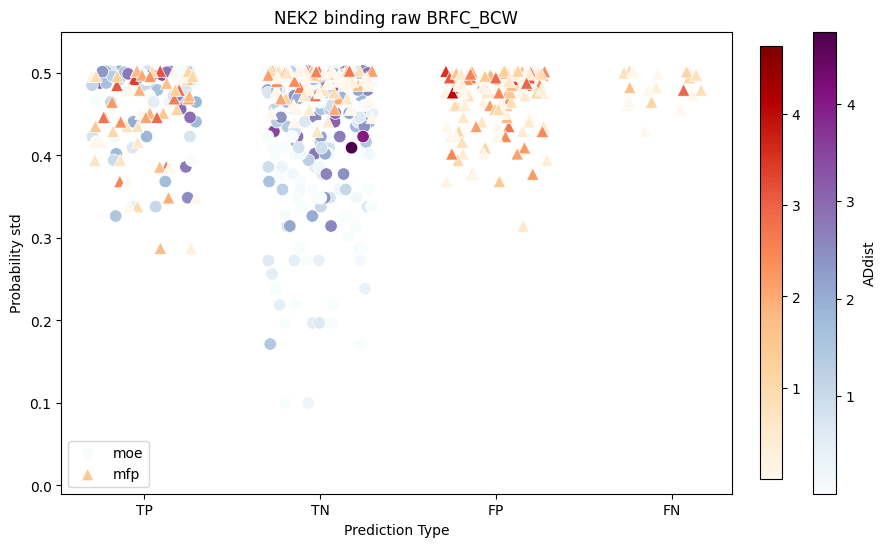

NEK2 UNDER RF


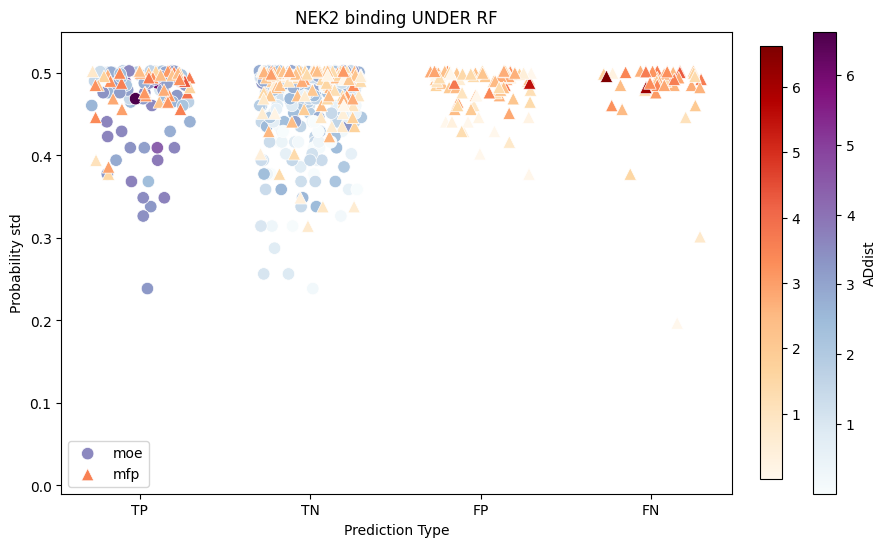

NEK2 UNDER RF_BCW


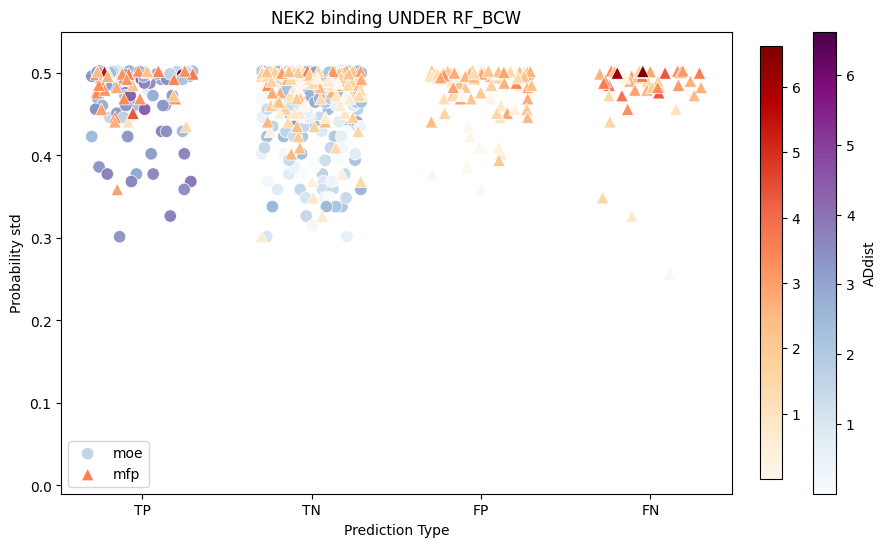

NEK2 UNDER BRFC


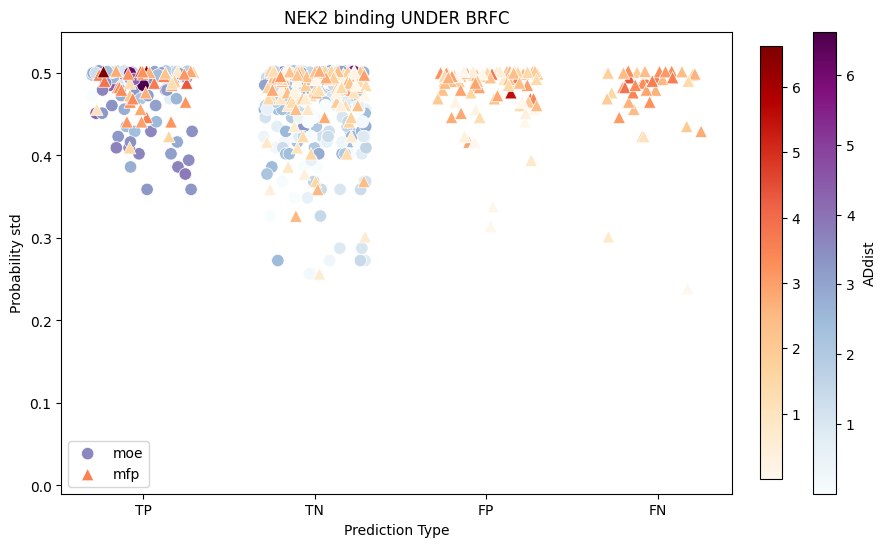

NEK2 UNDER BRFC_BCW


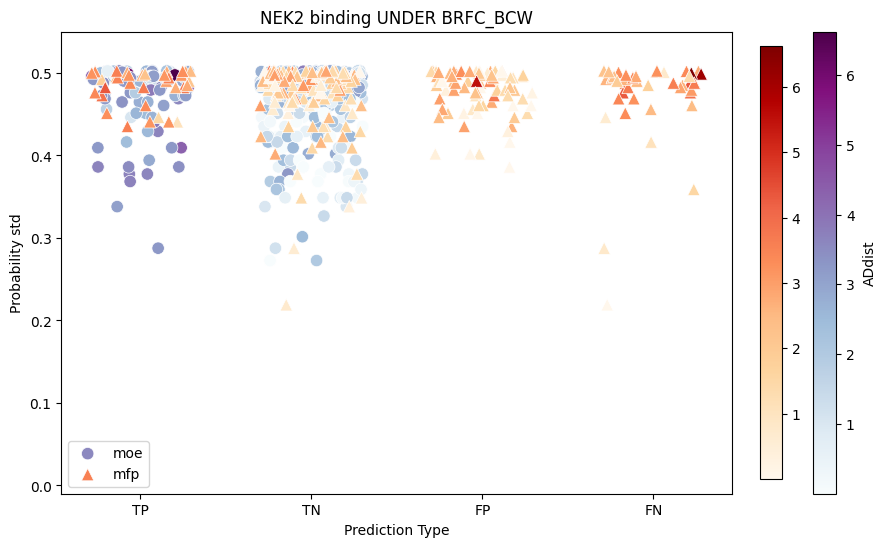

NEK2 SMOTE RF


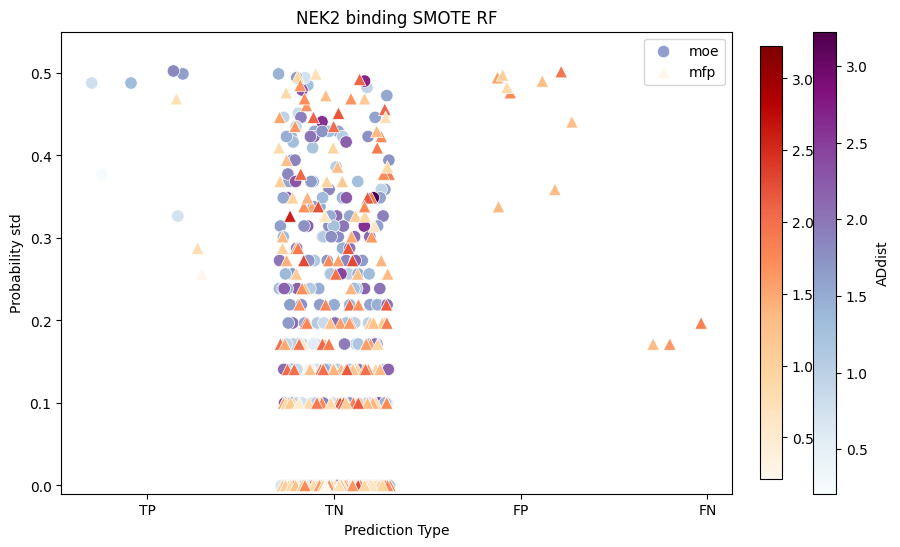

NEK2 SMOTE RF_BCW


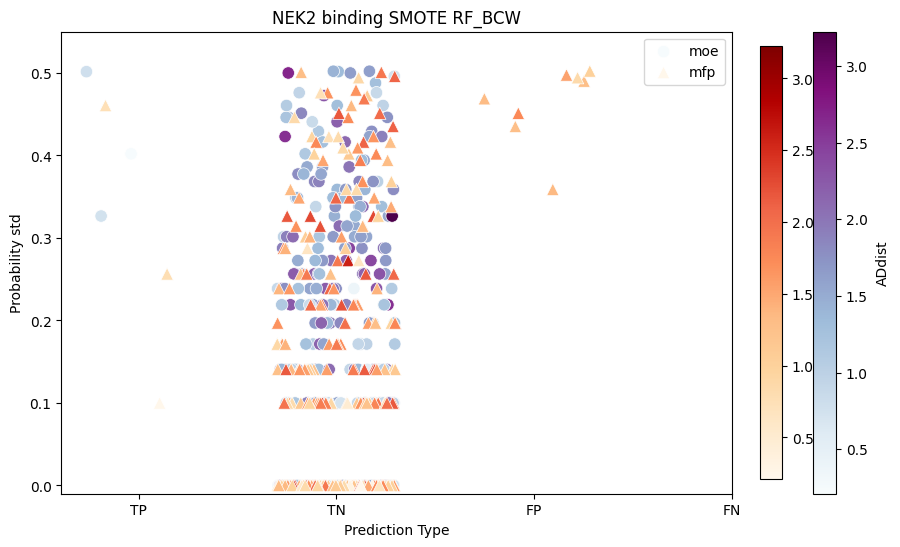

NEK2 SMOTE BRFC


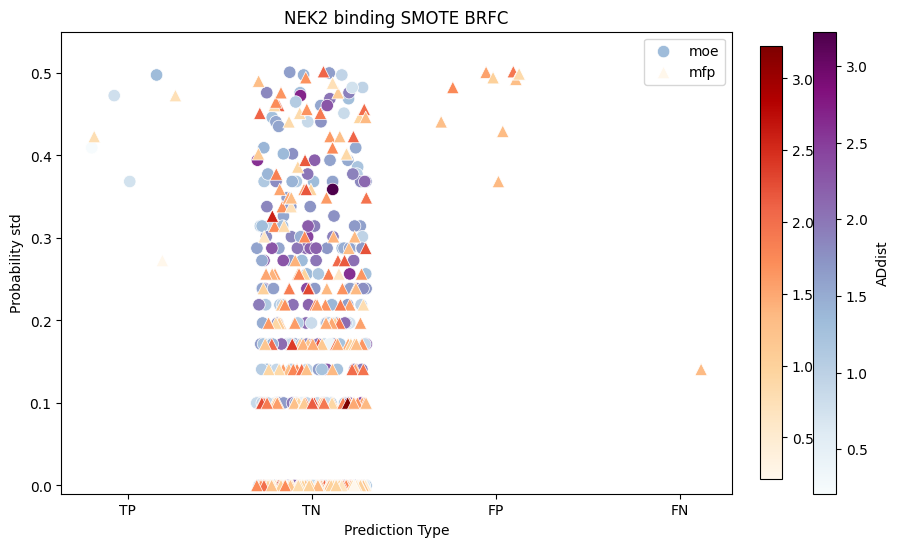

NEK2 SMOTE BRFC_BCW


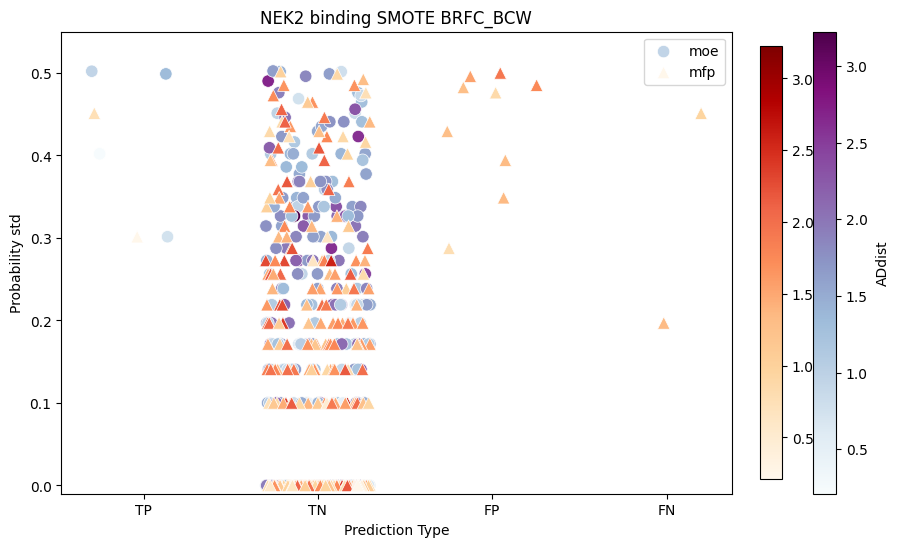

NEK2 ADASYN RF


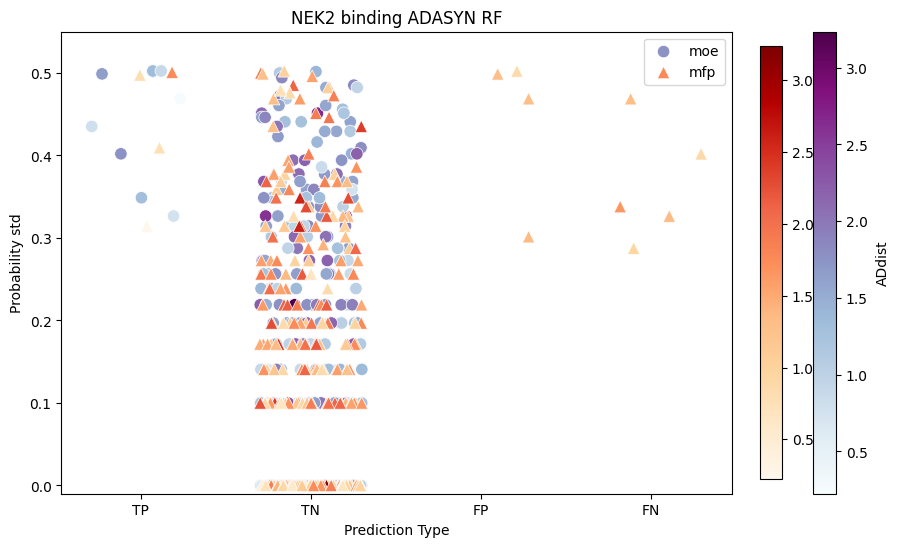

NEK2 ADASYN RF_BCW


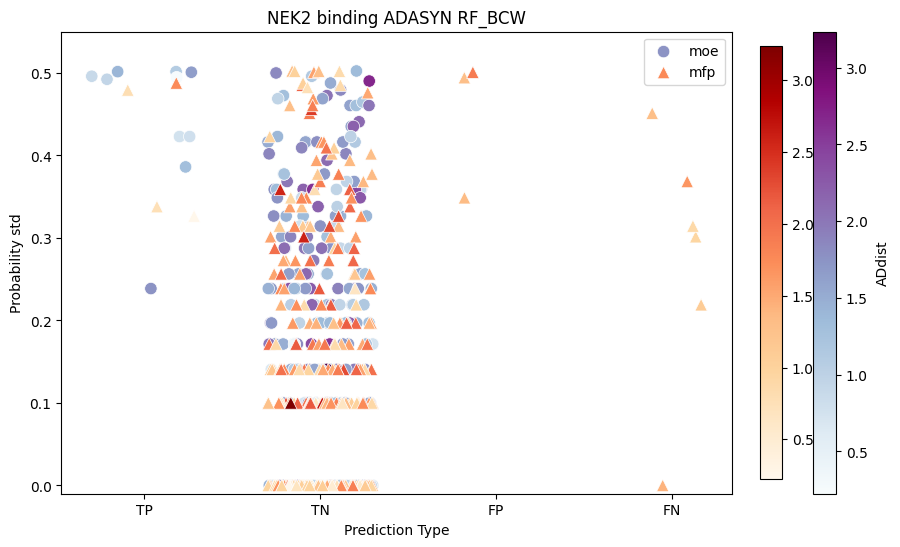

NEK2 ADASYN BRFC


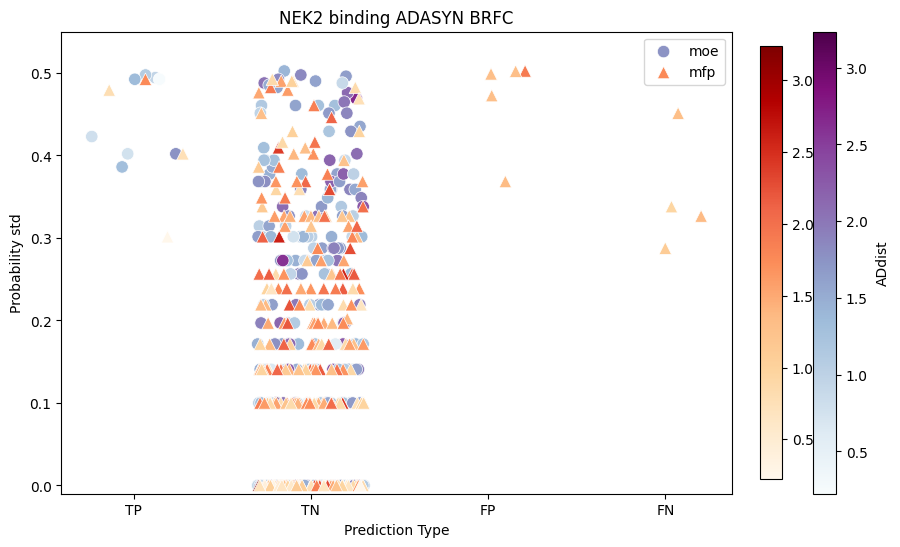

NEK2 ADASYN BRFC_BCW


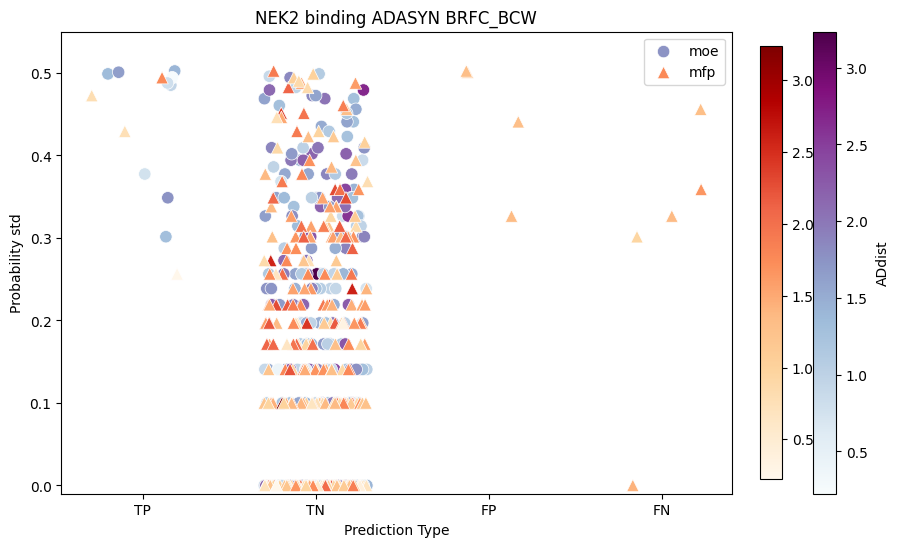

NEK3 scaled RF


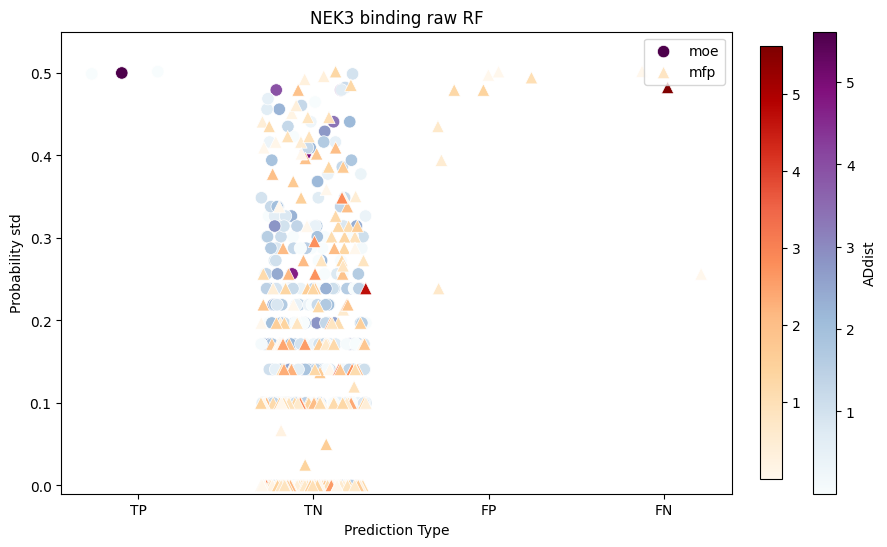

NEK3 scaled RF_BCW


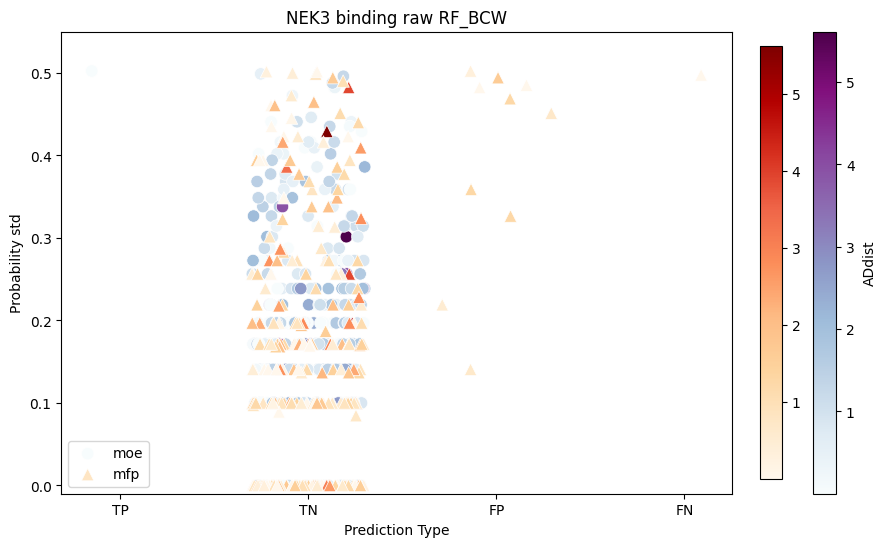

NEK3 scaled BRFC


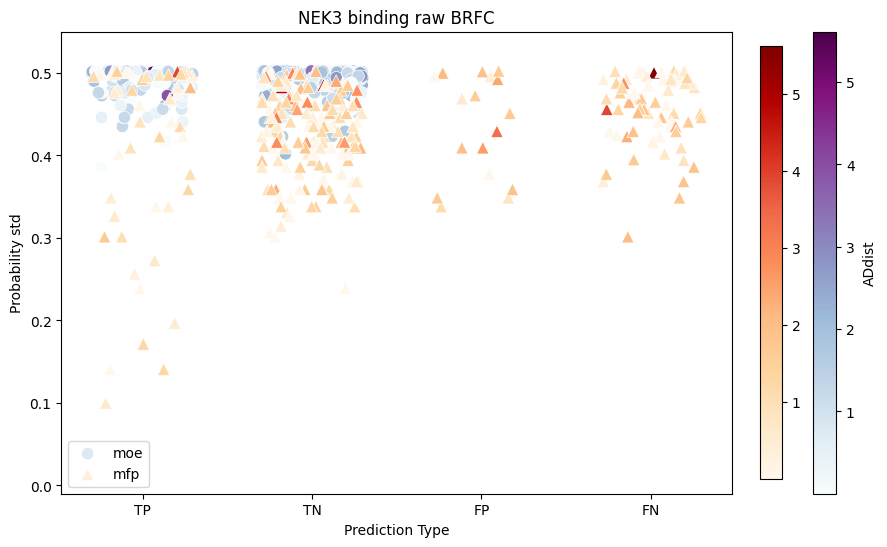

NEK3 scaled BRFC_BCW


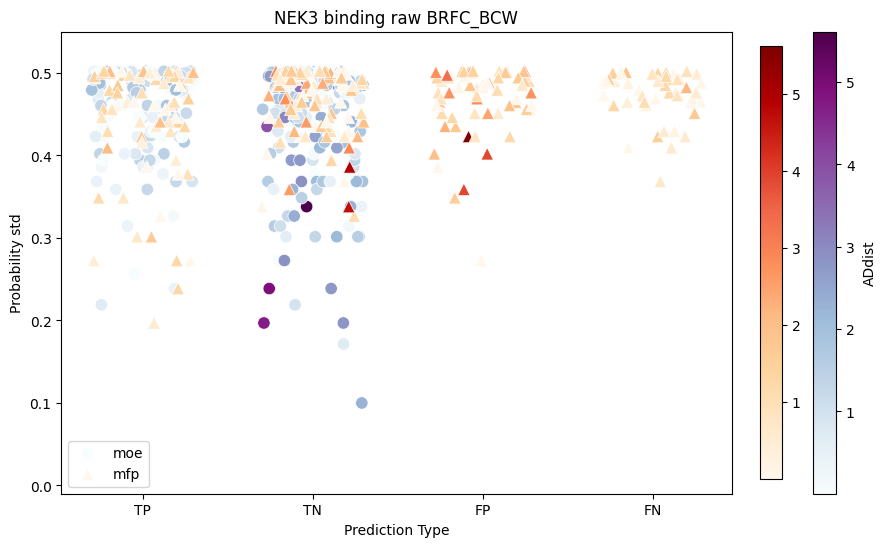

NEK3 UNDER RF


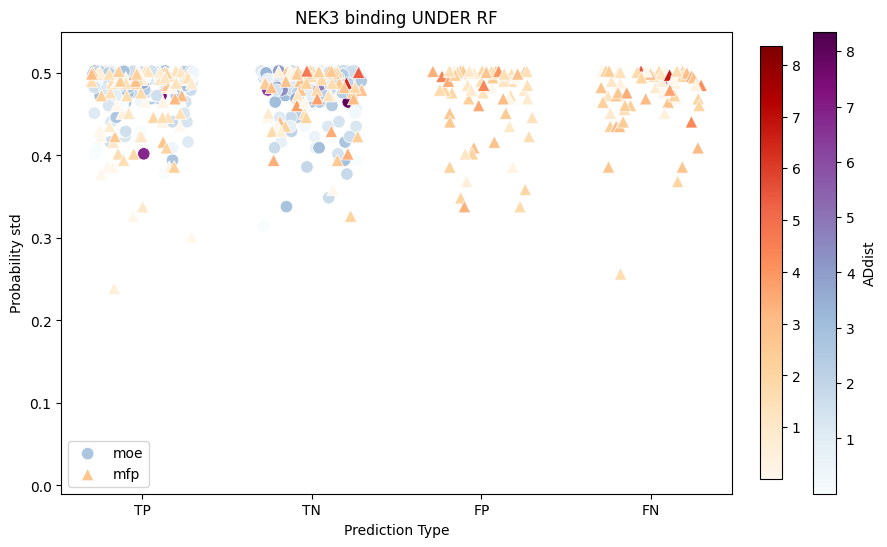

NEK3 UNDER RF_BCW


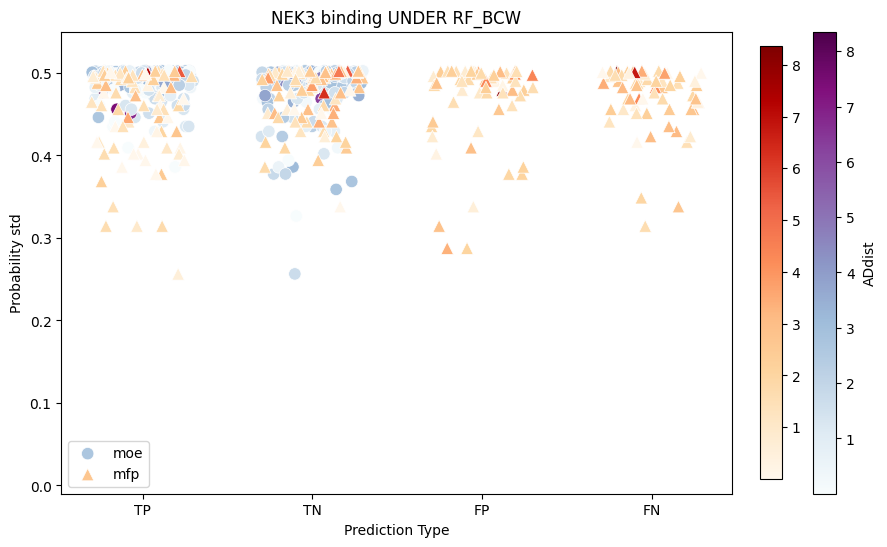

NEK3 UNDER BRFC


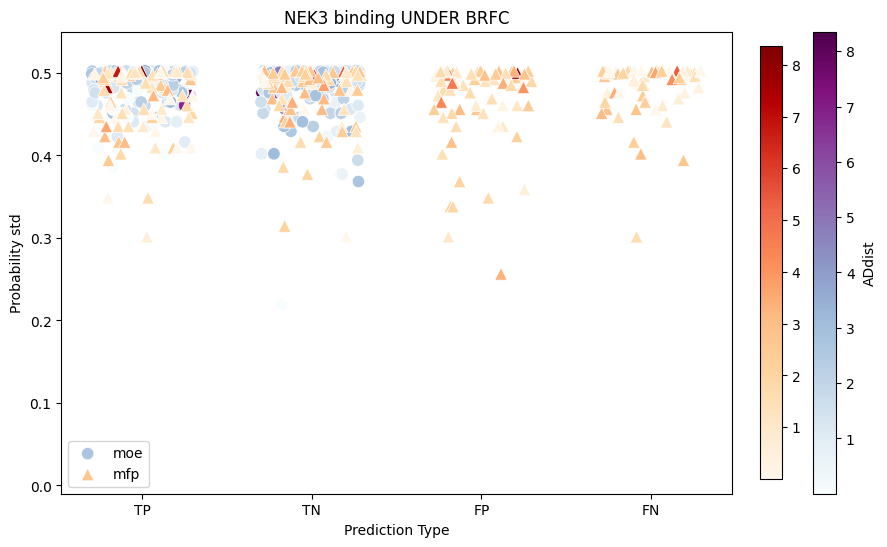

NEK3 UNDER BRFC_BCW


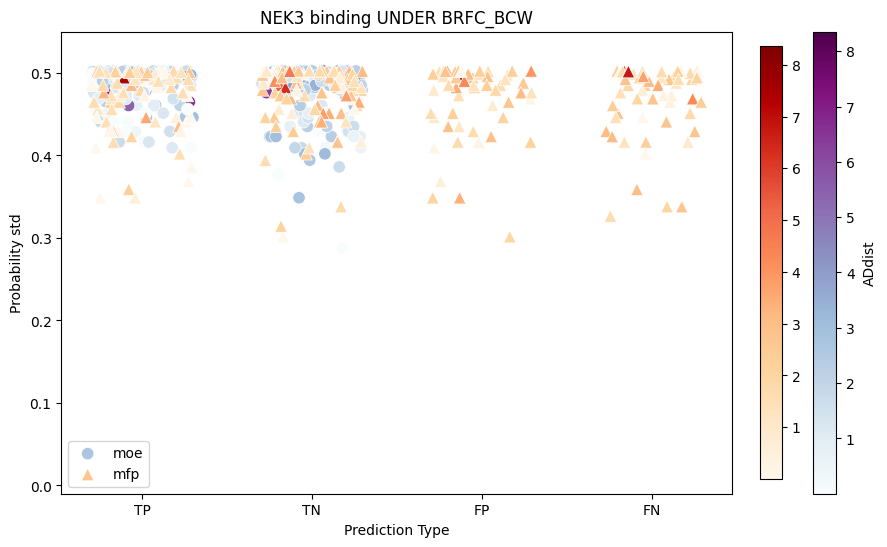

NEK3 SMOTE RF


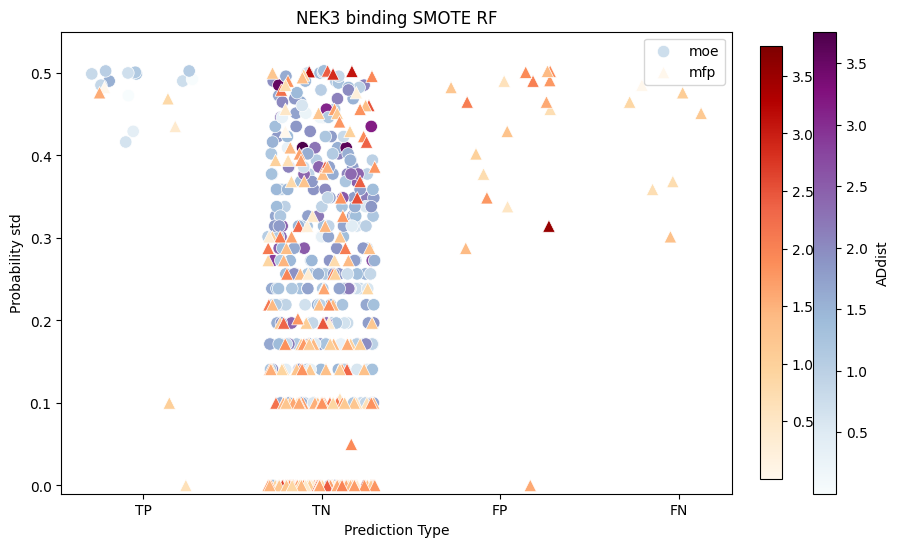

NEK3 SMOTE RF_BCW


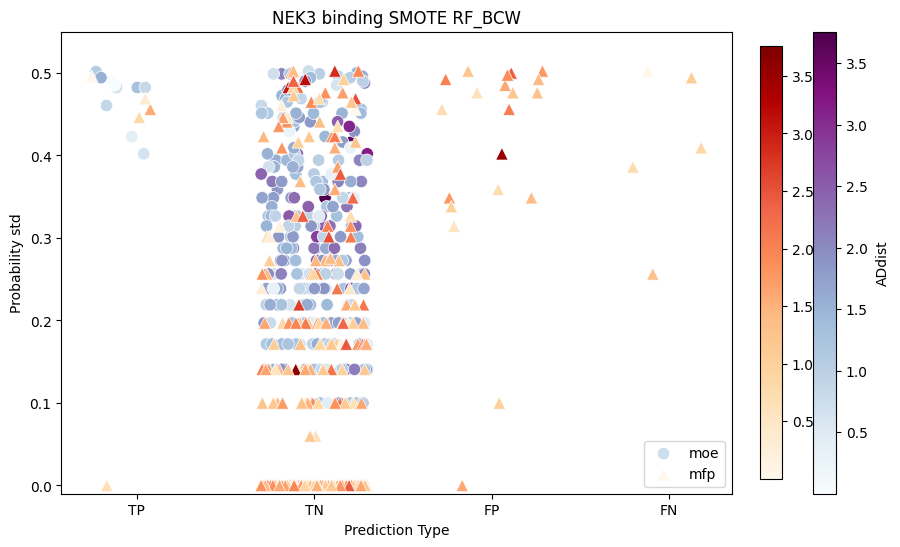

NEK3 SMOTE BRFC


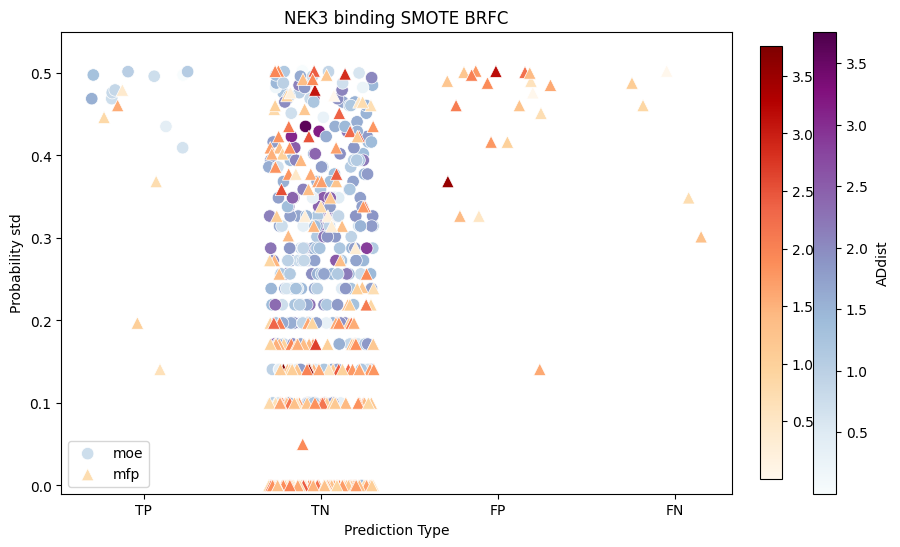

NEK3 SMOTE BRFC_BCW


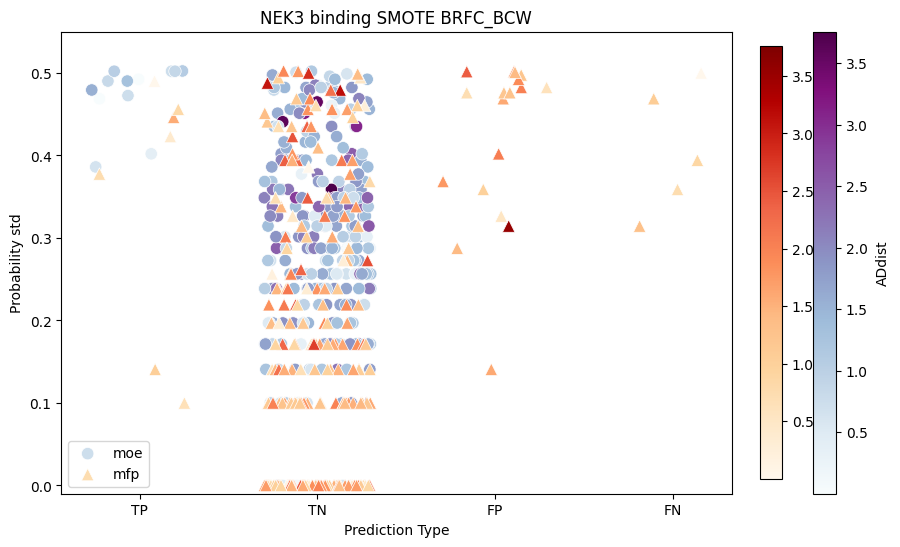

NEK3 ADASYN RF


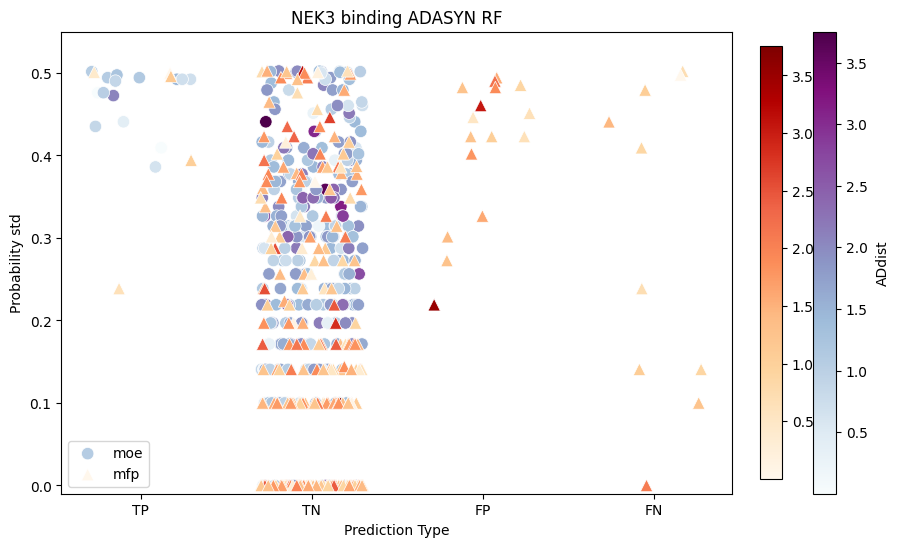

NEK3 ADASYN RF_BCW


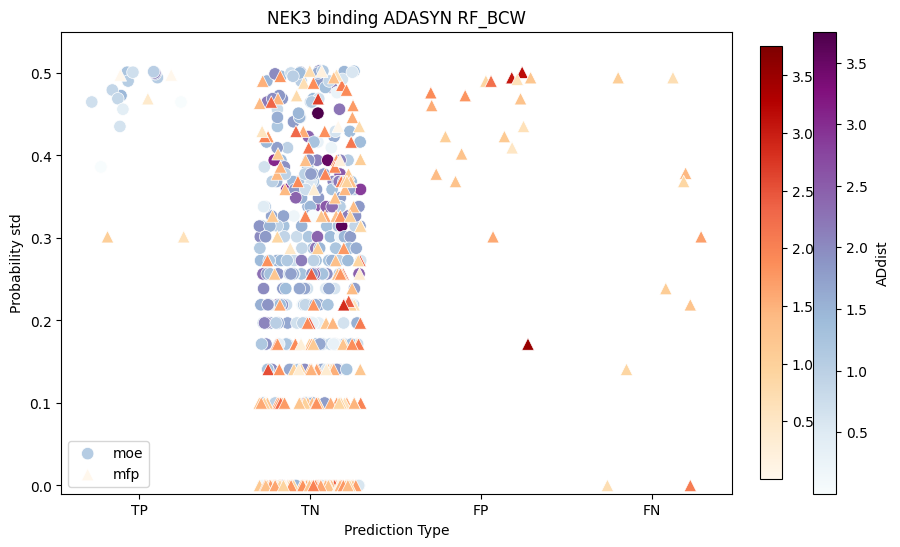

NEK3 ADASYN BRFC


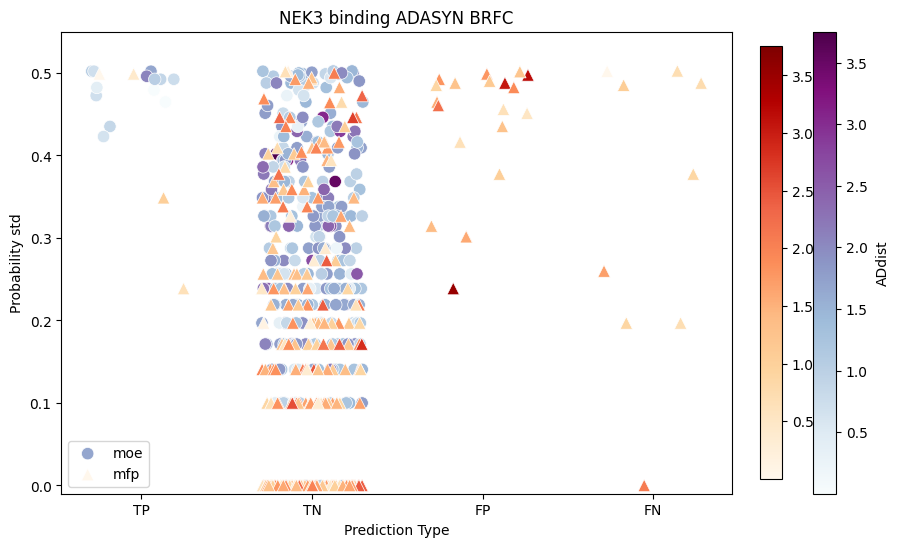

NEK3 ADASYN BRFC_BCW


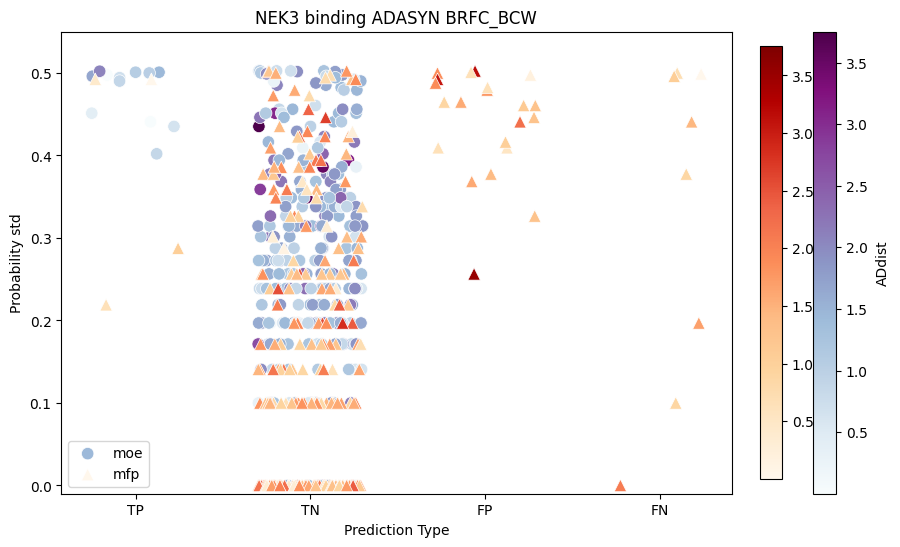

NEK3 scaled RF


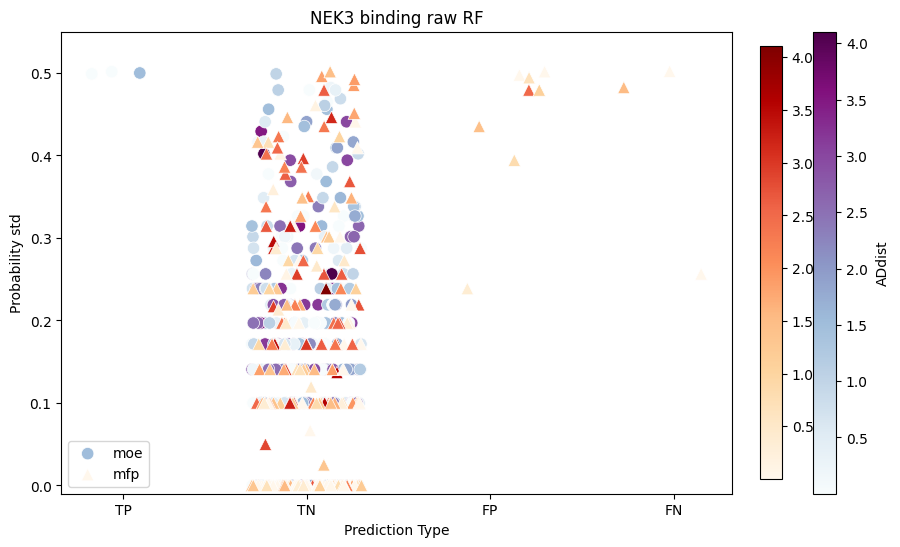

NEK3 scaled RF_BCW


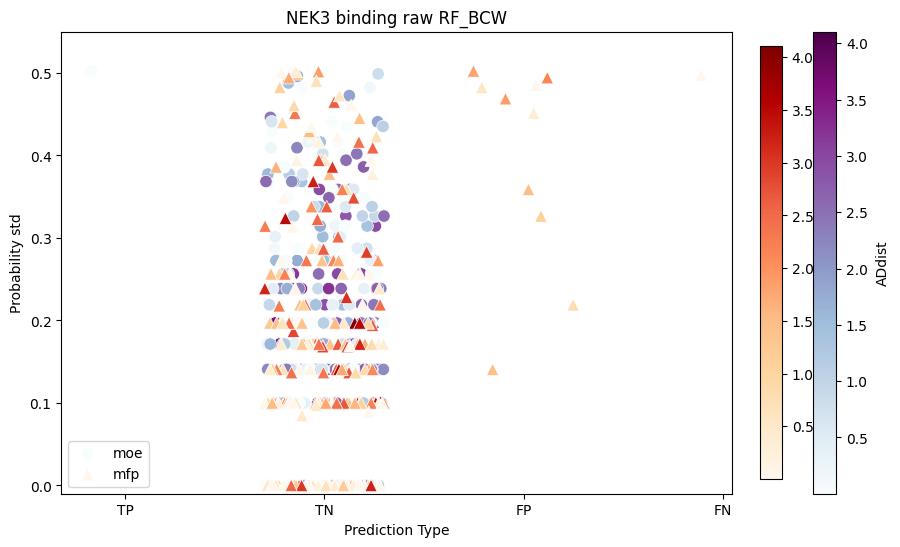

NEK3 scaled BRFC


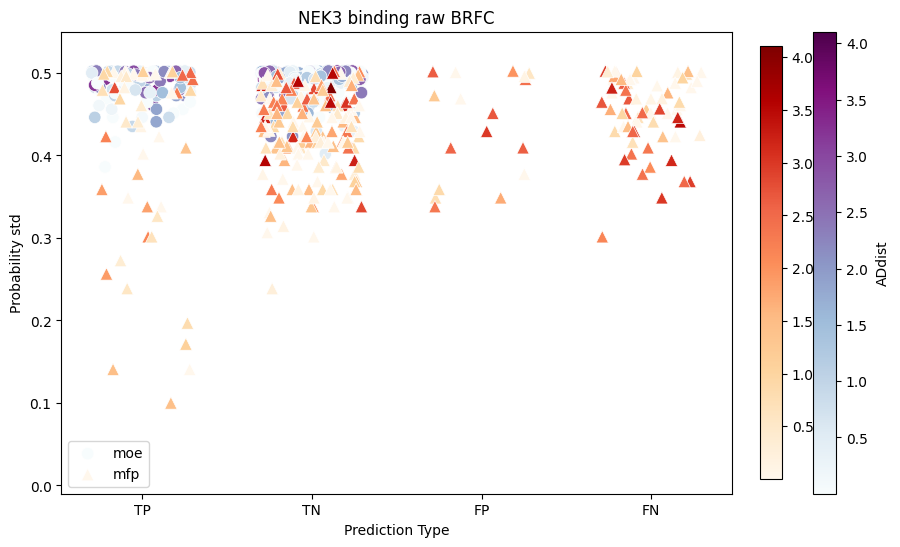

NEK3 scaled BRFC_BCW


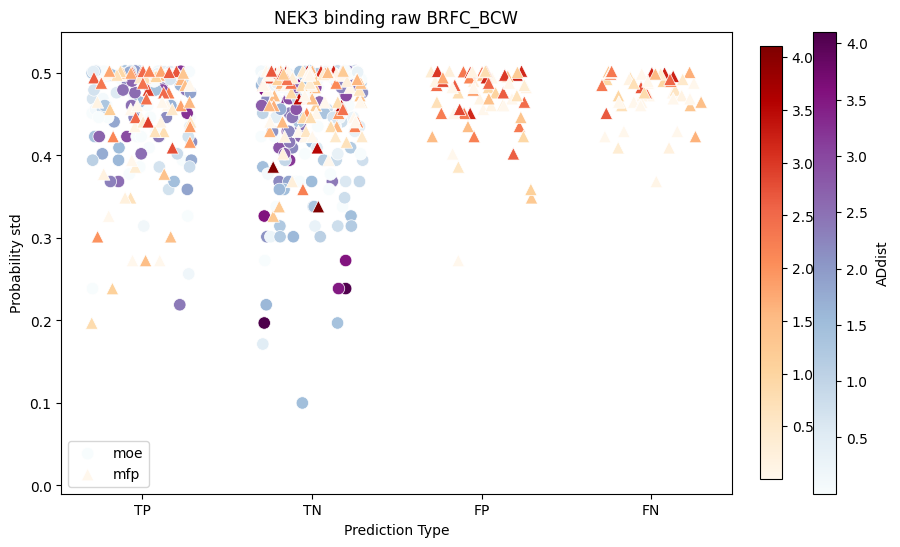

NEK3 UNDER RF


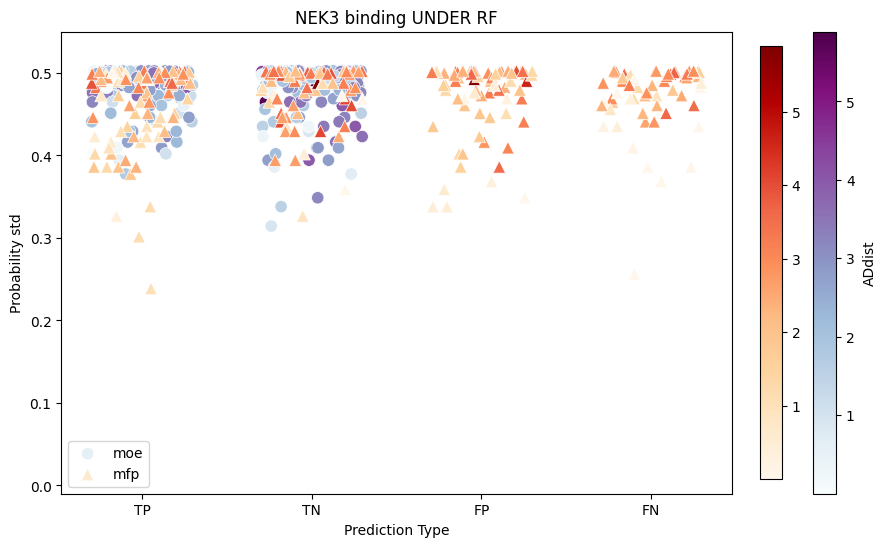

NEK3 UNDER RF_BCW


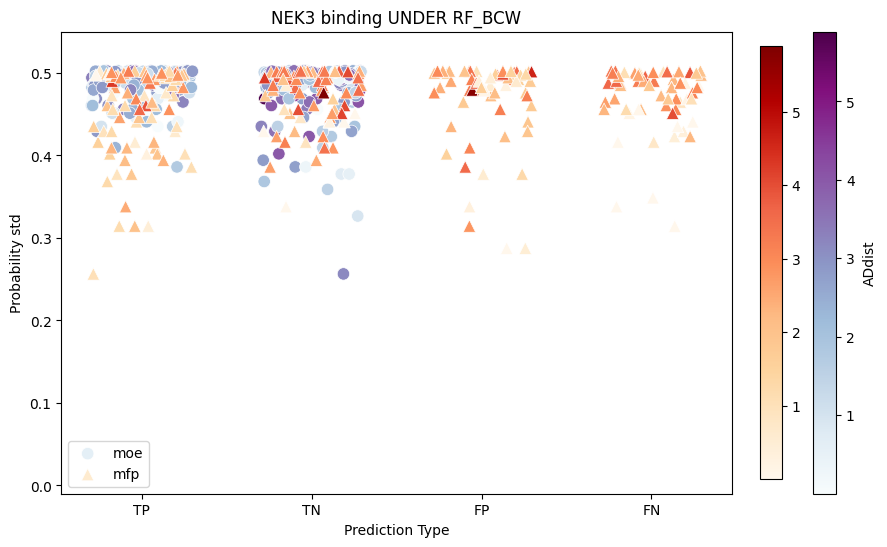

NEK3 UNDER BRFC


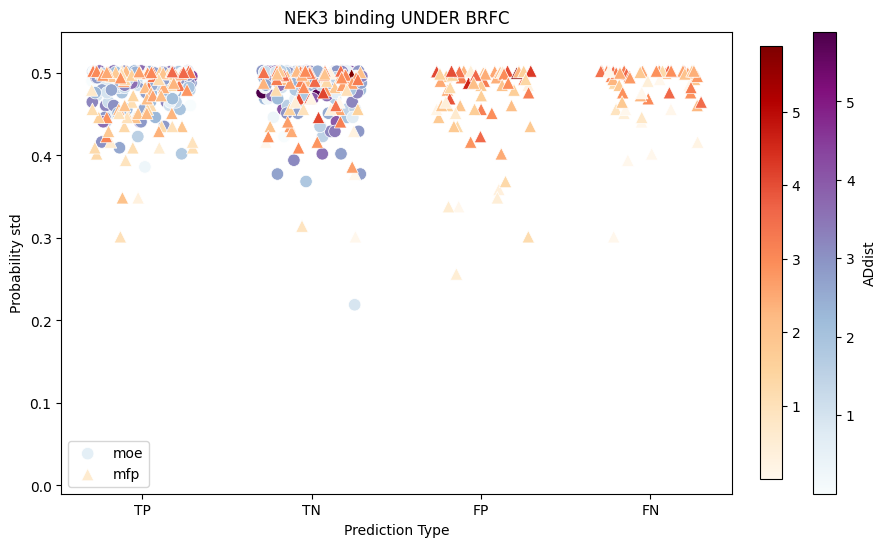

NEK3 UNDER BRFC_BCW


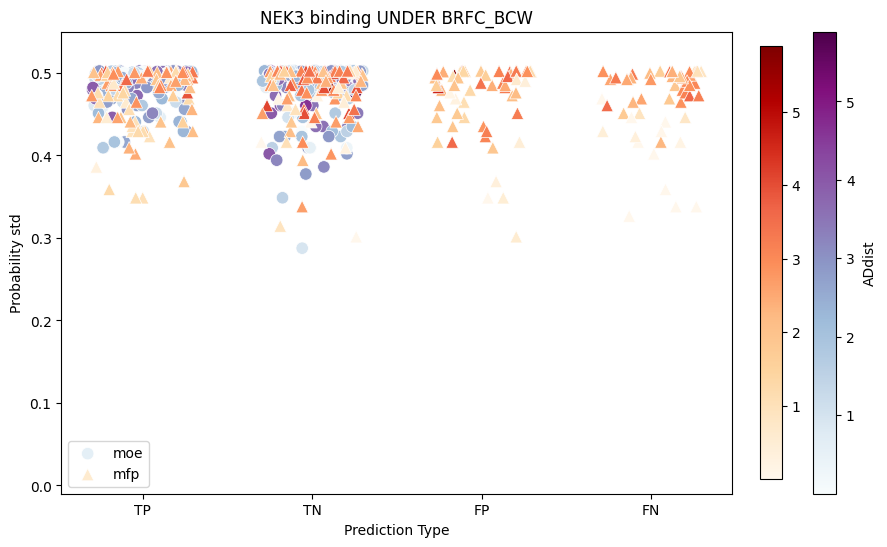

NEK3 SMOTE RF


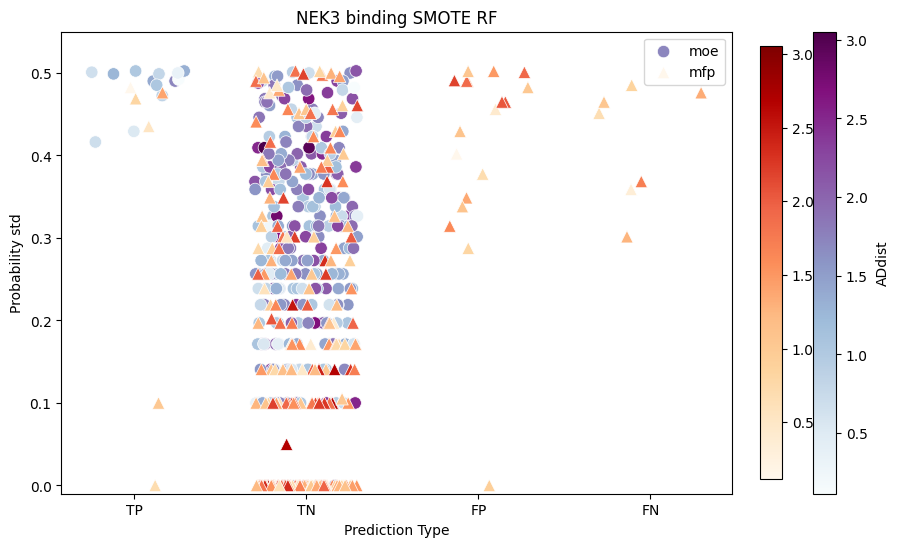

NEK3 SMOTE RF_BCW


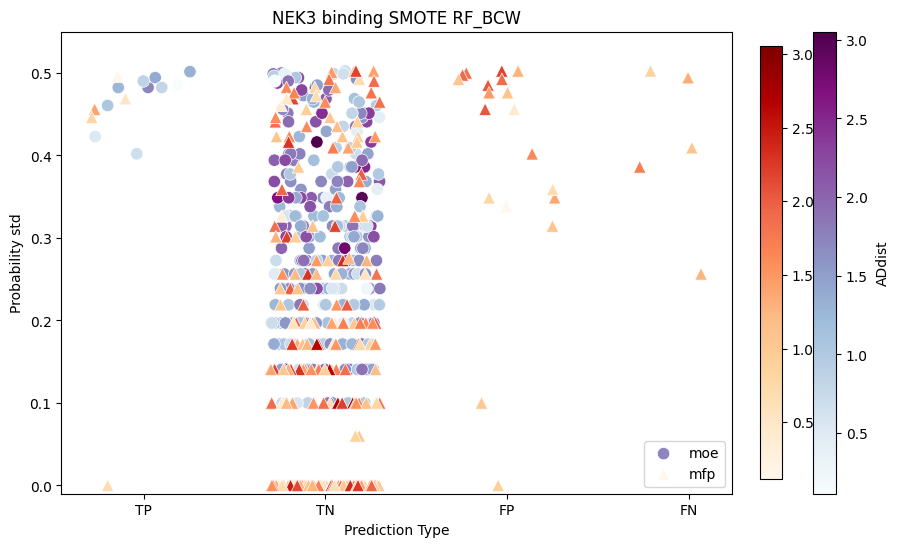

NEK3 SMOTE BRFC


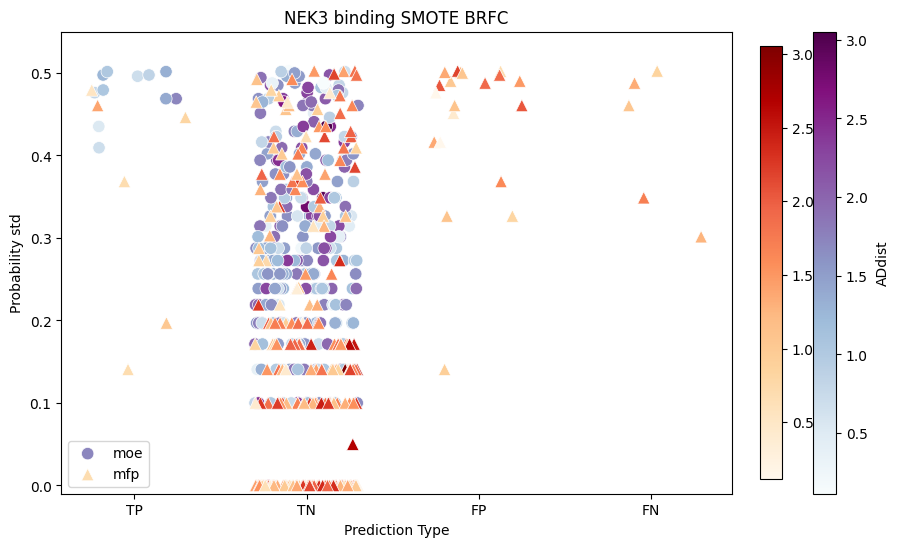

NEK3 SMOTE BRFC_BCW


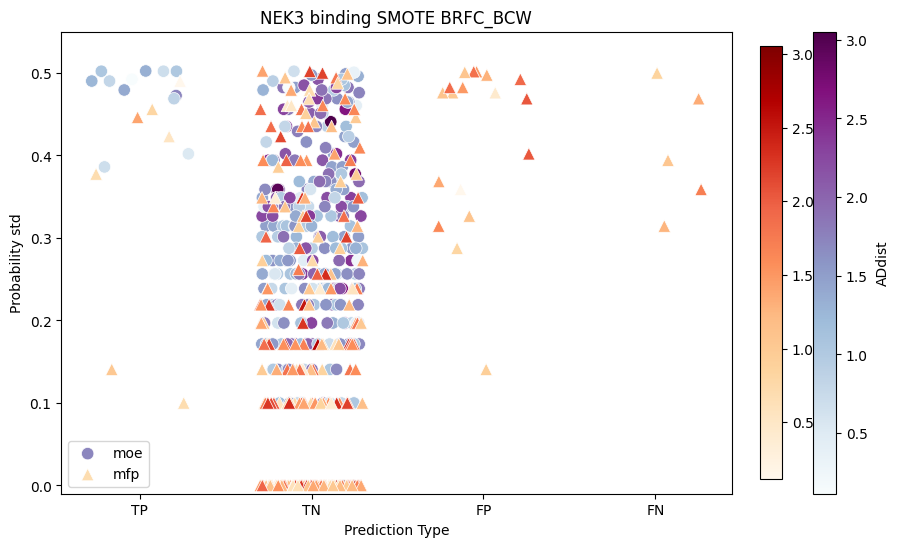

NEK3 ADASYN RF


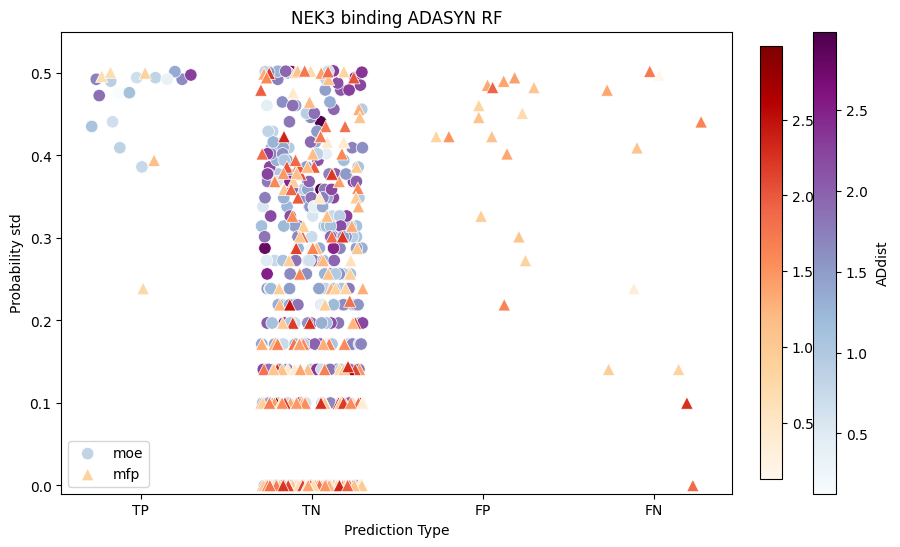

NEK3 ADASYN RF_BCW


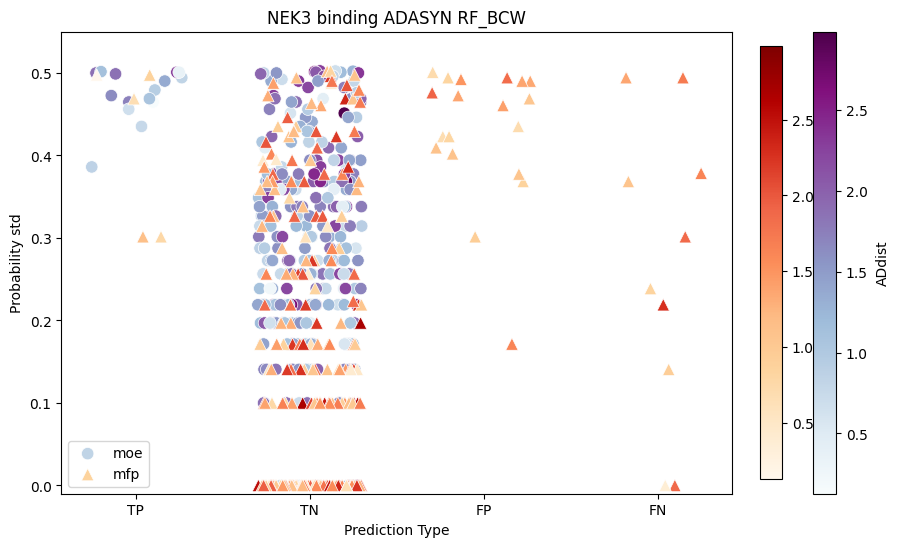

NEK3 ADASYN BRFC


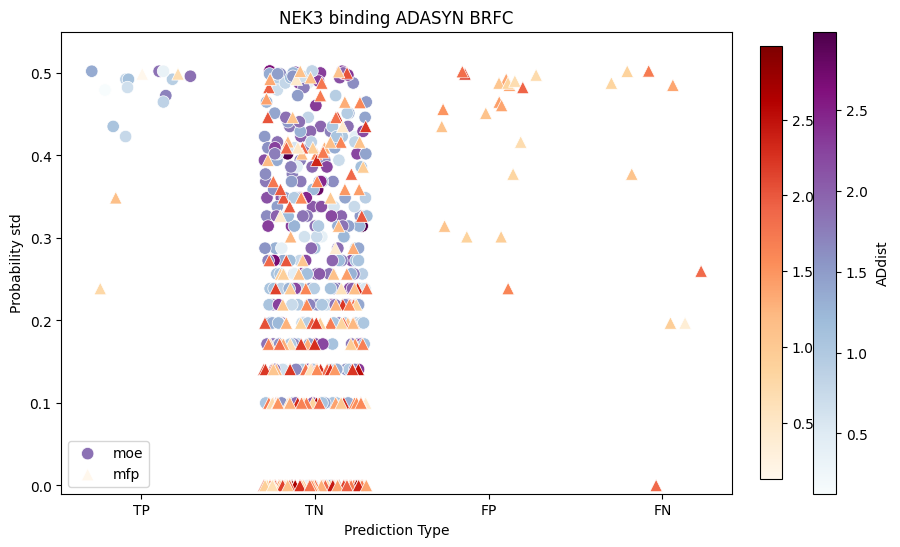

NEK3 ADASYN BRFC_BCW


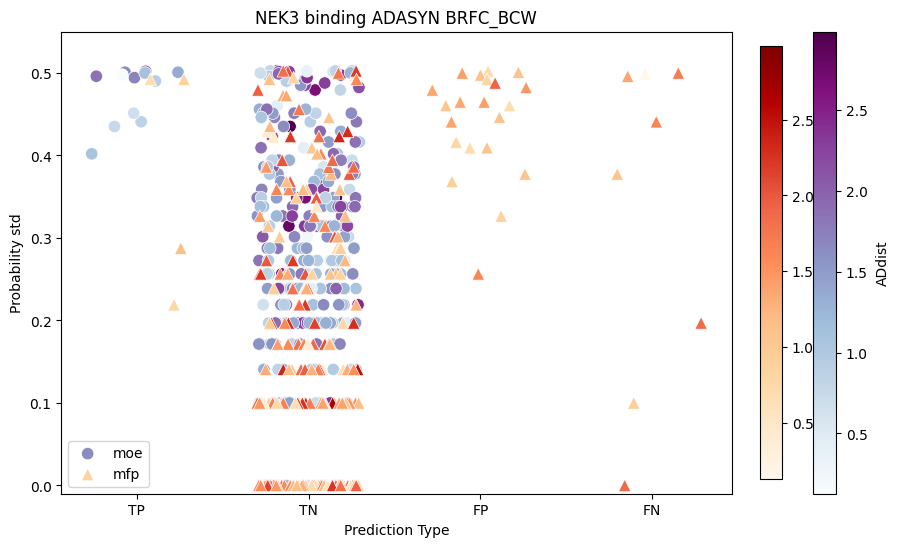

NEK5 scaled RF


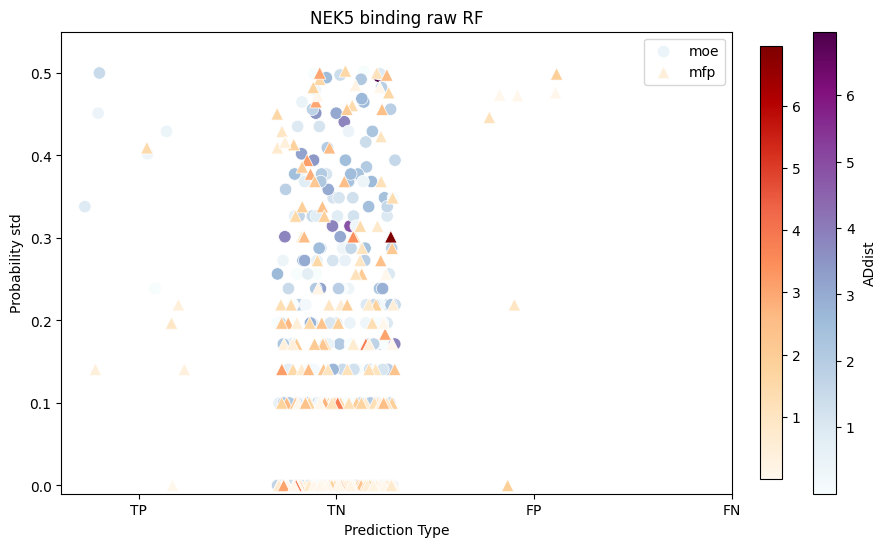

NEK5 scaled RF_BCW


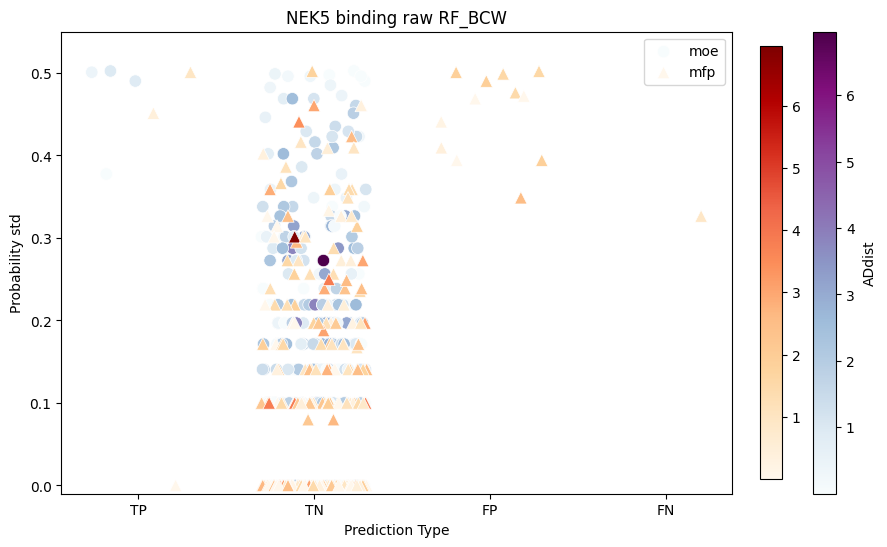

NEK5 scaled BRFC


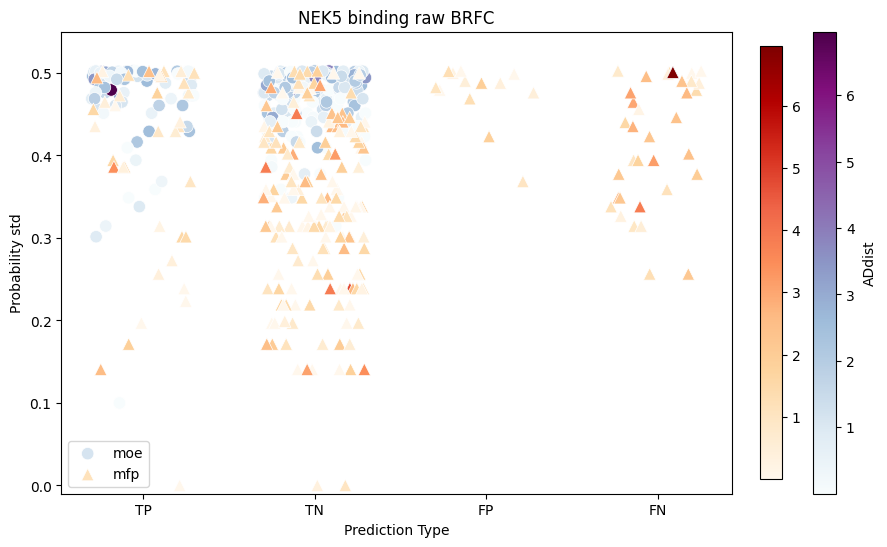

NEK5 scaled BRFC_BCW


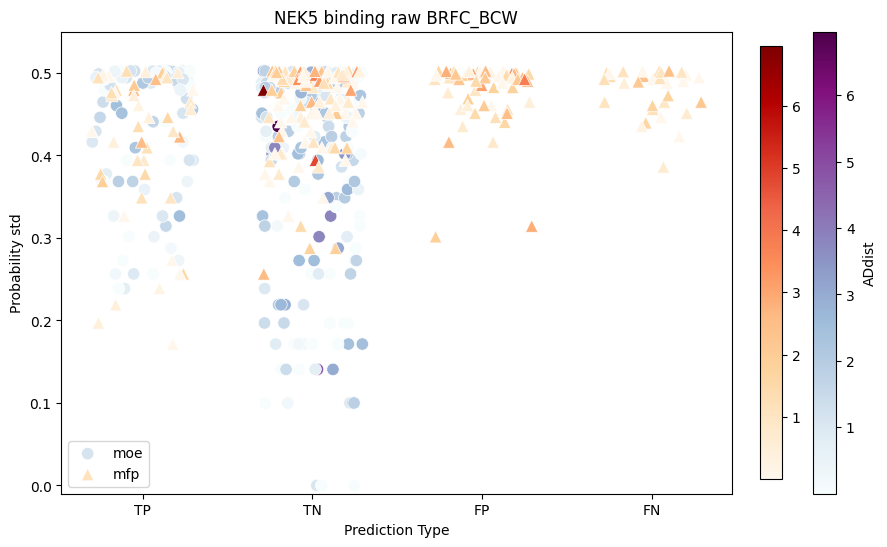

NEK5 UNDER RF


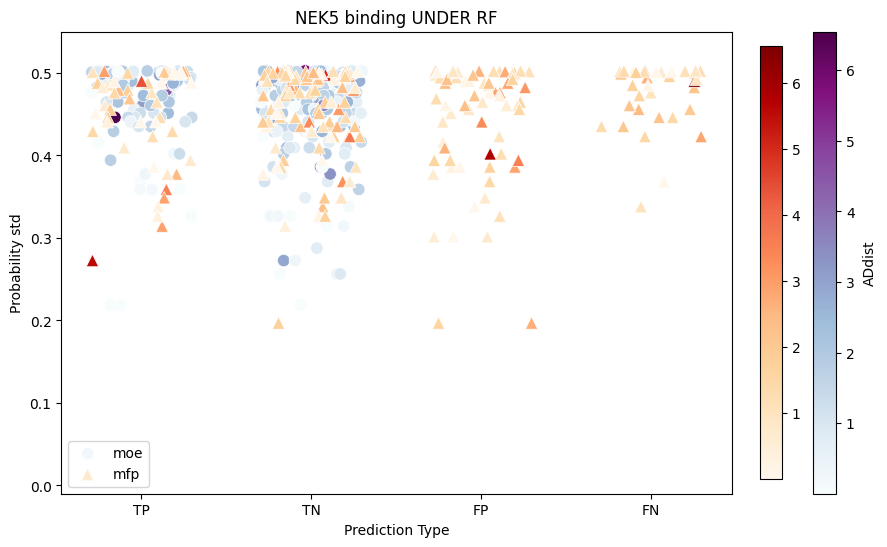

NEK5 UNDER RF_BCW


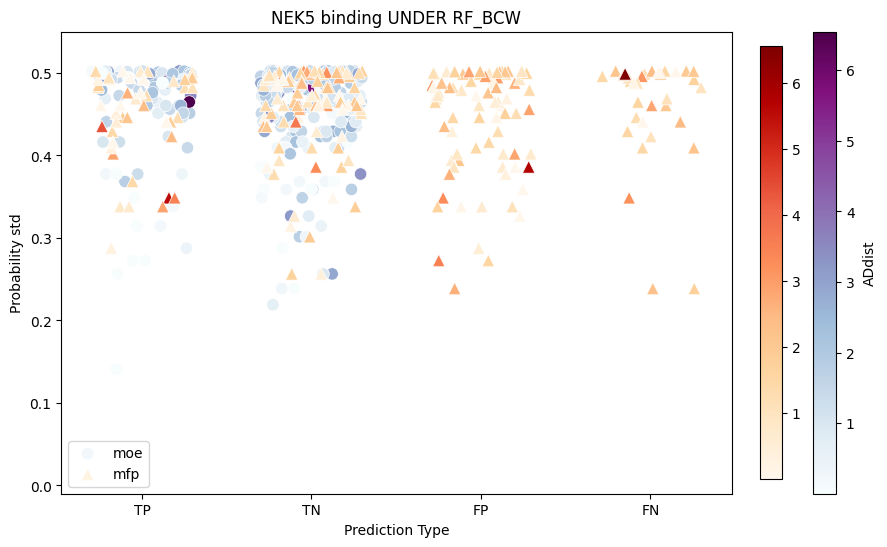

NEK5 UNDER BRFC


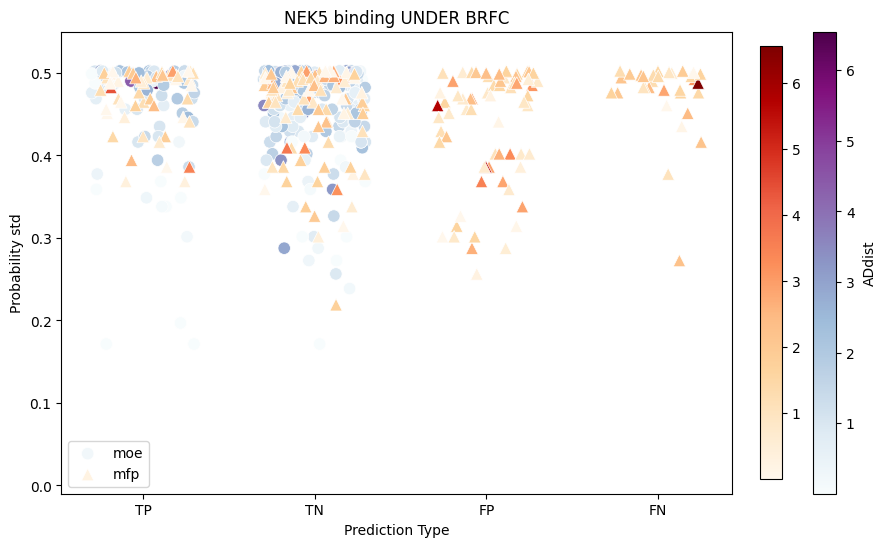

NEK5 UNDER BRFC_BCW


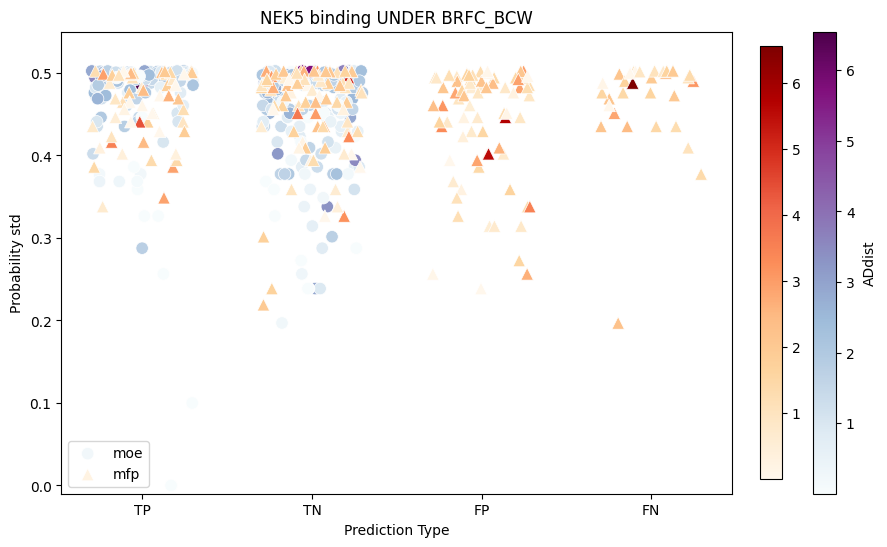

NEK5 SMOTE RF


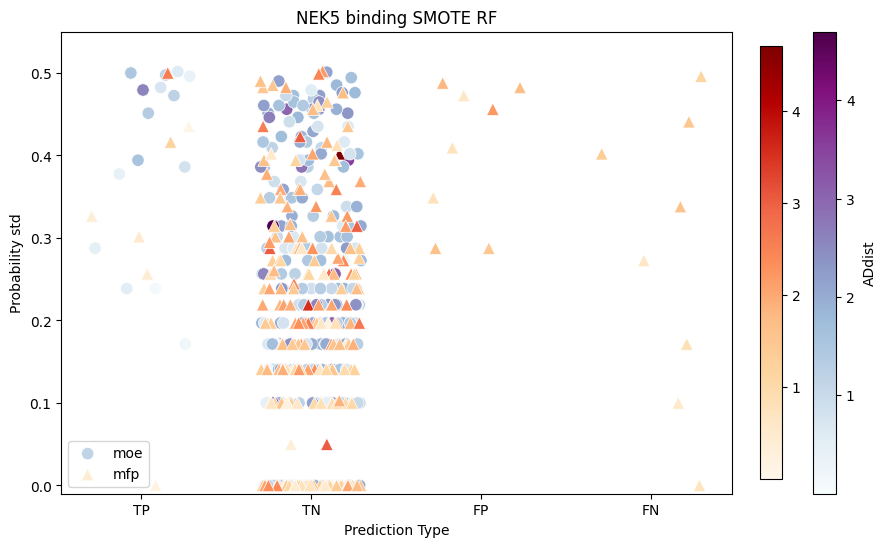

NEK5 SMOTE RF_BCW


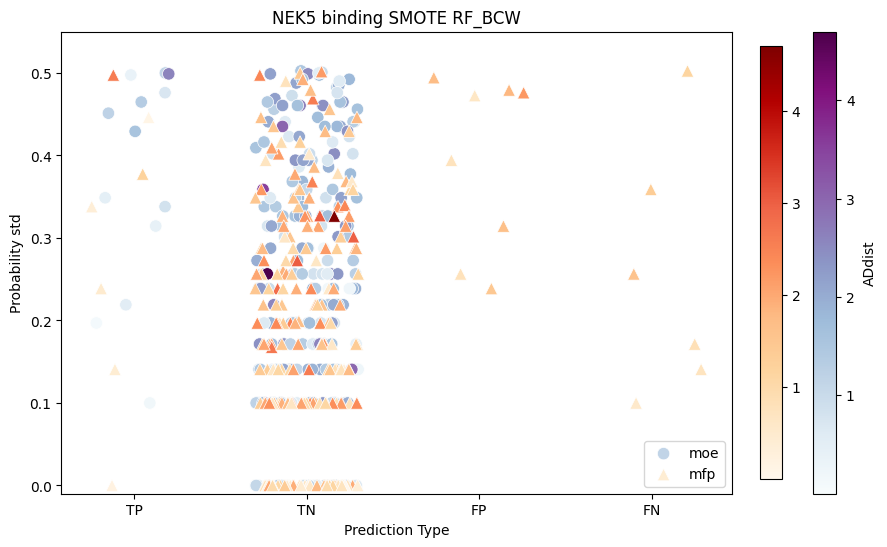

NEK5 SMOTE BRFC


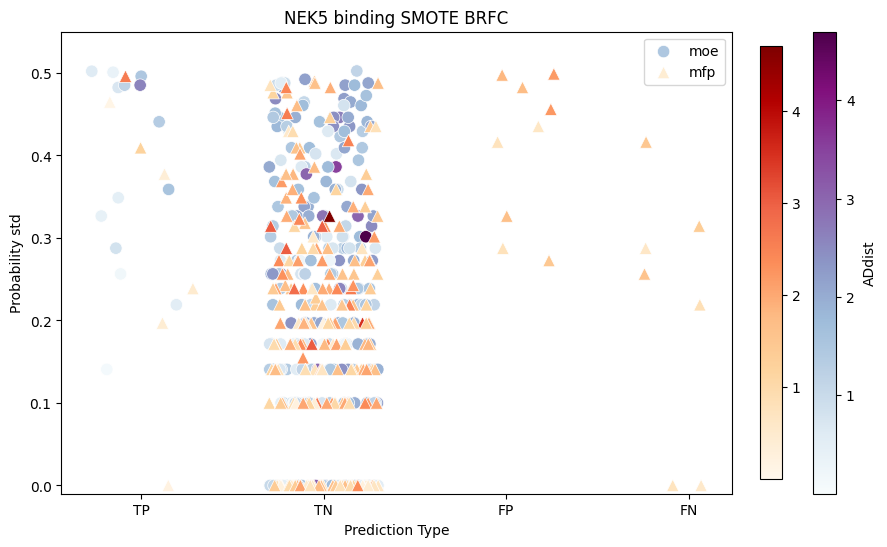

NEK5 SMOTE BRFC_BCW


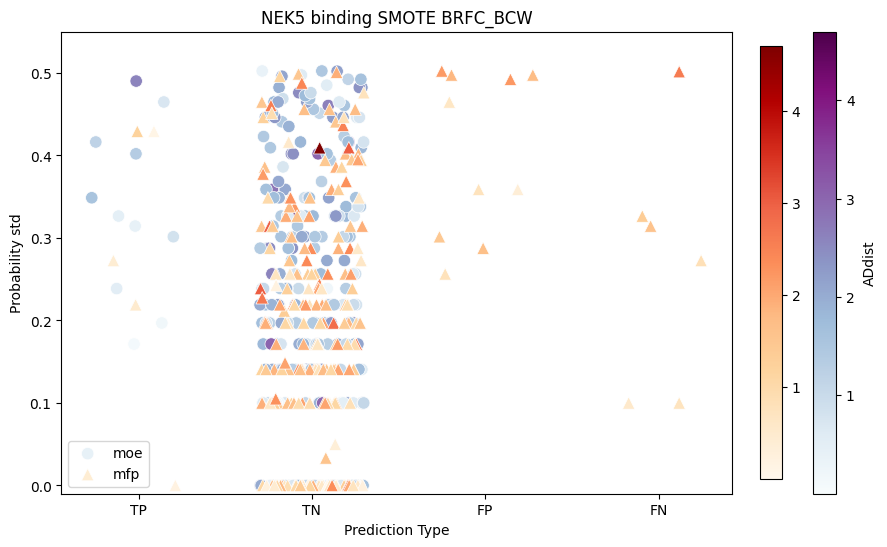

NEK5 ADASYN RF


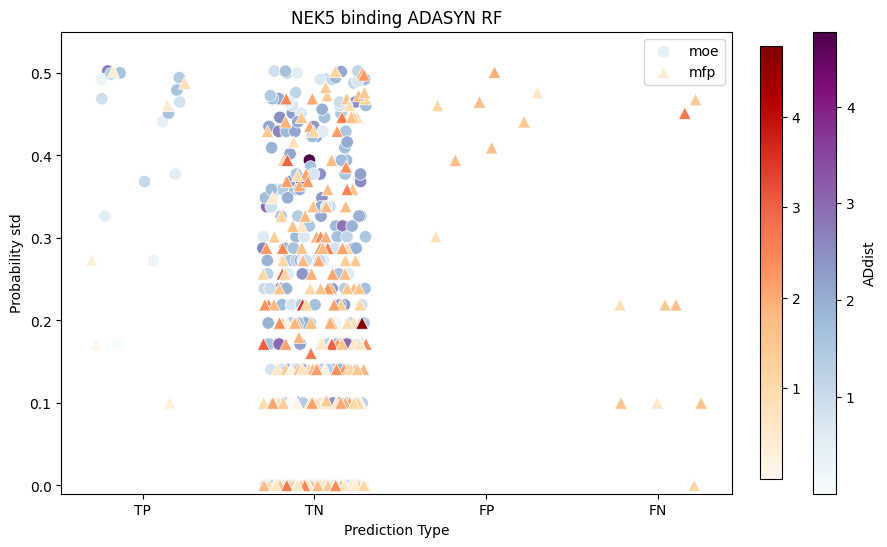

NEK5 ADASYN RF_BCW


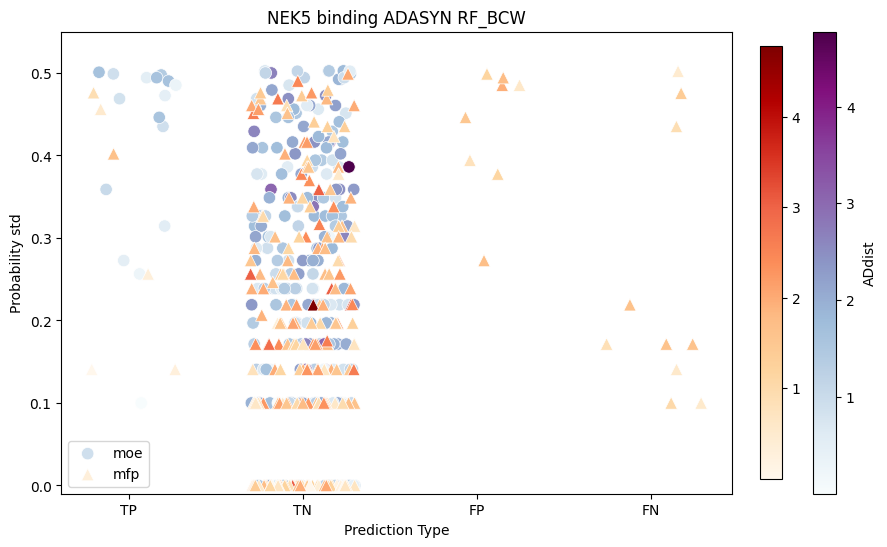

NEK5 ADASYN BRFC


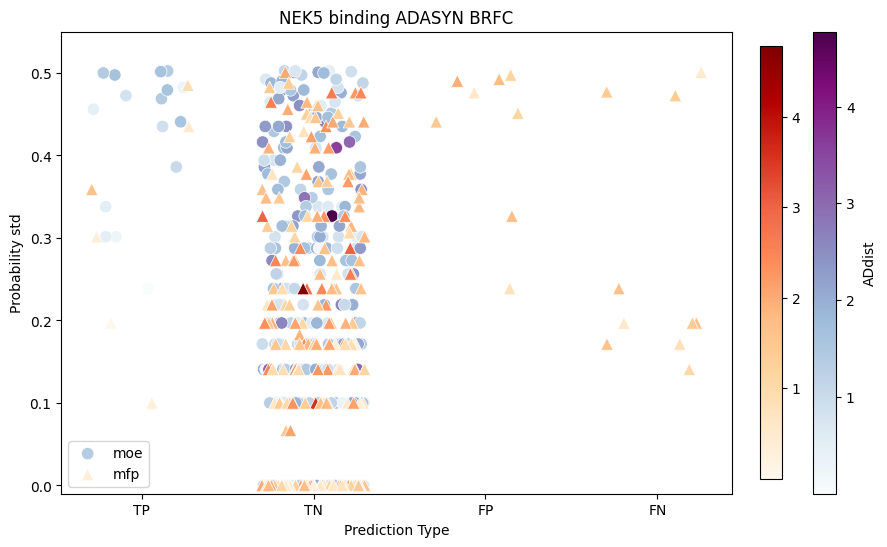

NEK5 ADASYN BRFC_BCW


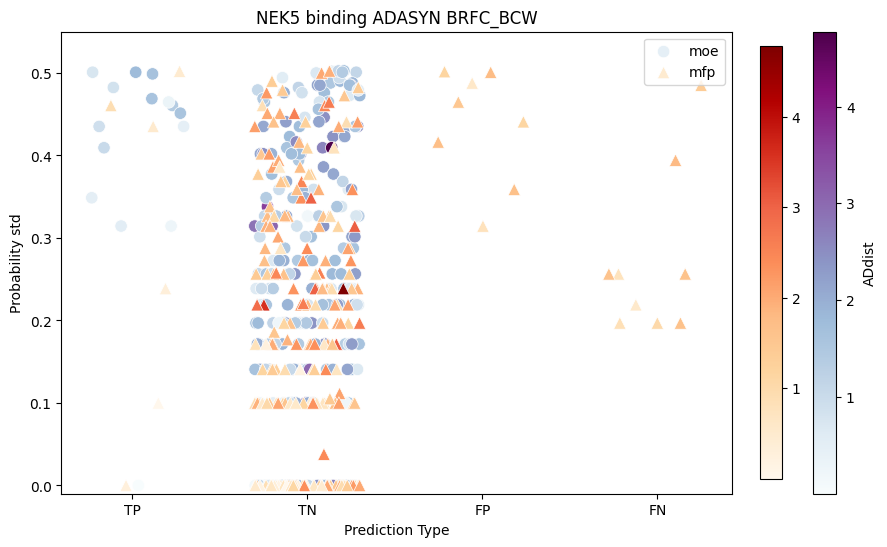

NEK5 scaled RF


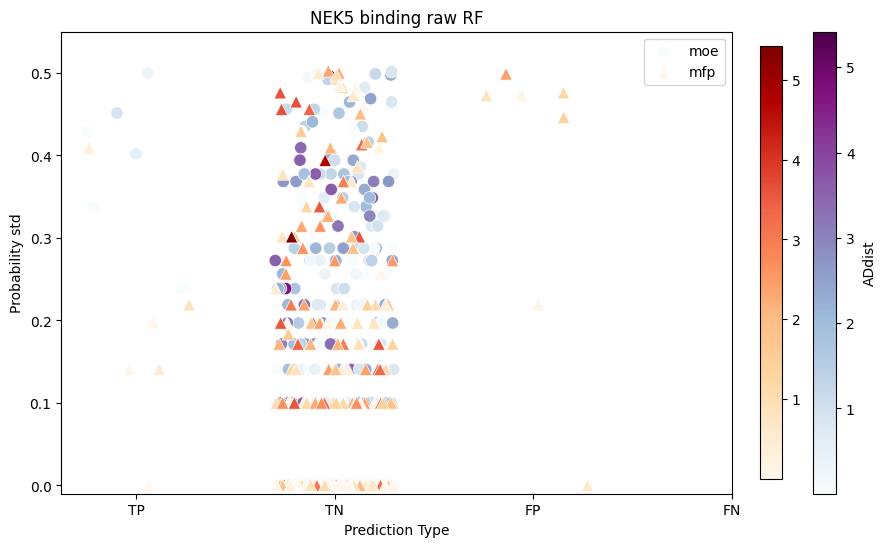

NEK5 scaled RF_BCW


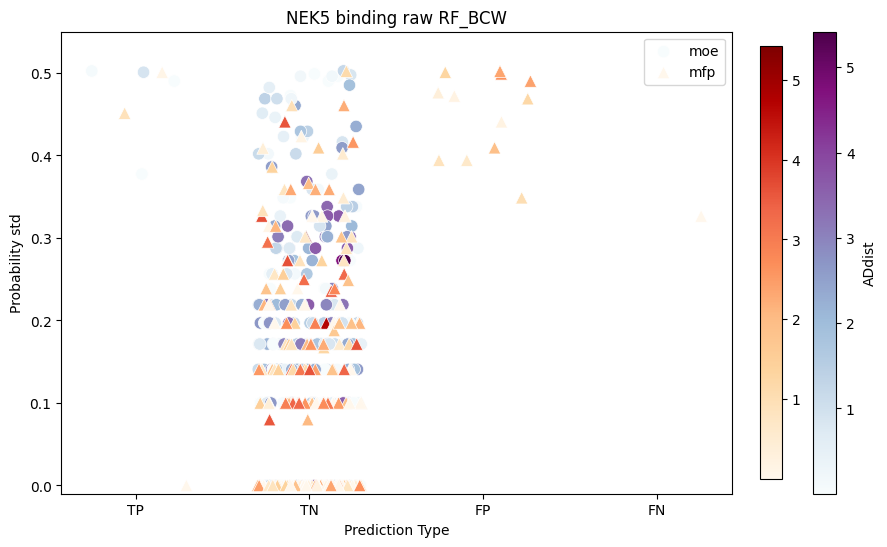

NEK5 scaled BRFC


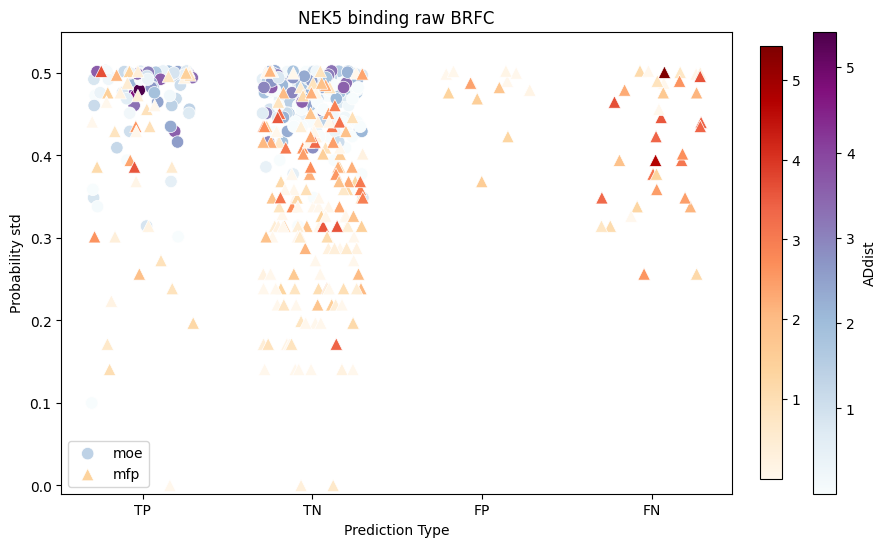

NEK5 scaled BRFC_BCW


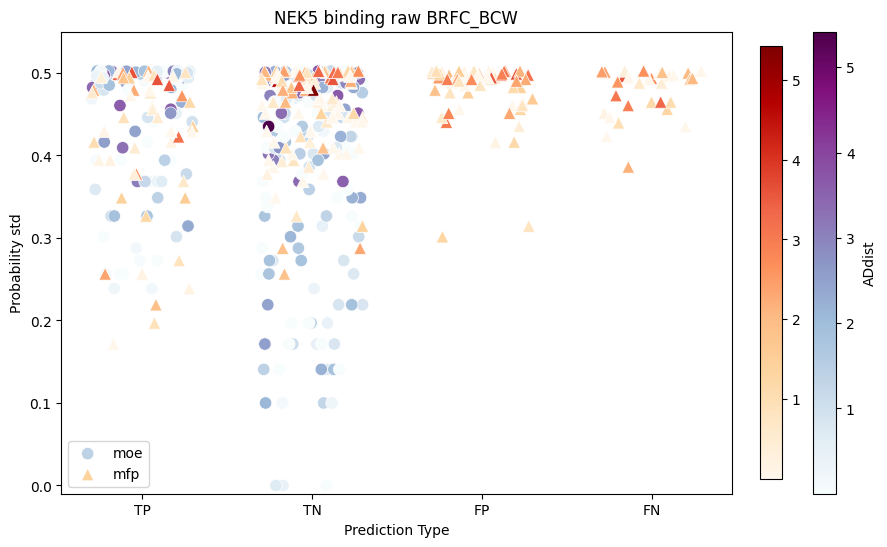

NEK5 UNDER RF


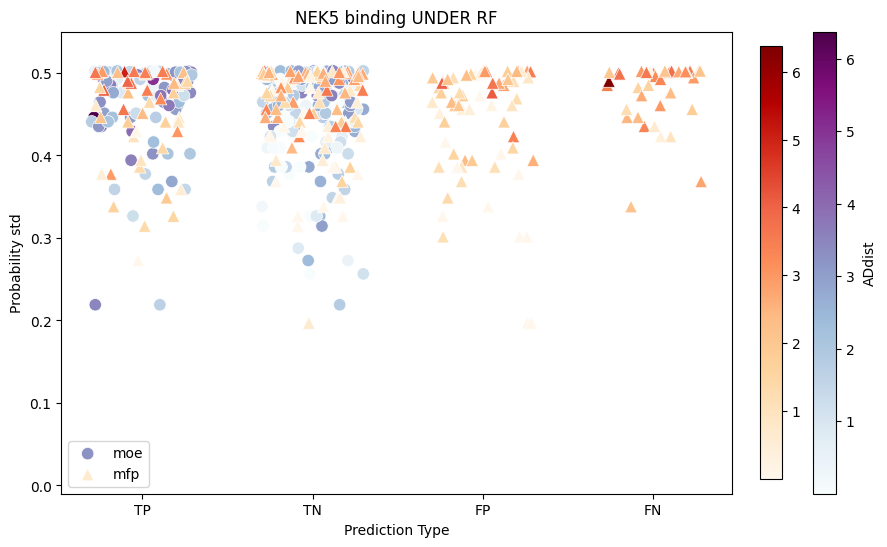

NEK5 UNDER RF_BCW


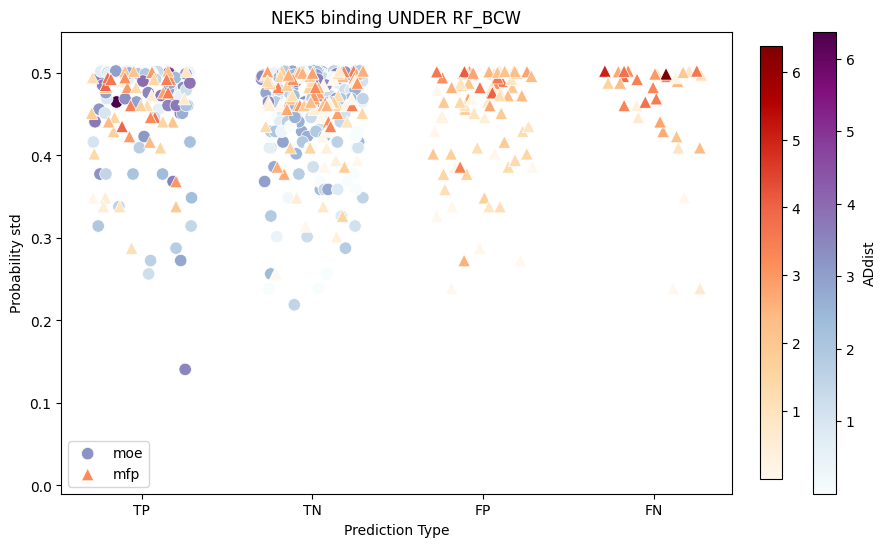

NEK5 UNDER BRFC


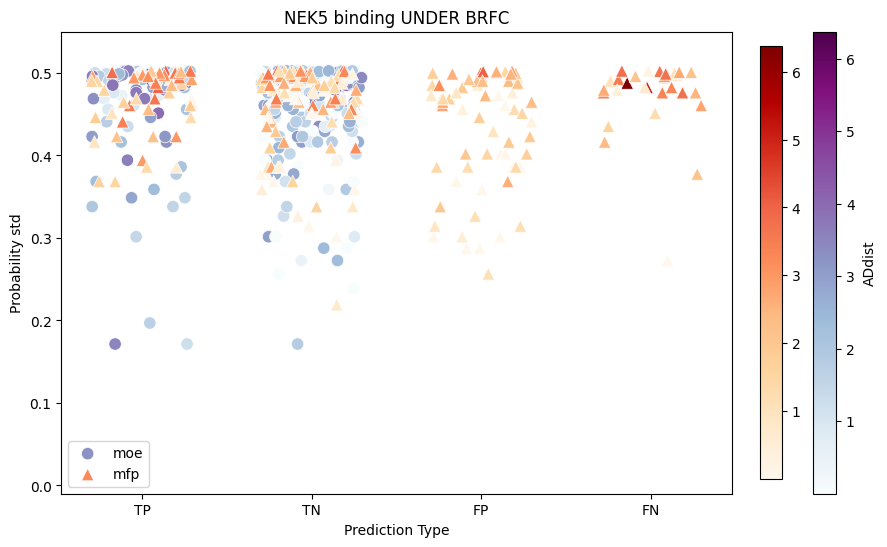

NEK5 UNDER BRFC_BCW


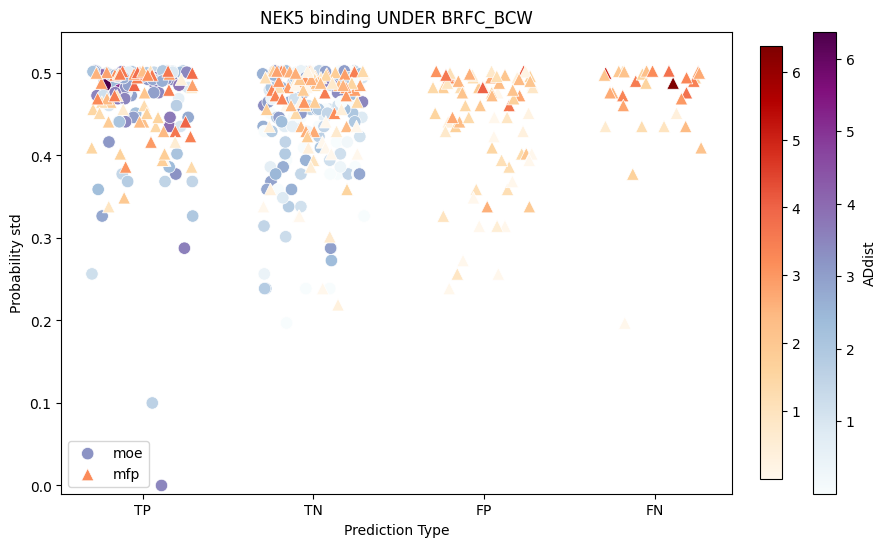

NEK5 SMOTE RF


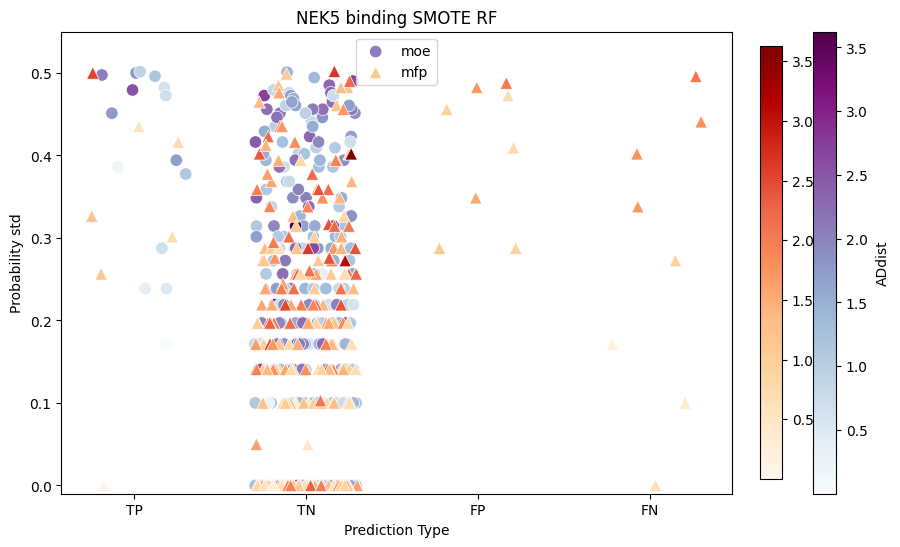

NEK5 SMOTE RF_BCW


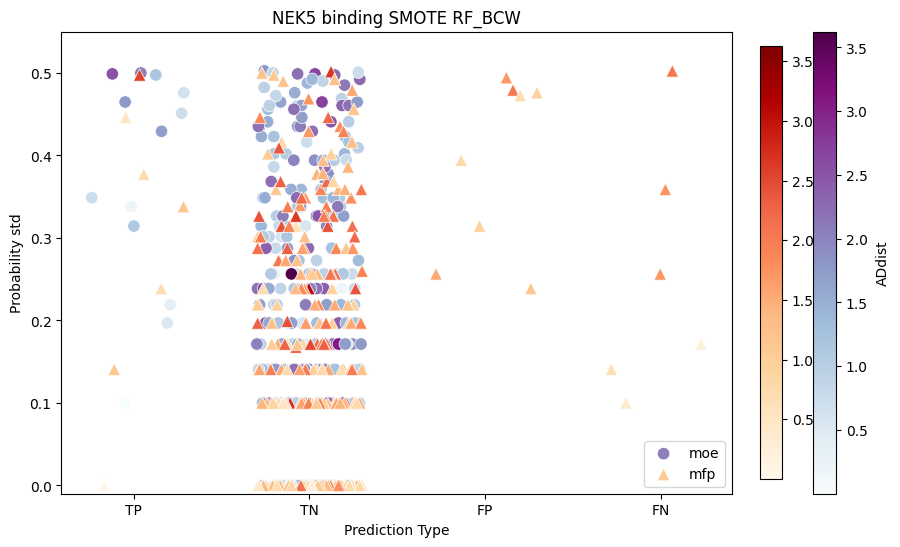

NEK5 SMOTE BRFC


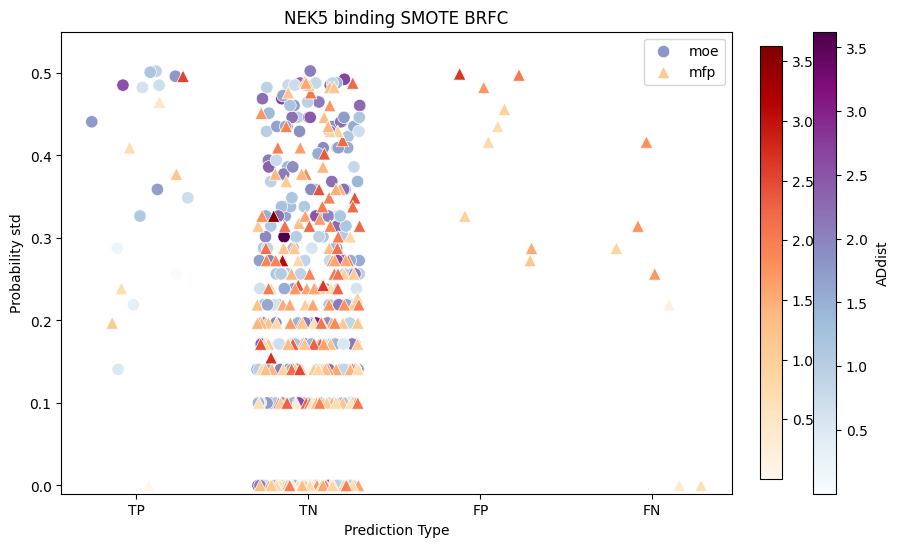

NEK5 SMOTE BRFC_BCW


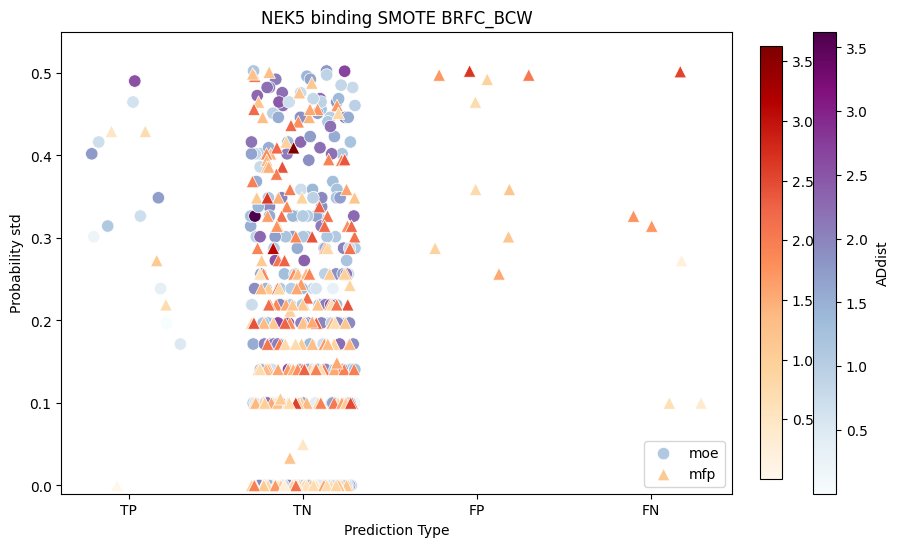

NEK5 ADASYN RF


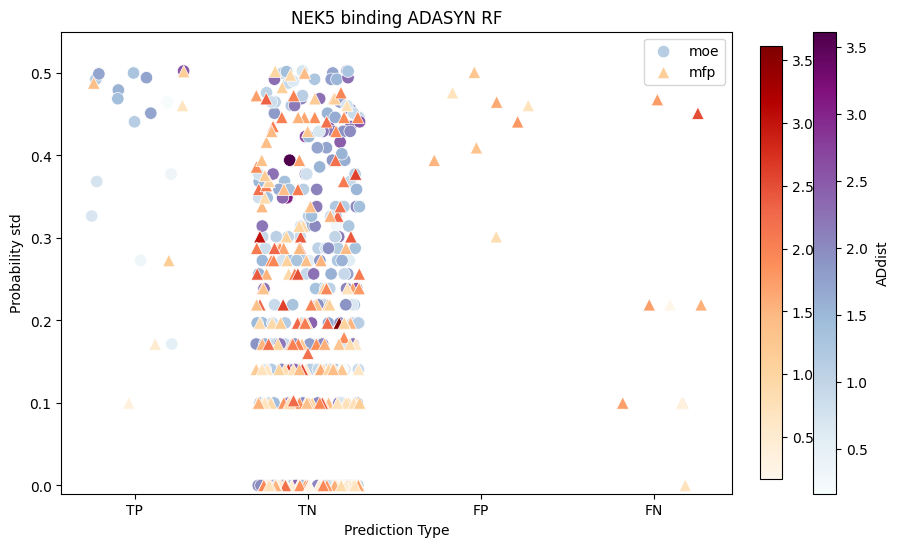

NEK5 ADASYN RF_BCW


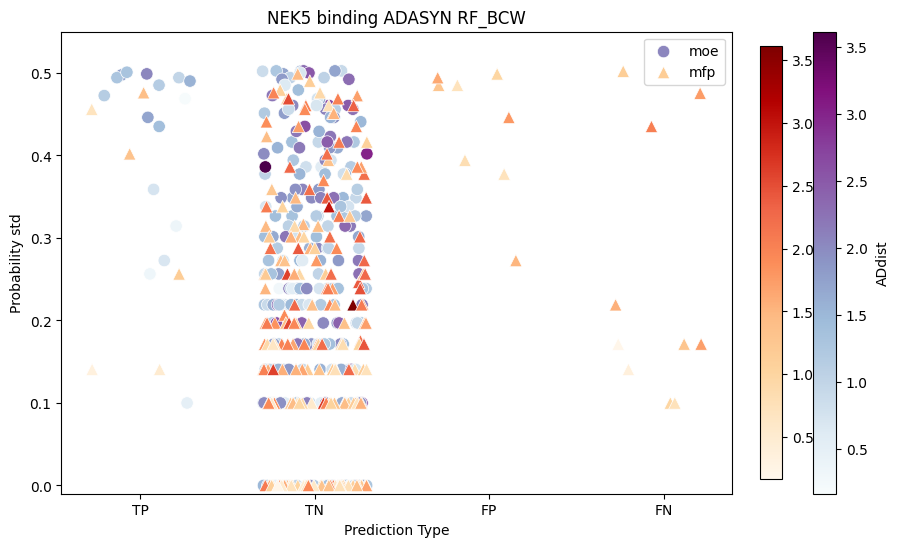

NEK5 ADASYN BRFC


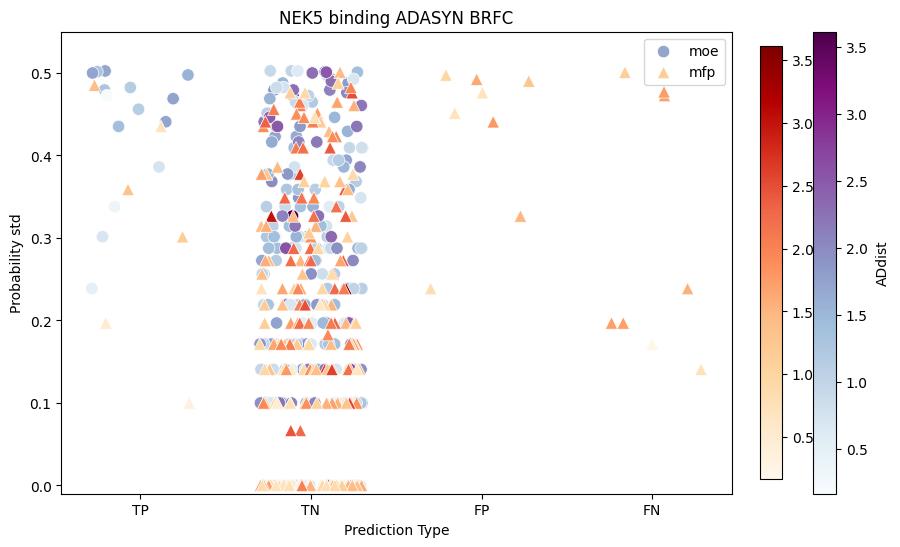

NEK5 ADASYN BRFC_BCW


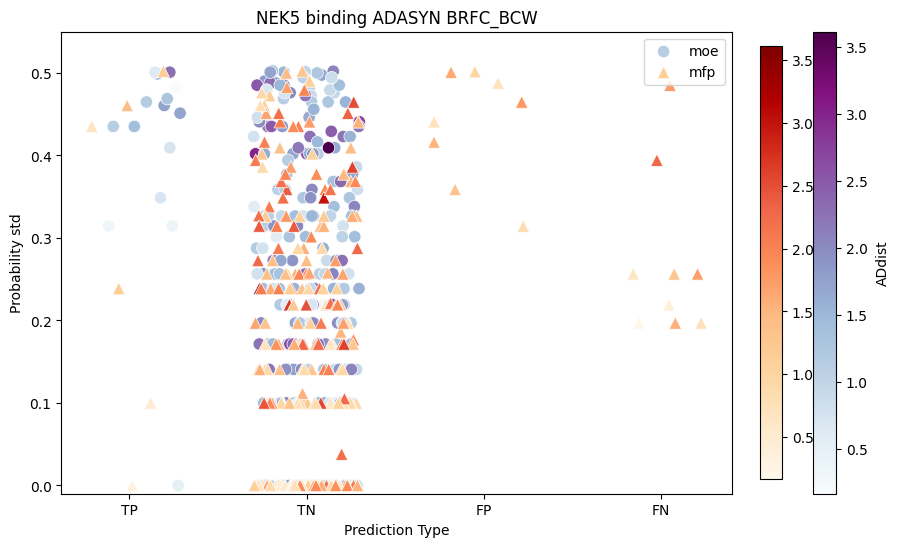

NEK9 scaled RF


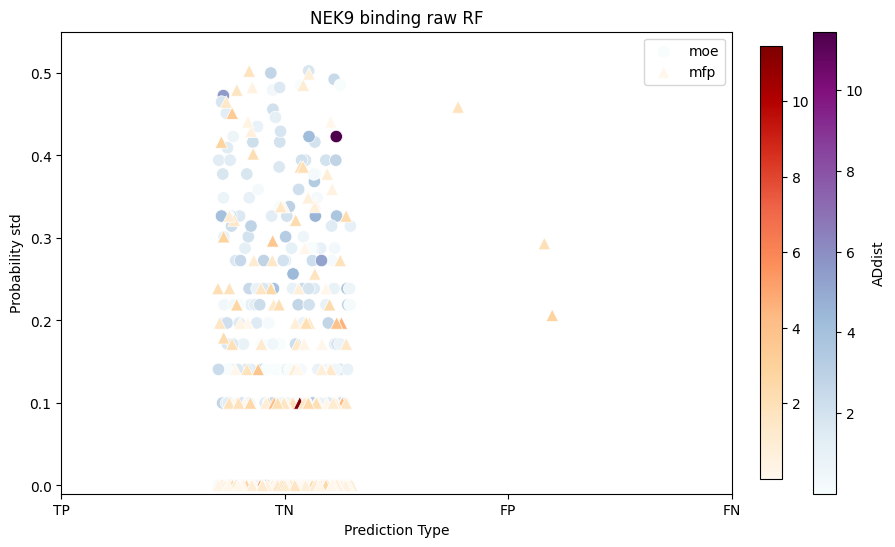

NEK9 scaled RF_BCW


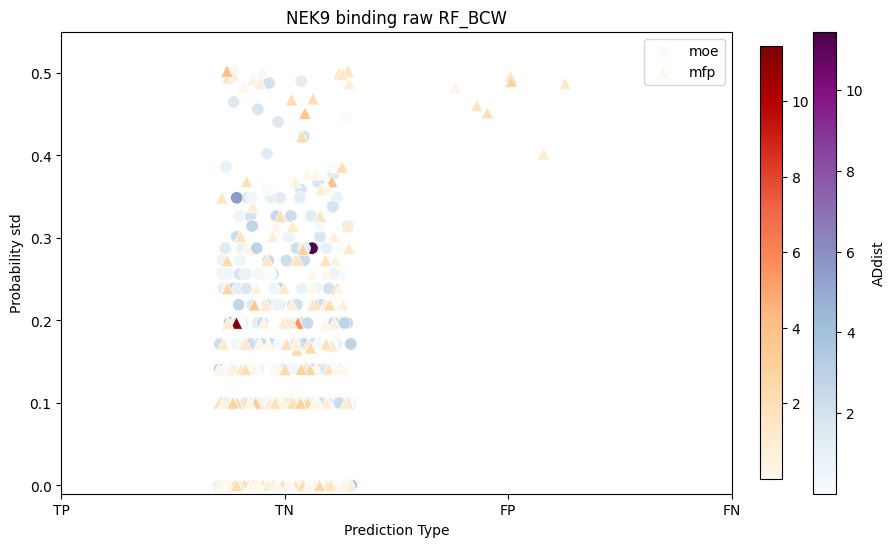

NEK9 scaled BRFC


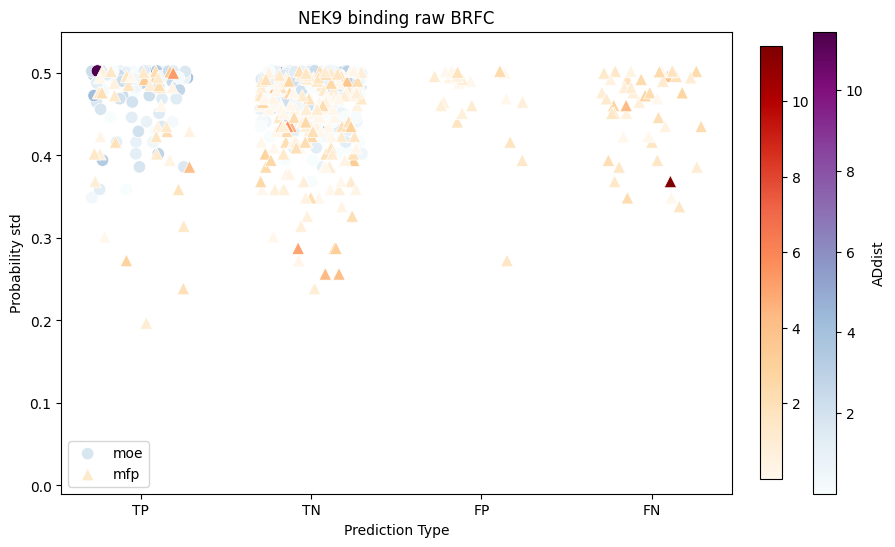

NEK9 scaled BRFC_BCW


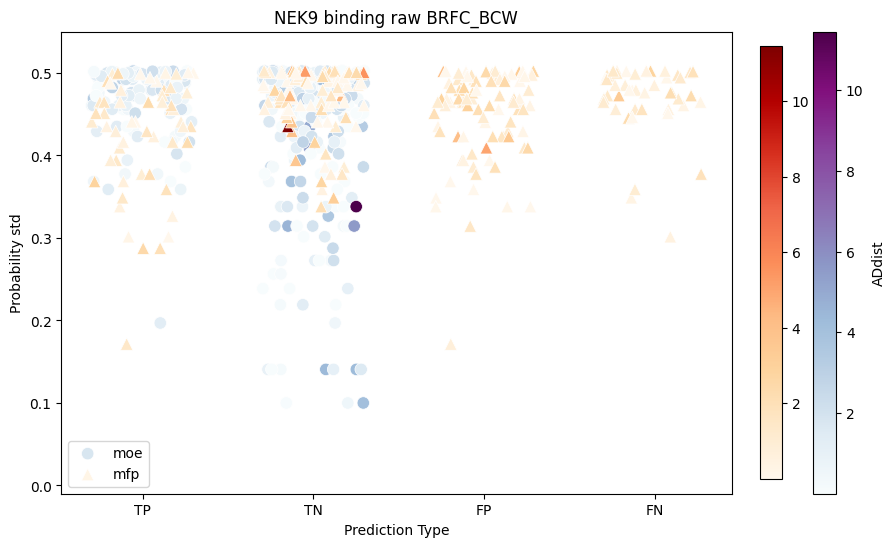

NEK9 UNDER RF


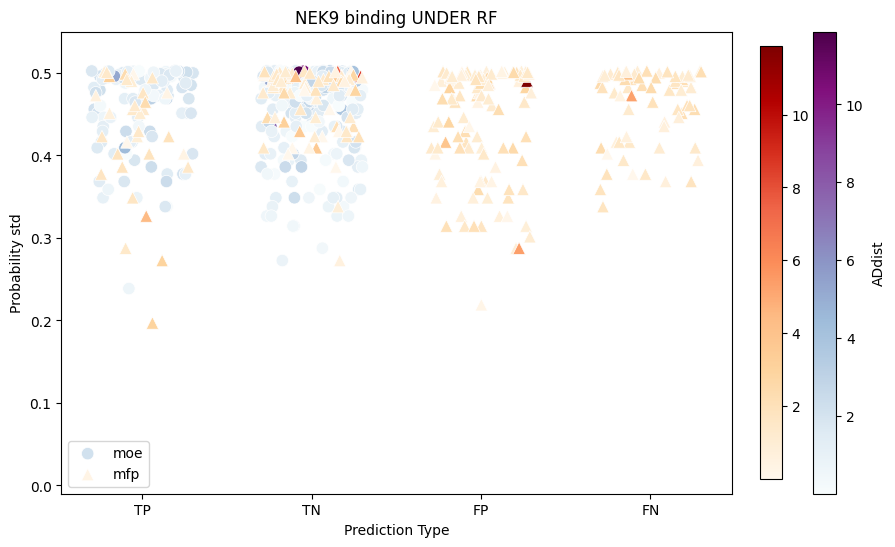

NEK9 UNDER RF_BCW


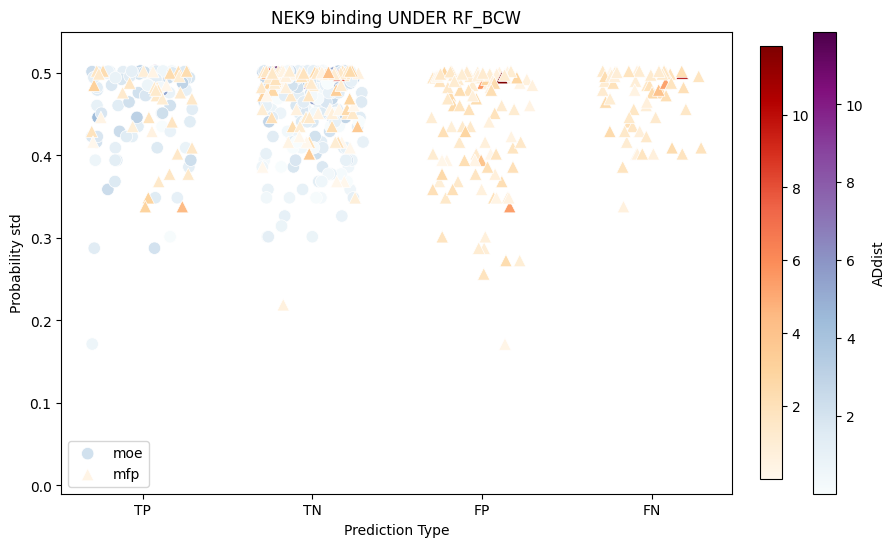

NEK9 UNDER BRFC


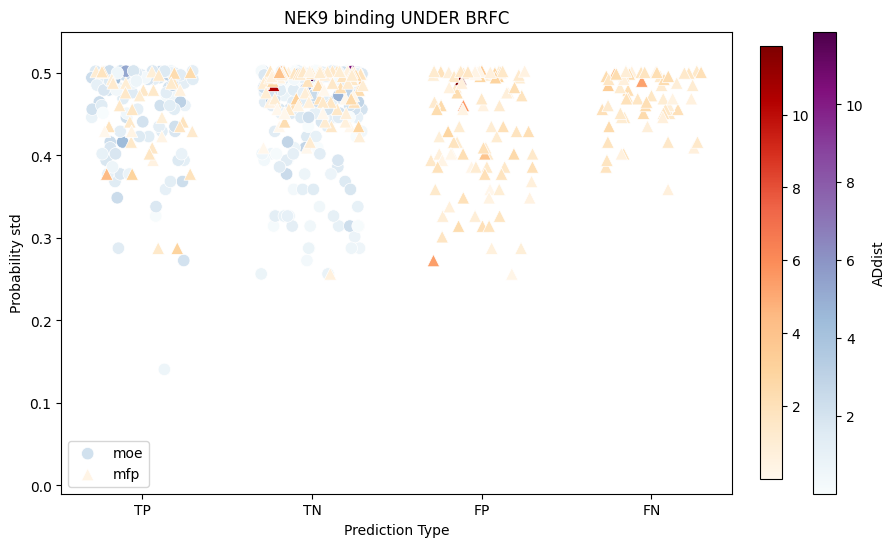

NEK9 UNDER BRFC_BCW


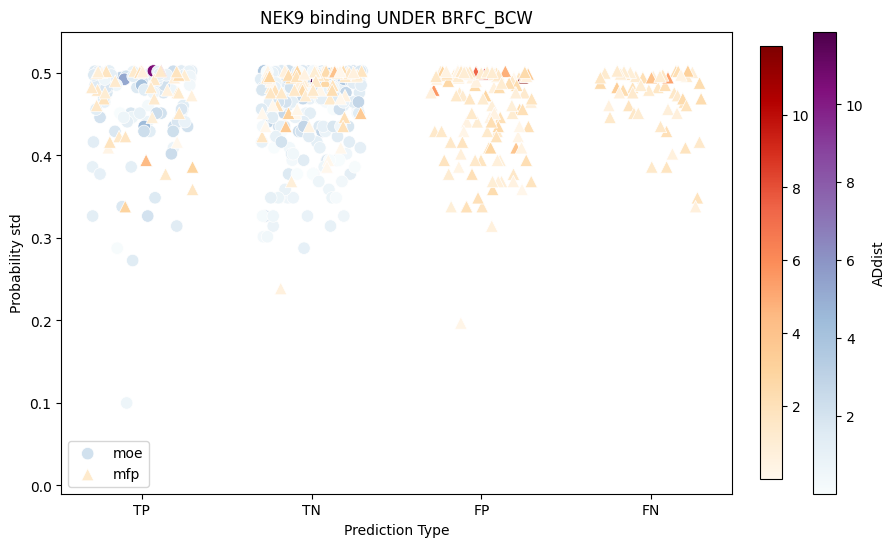

NEK9 SMOTE RF


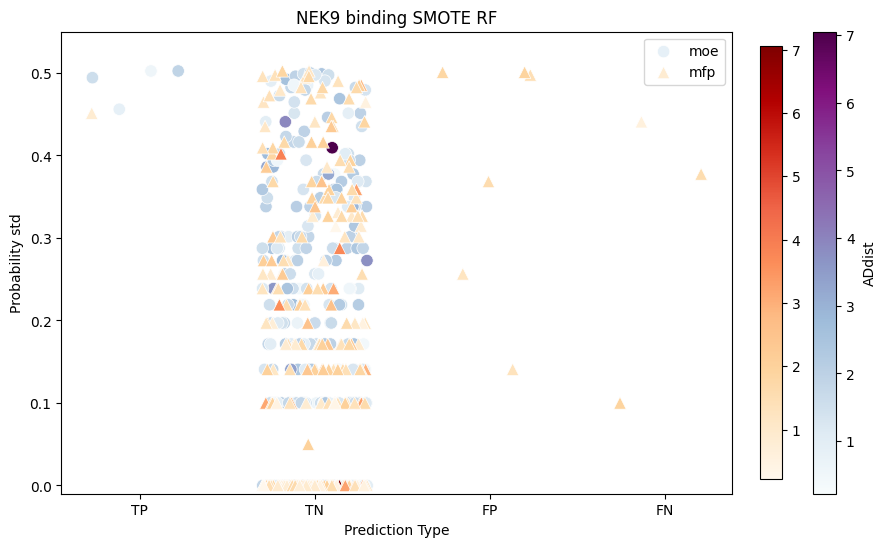

NEK9 SMOTE RF_BCW


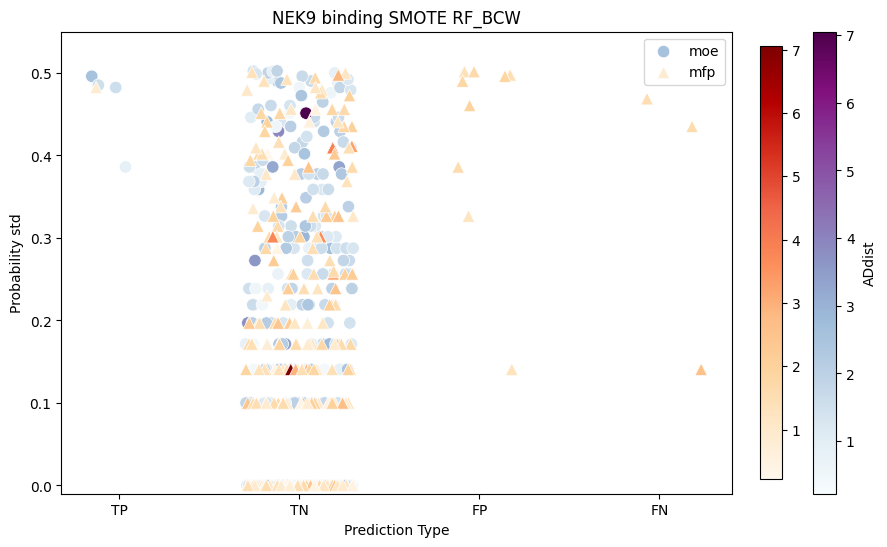

NEK9 SMOTE BRFC


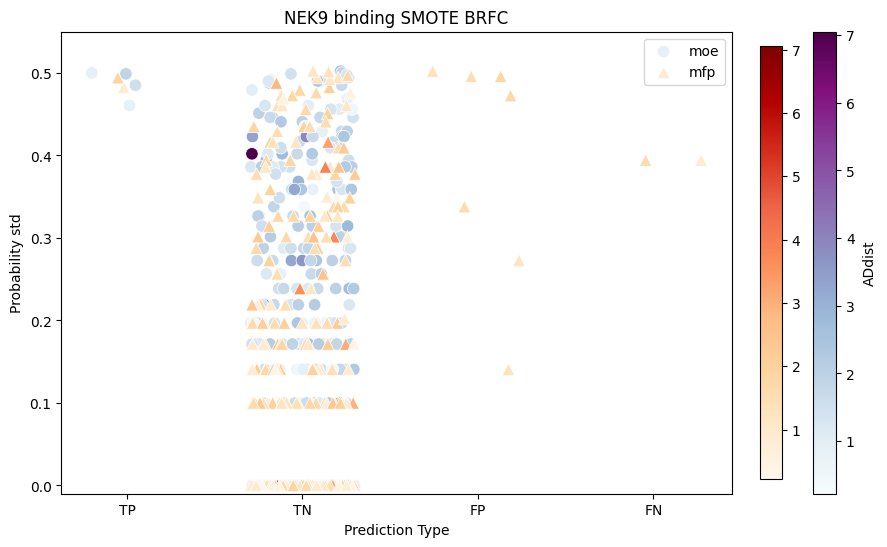

NEK9 SMOTE BRFC_BCW


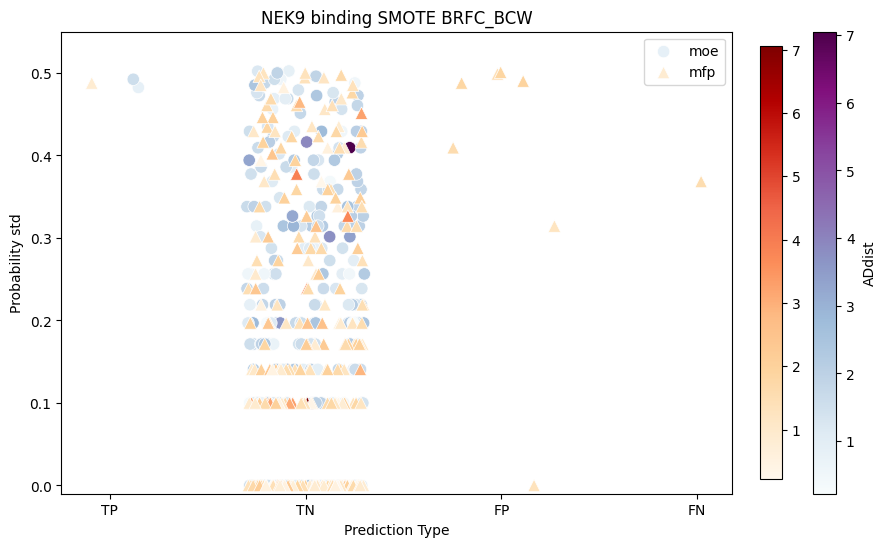

NEK9 ADASYN RF


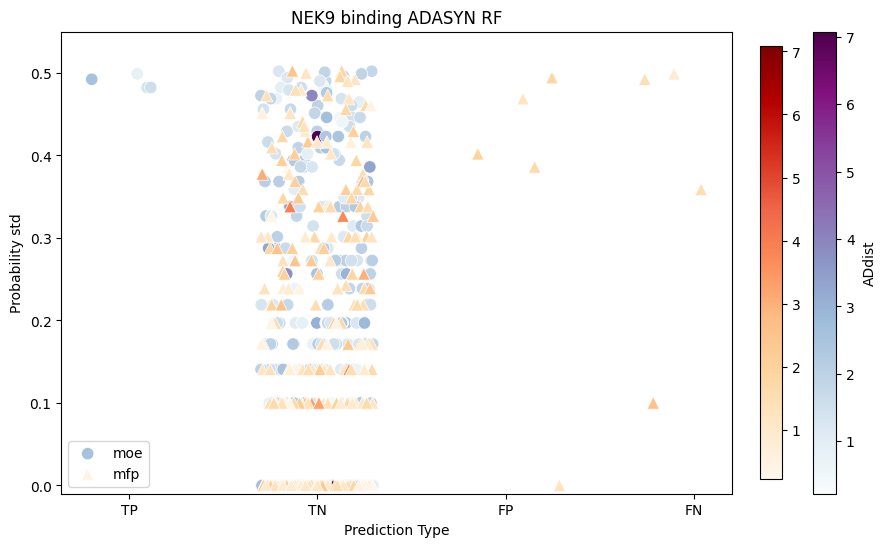

NEK9 ADASYN RF_BCW


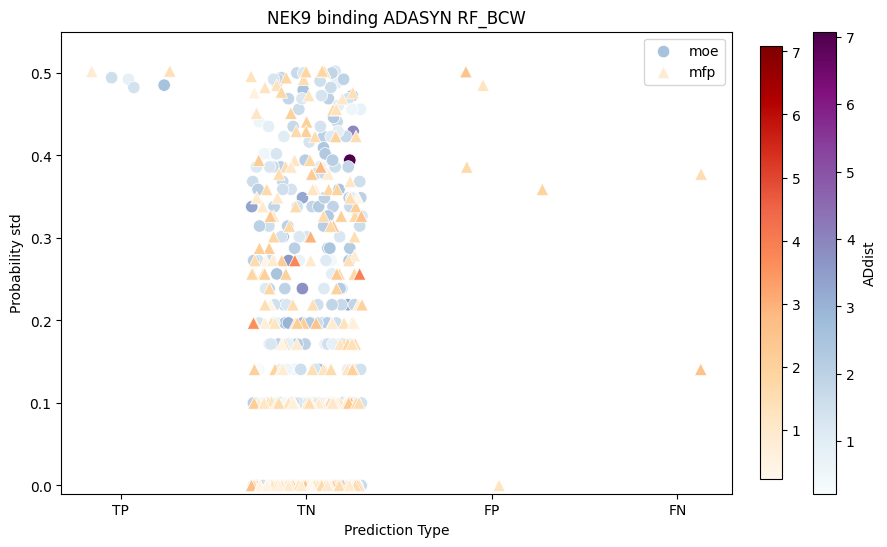

NEK9 ADASYN BRFC


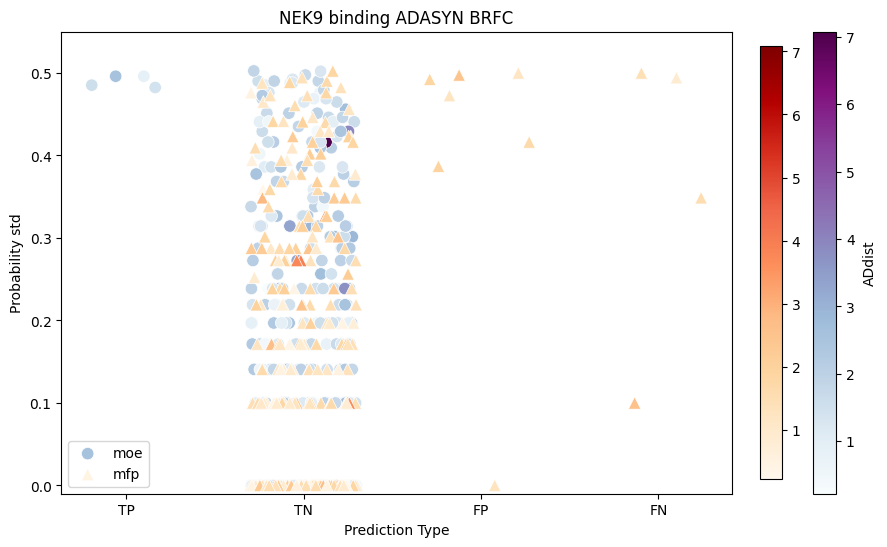

NEK9 ADASYN BRFC_BCW


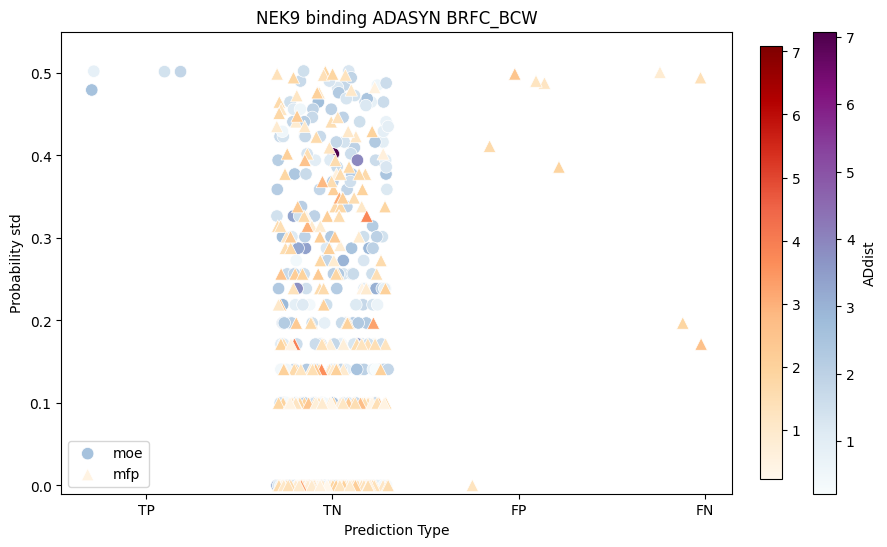

NEK9 scaled RF


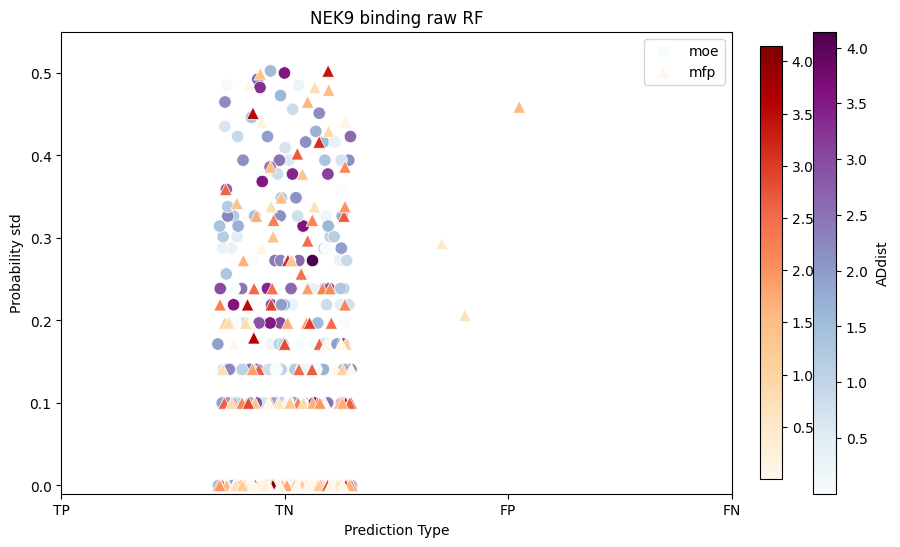

NEK9 scaled RF_BCW


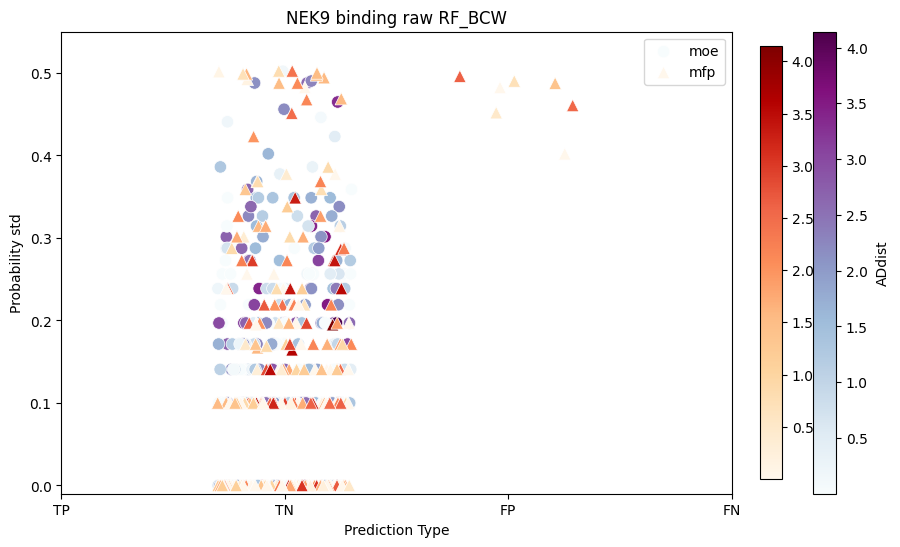

NEK9 scaled BRFC


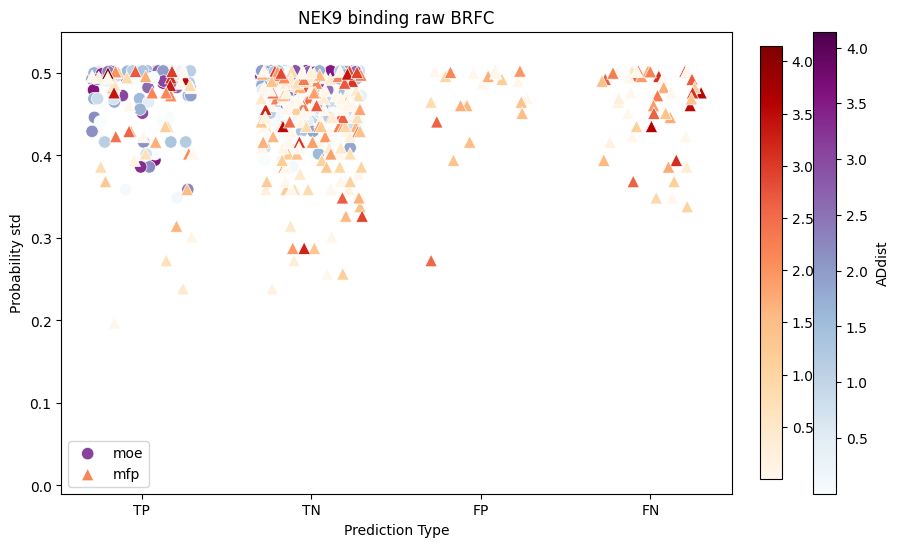

NEK9 scaled BRFC_BCW


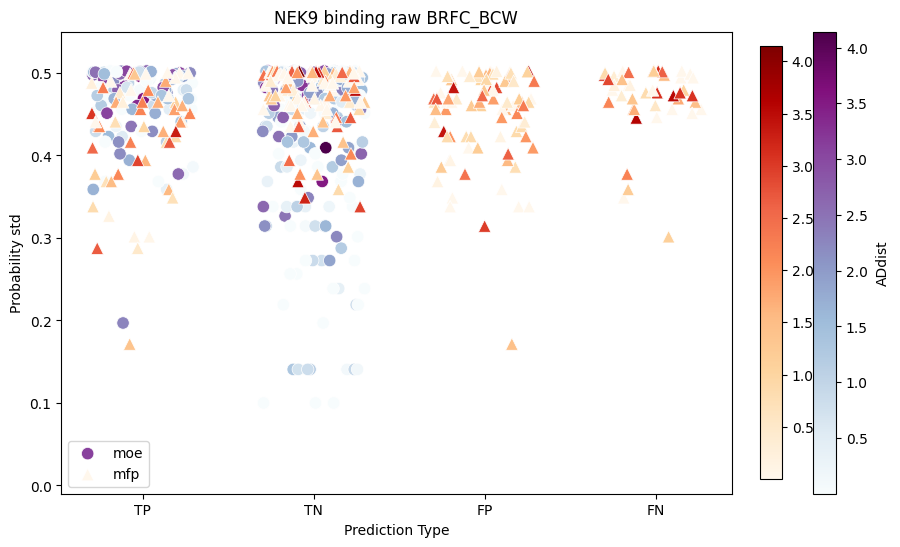

NEK9 UNDER RF


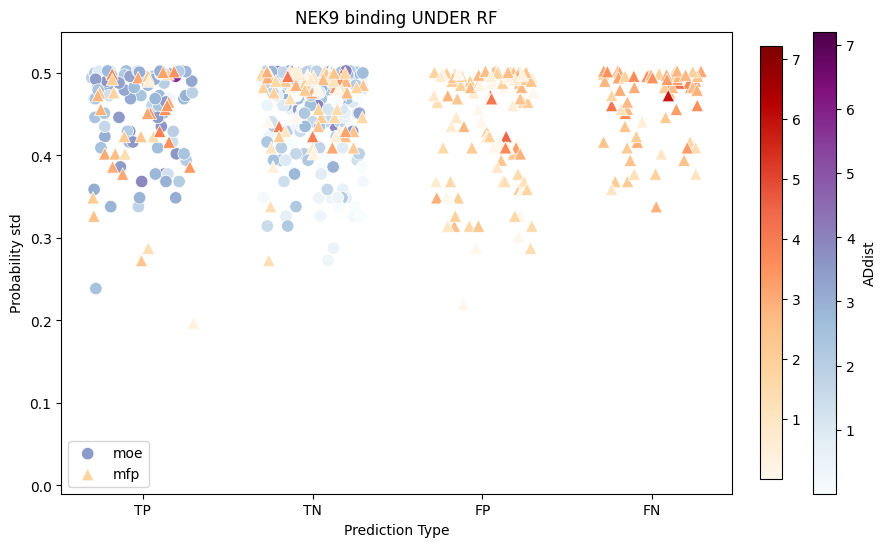

NEK9 UNDER RF_BCW


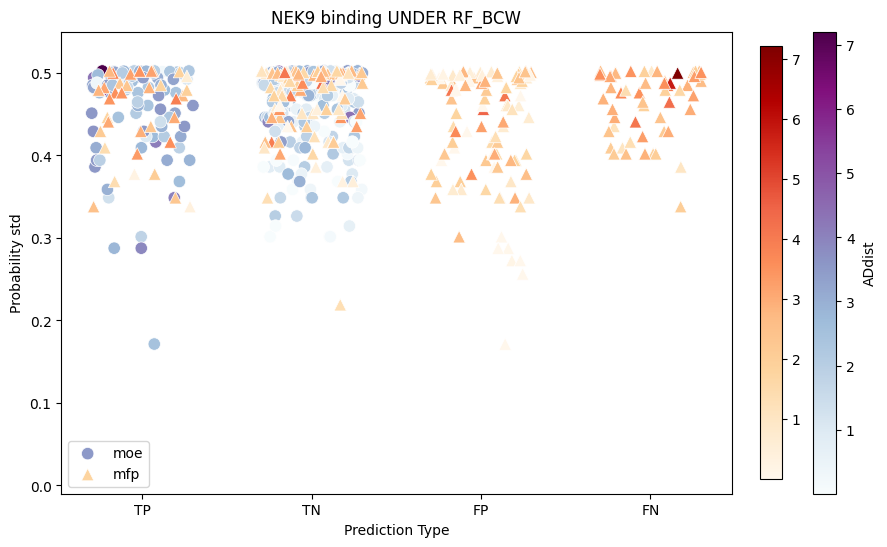

NEK9 UNDER BRFC


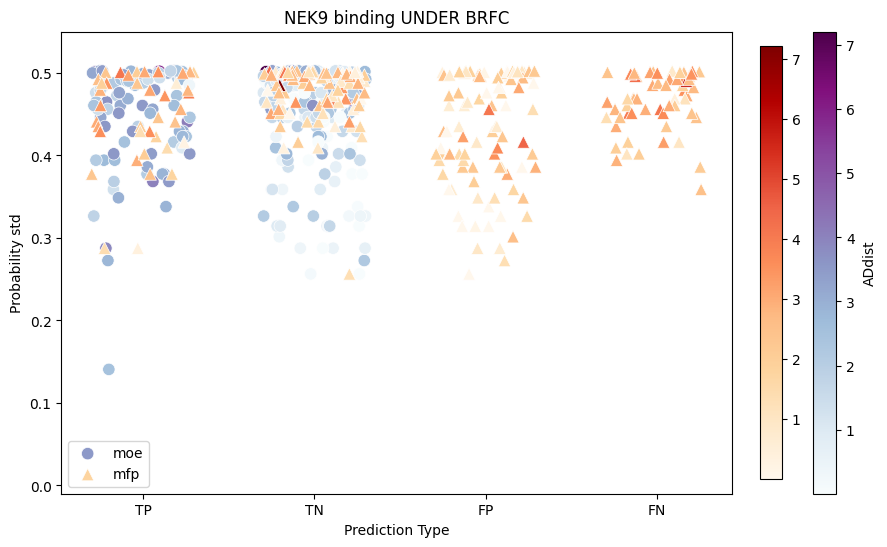

NEK9 UNDER BRFC_BCW


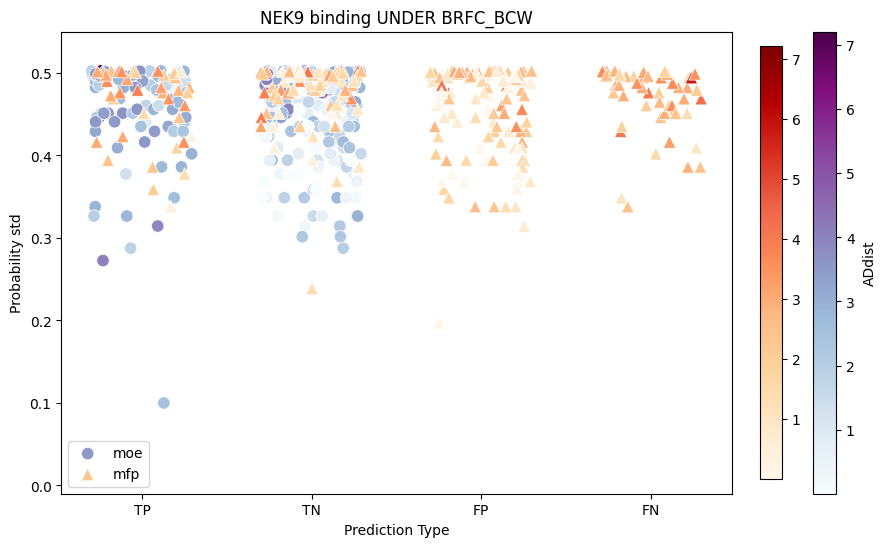

NEK9 SMOTE RF


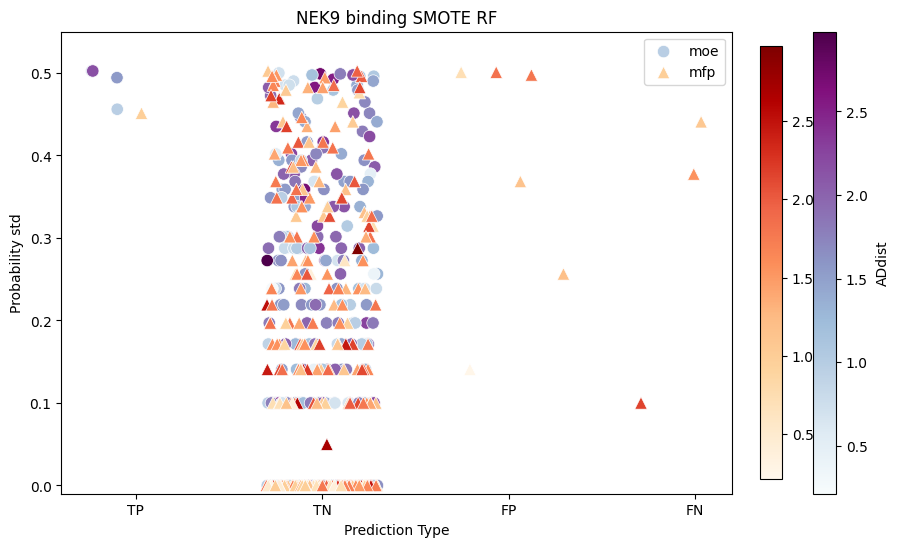

NEK9 SMOTE RF_BCW


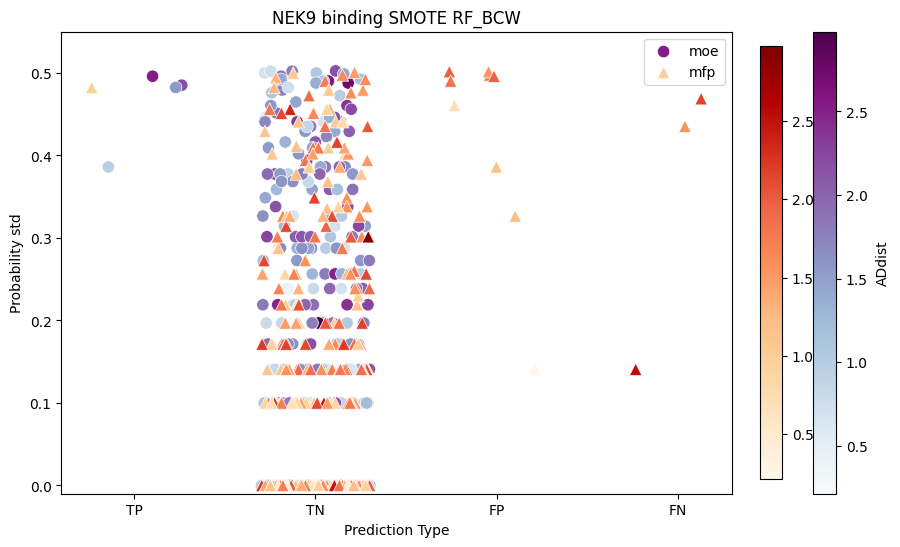

NEK9 SMOTE BRFC


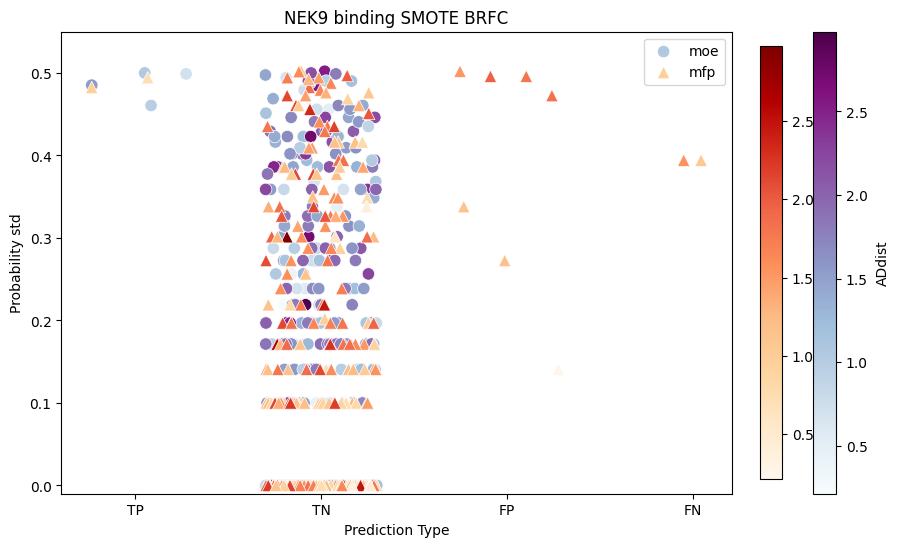

NEK9 SMOTE BRFC_BCW


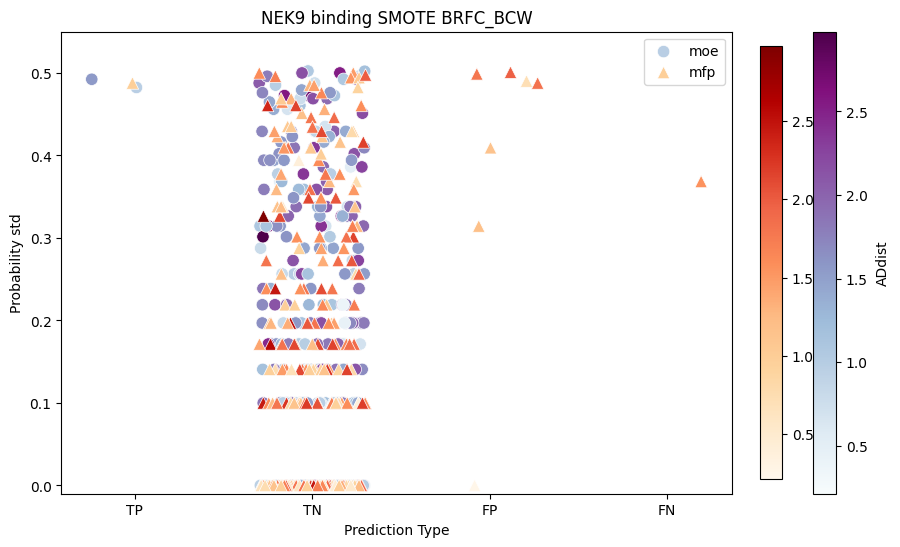

NEK9 ADASYN RF


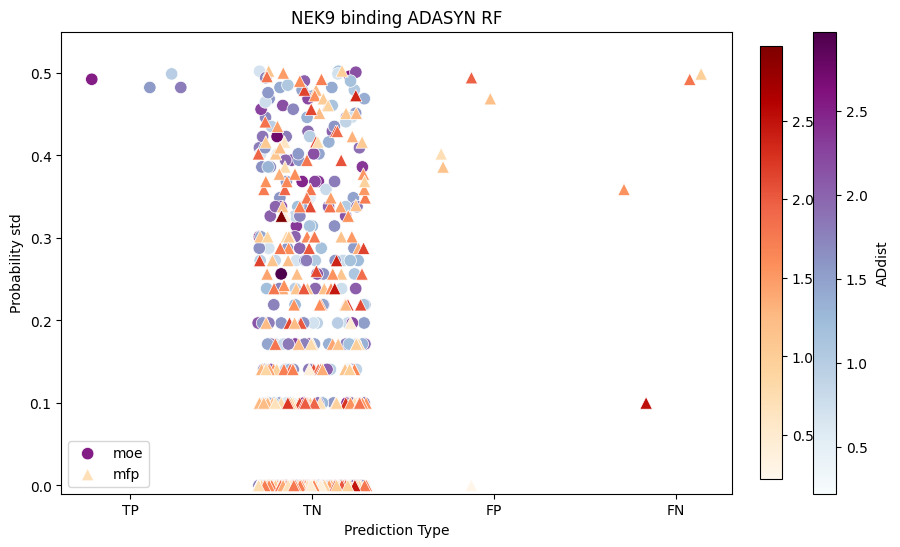

NEK9 ADASYN RF_BCW


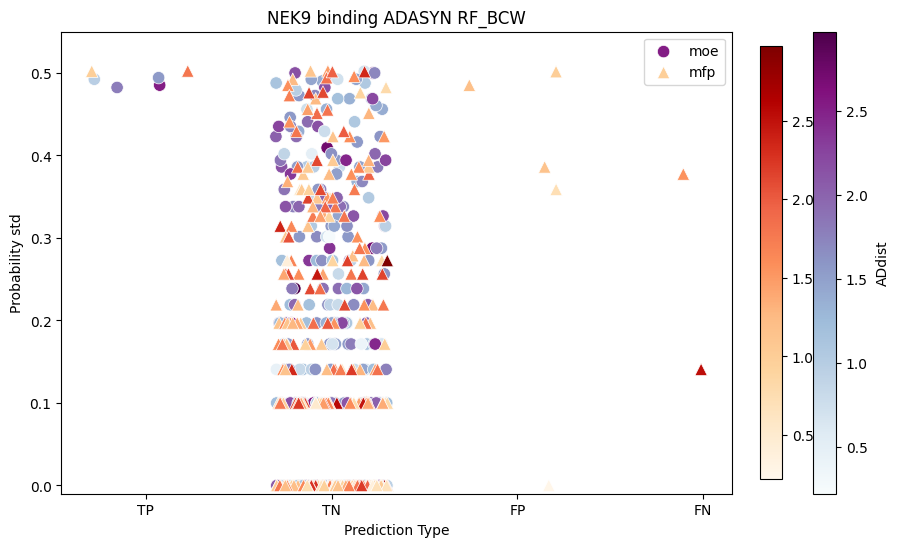

NEK9 ADASYN BRFC


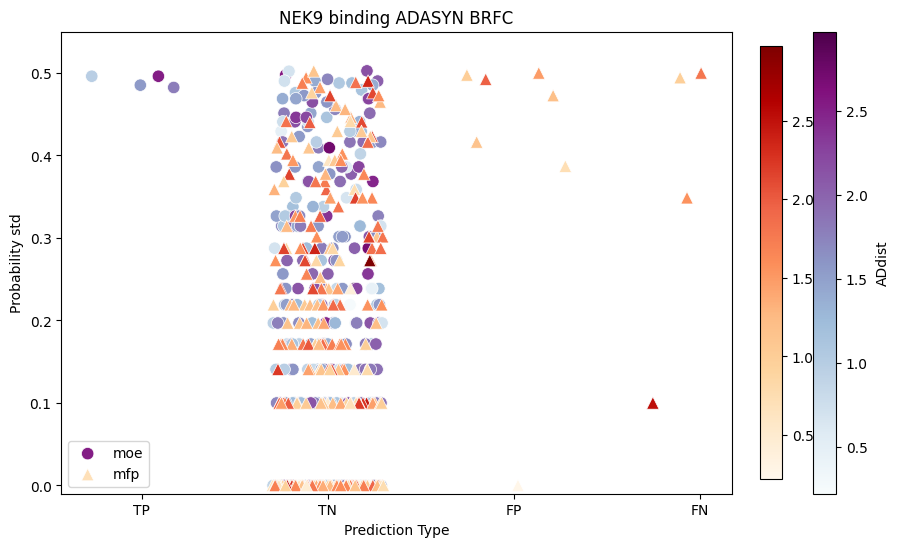

NEK9 ADASYN BRFC_BCW


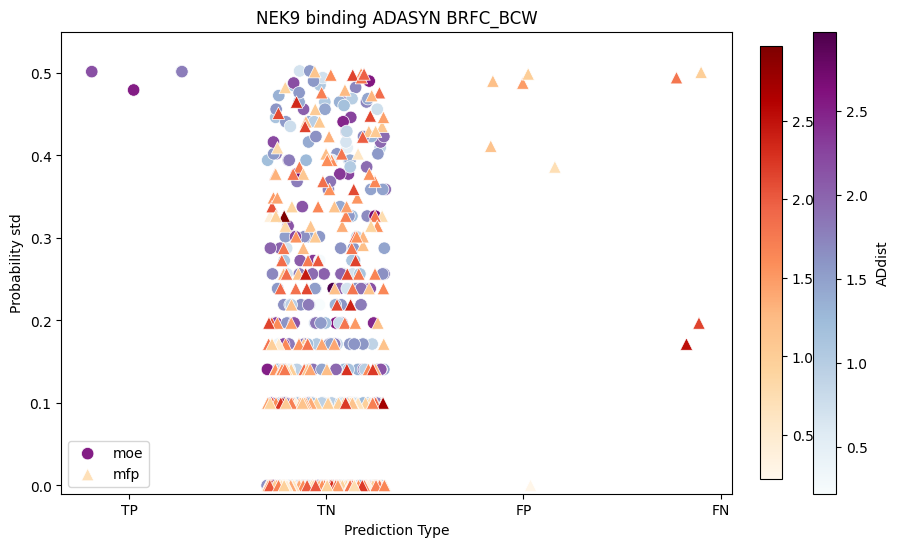

NEK2 scaled RF


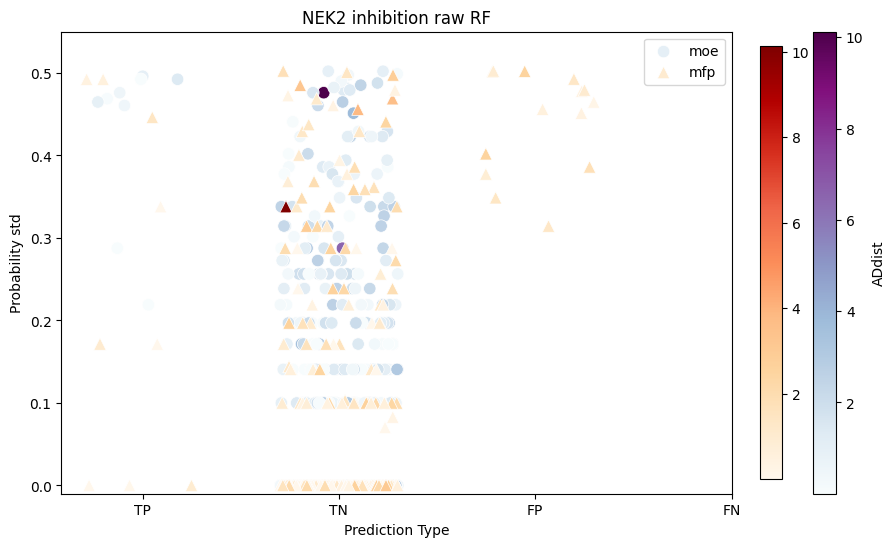

NEK2 scaled RF_BCW


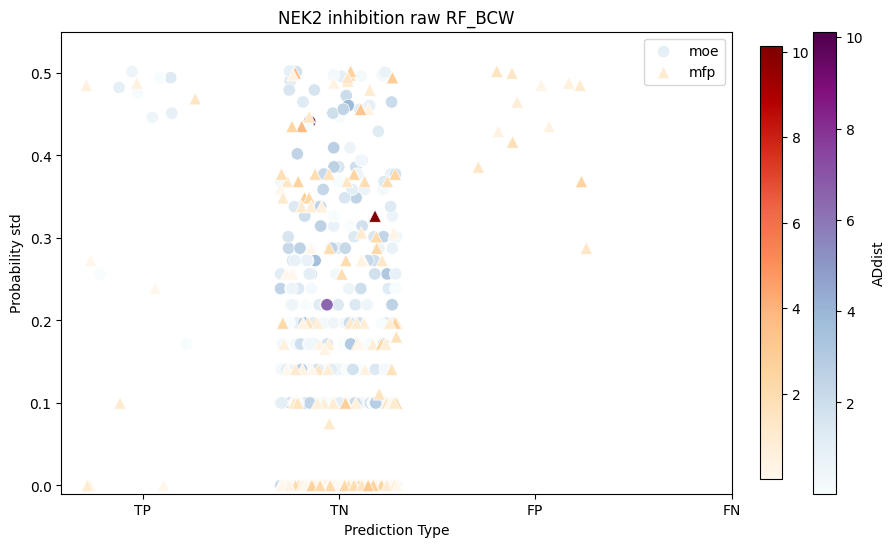

NEK2 scaled BRFC


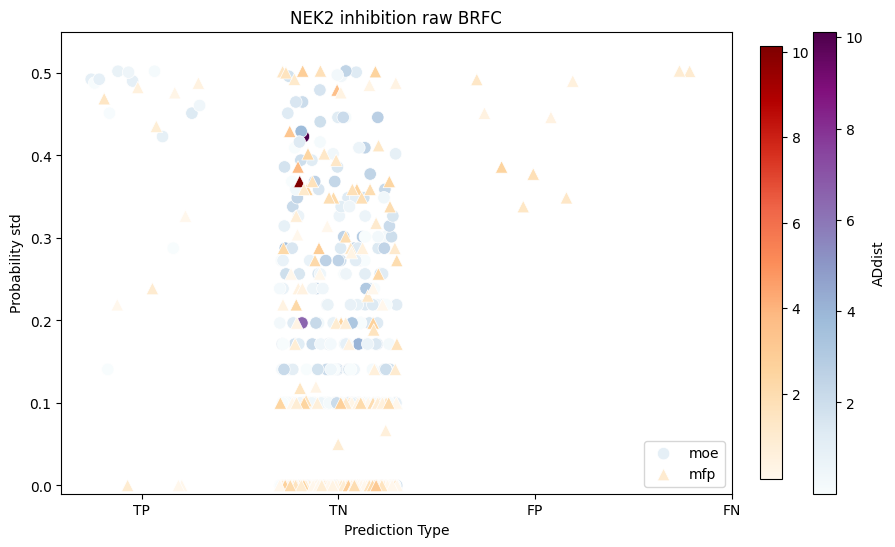

NEK2 scaled BRFC_BCW


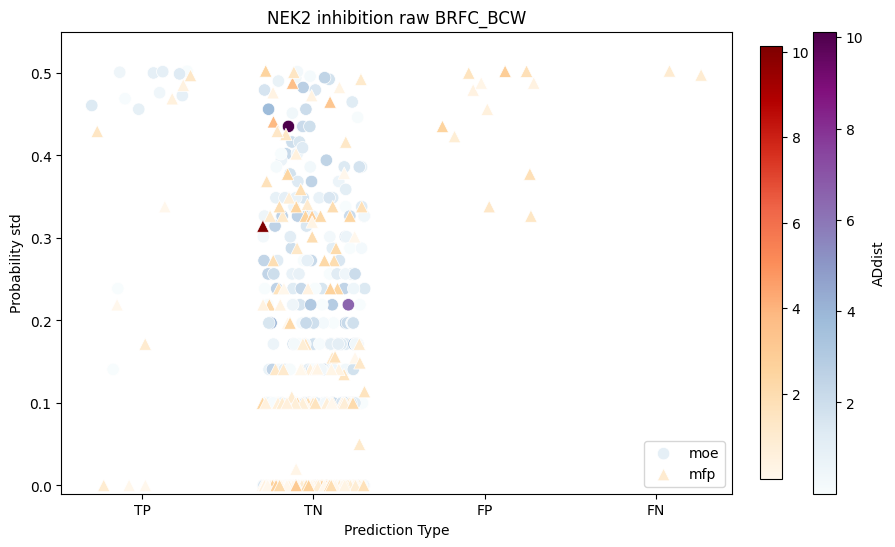

NEK2 UNDER RF


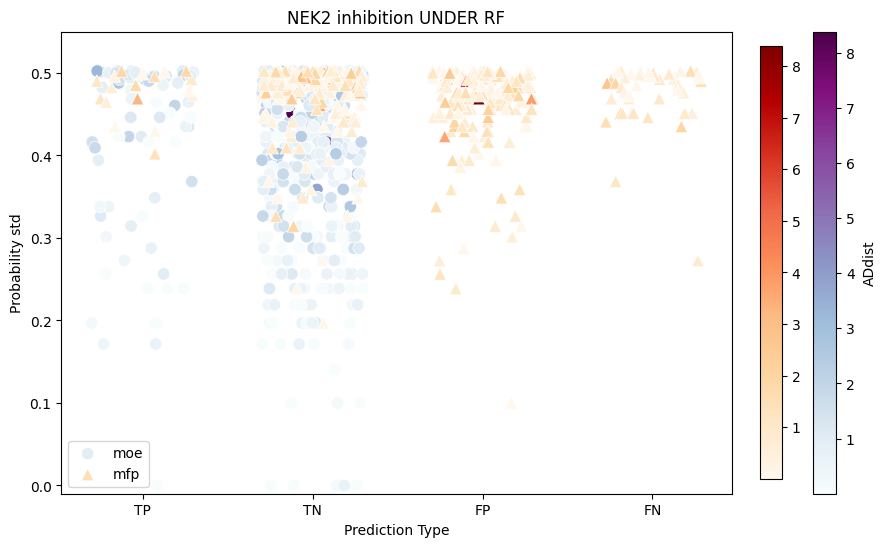

NEK2 UNDER RF_BCW


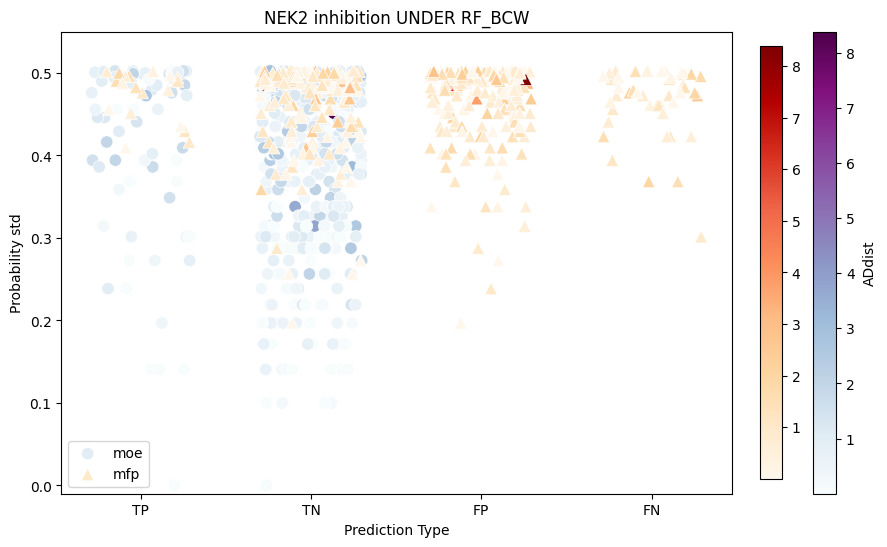

NEK2 UNDER BRFC


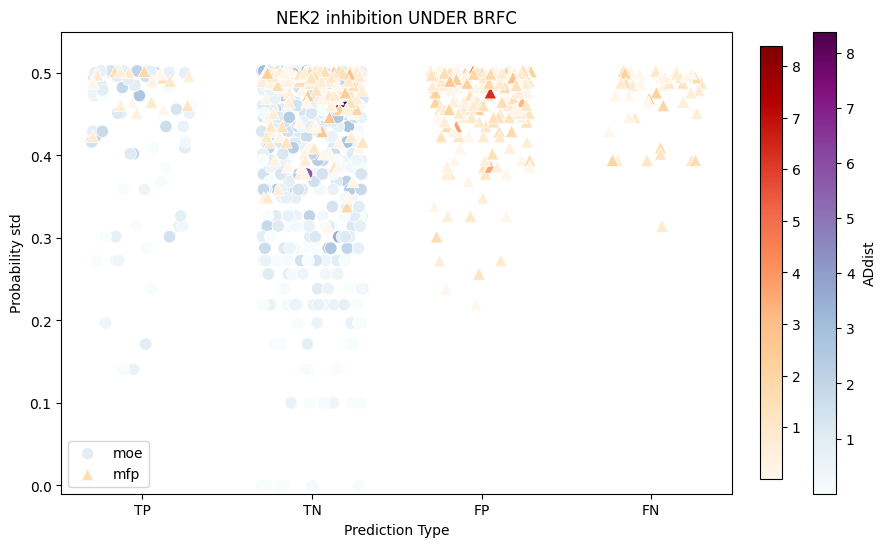

NEK2 UNDER BRFC_BCW


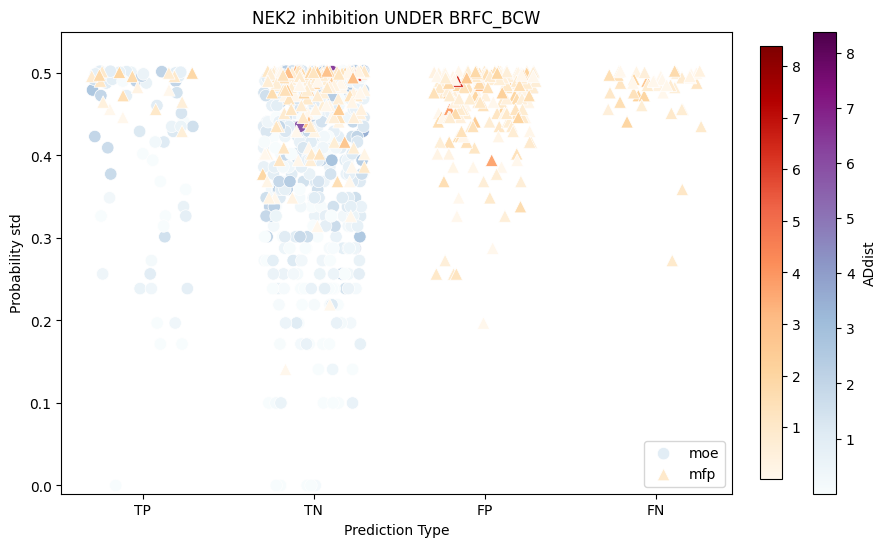

NEK2 SMOTE RF


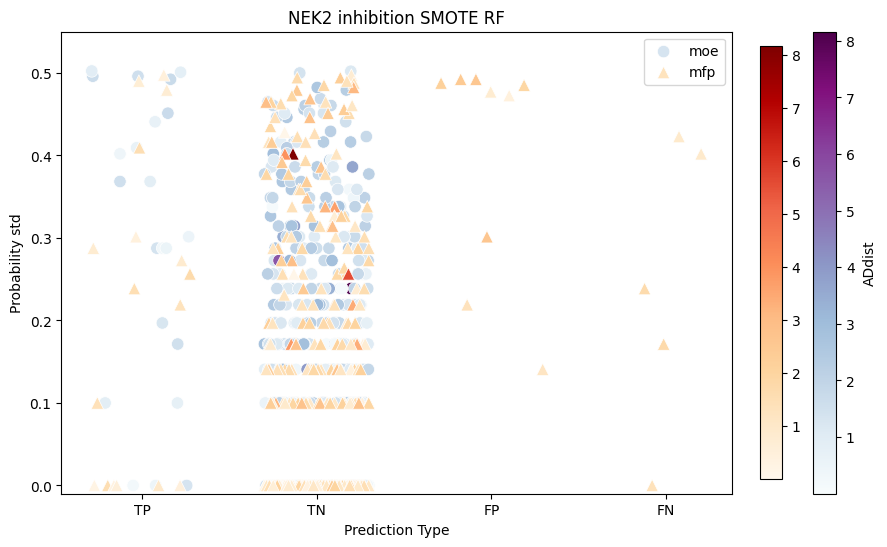

NEK2 SMOTE RF_BCW


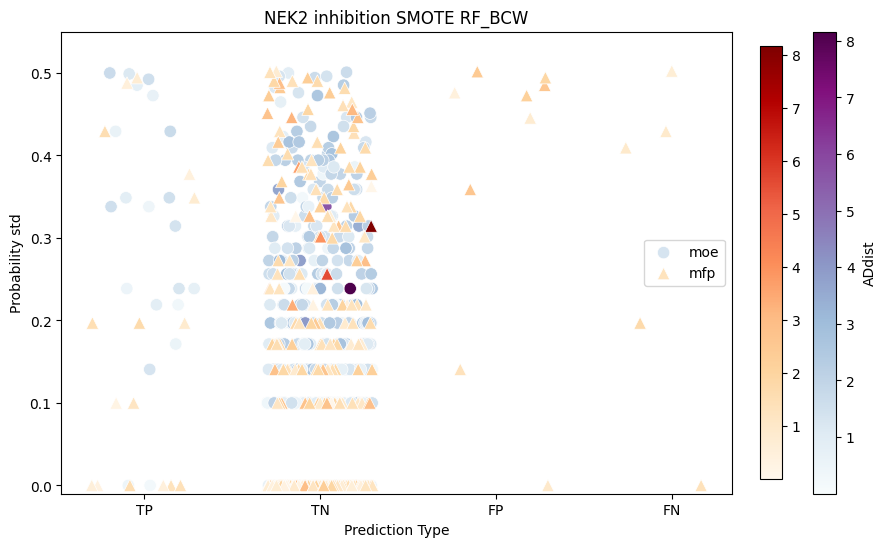

NEK2 SMOTE BRFC


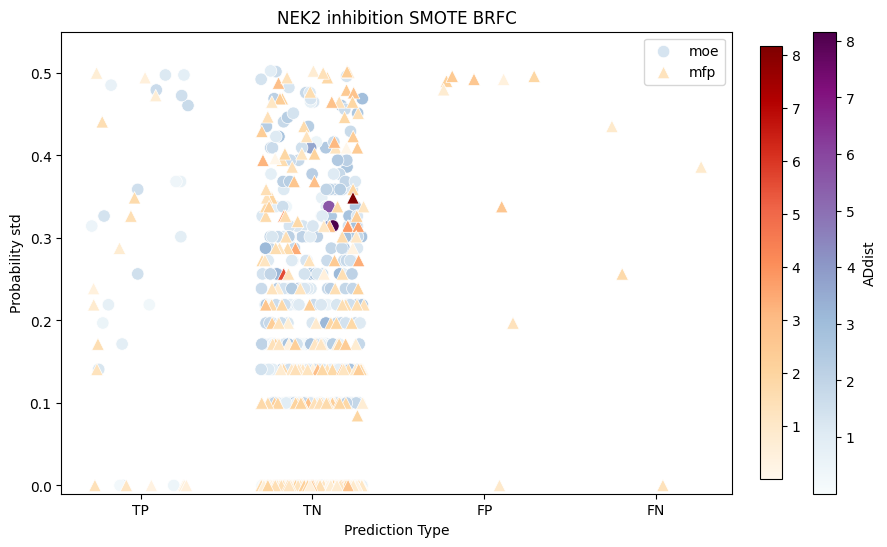

NEK2 SMOTE BRFC_BCW


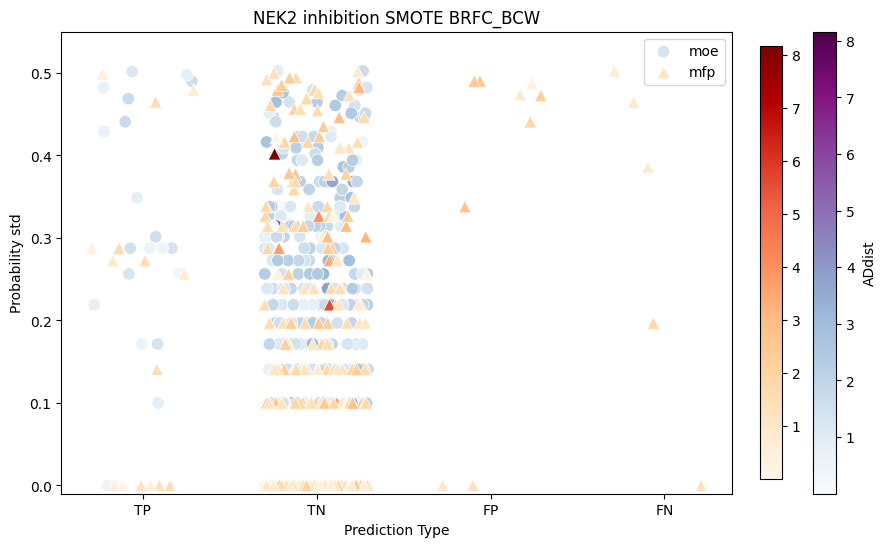

NEK2 ADASYN RF


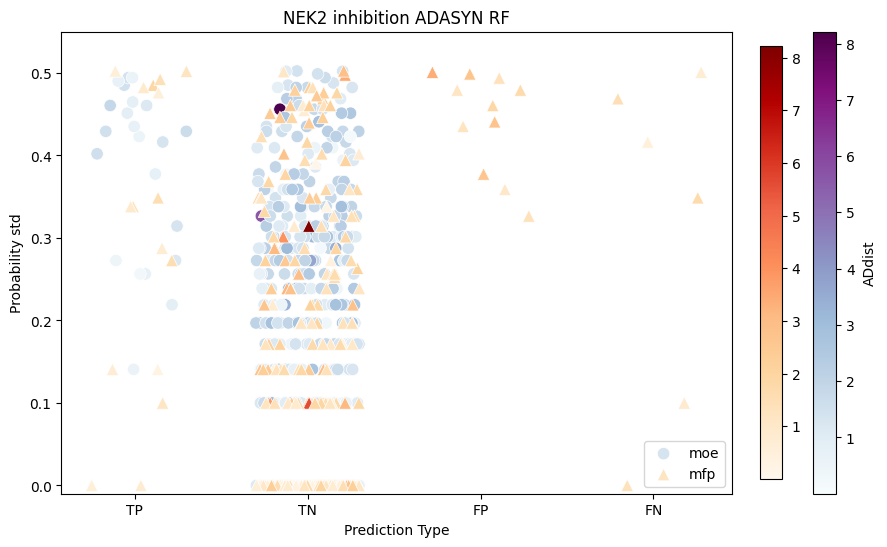

NEK2 ADASYN RF_BCW


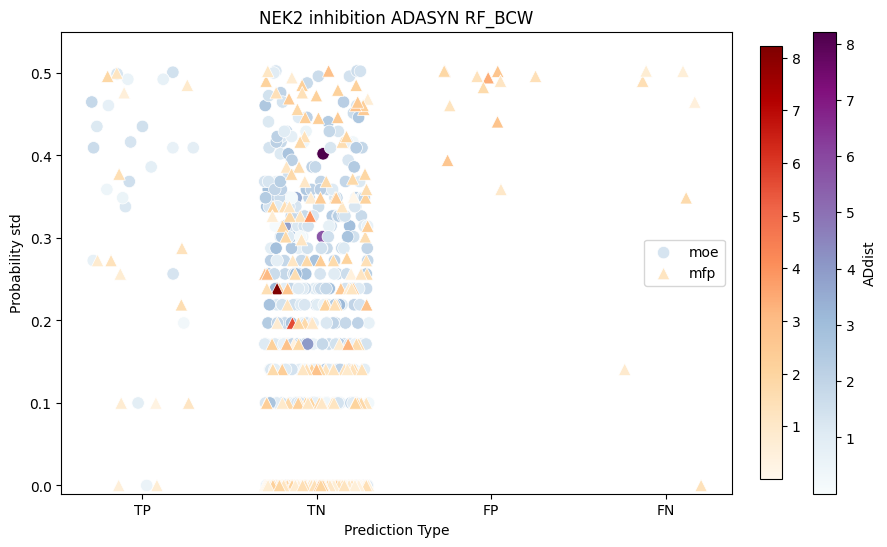

NEK2 ADASYN BRFC


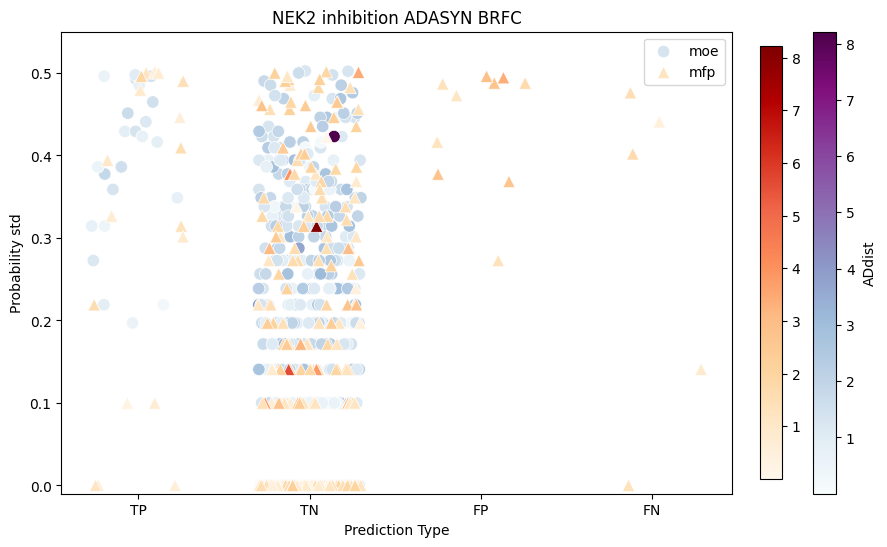

NEK2 ADASYN BRFC_BCW


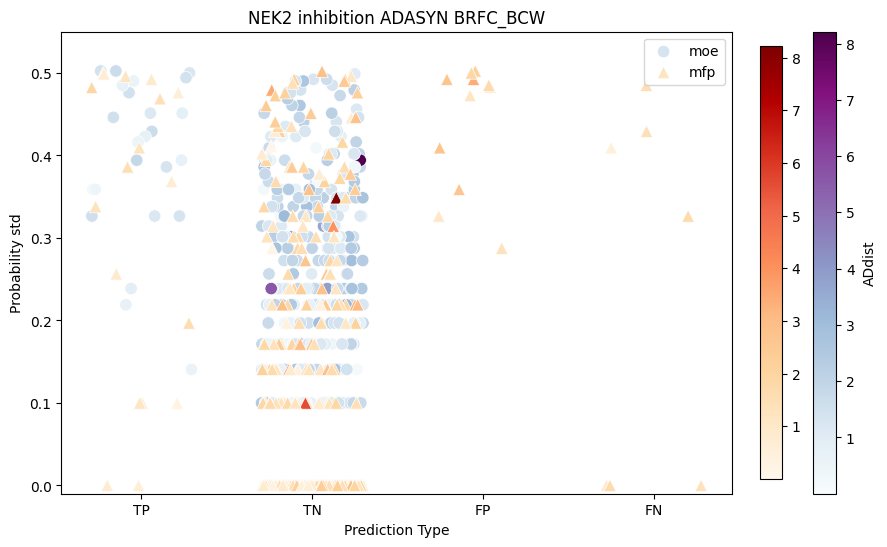

NEK2 scaled RF


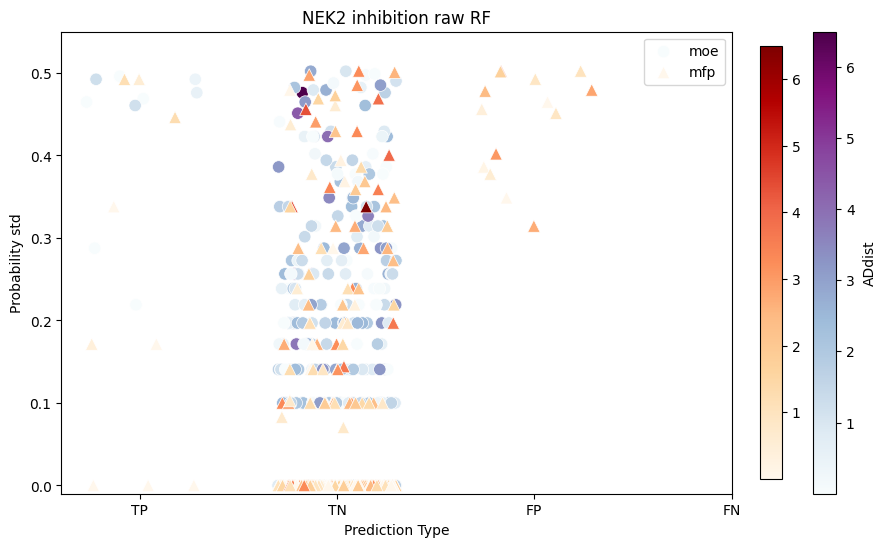

NEK2 scaled RF_BCW


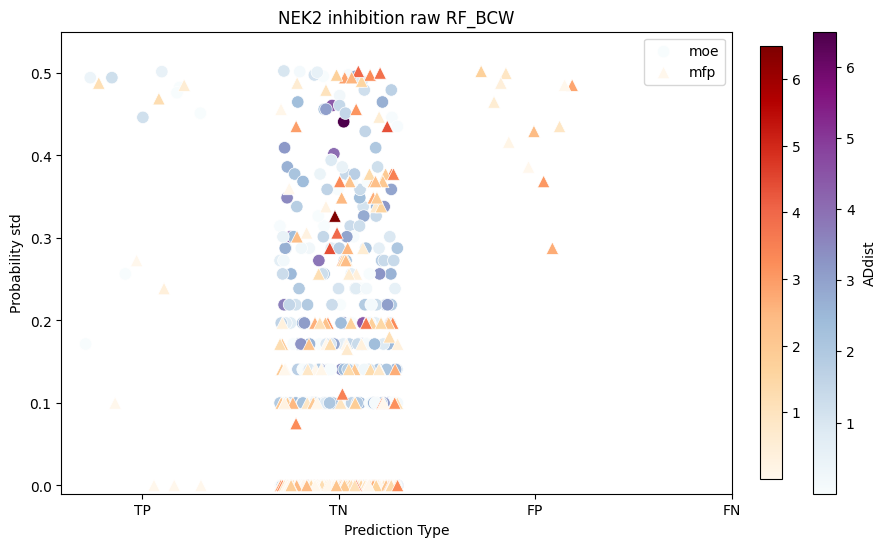

NEK2 scaled BRFC


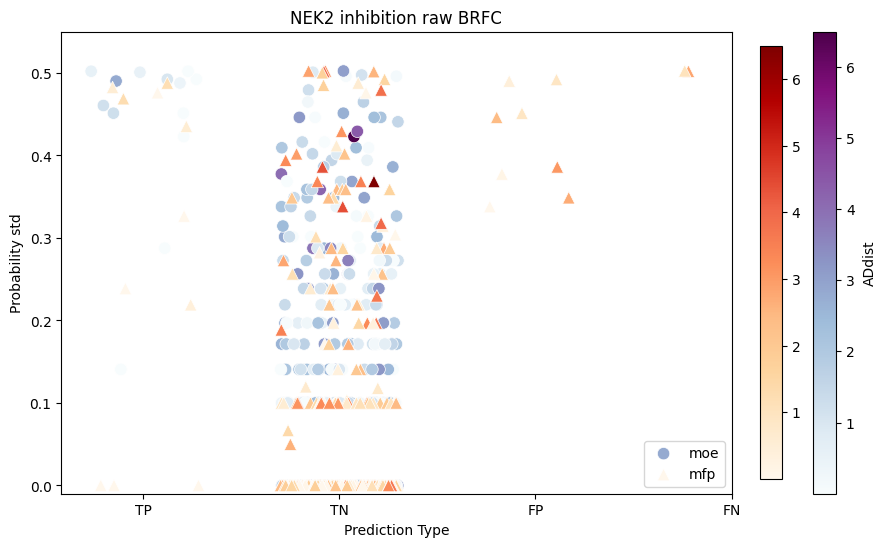

NEK2 scaled BRFC_BCW


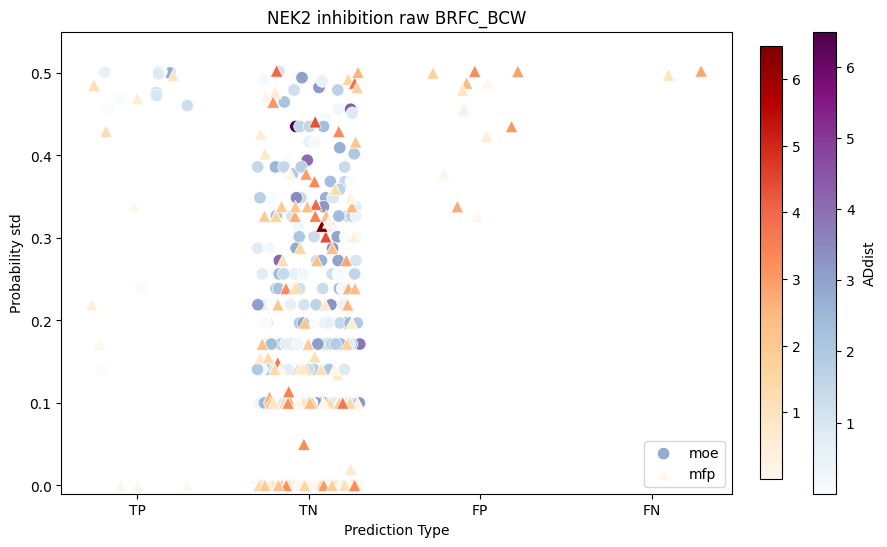

NEK2 UNDER RF


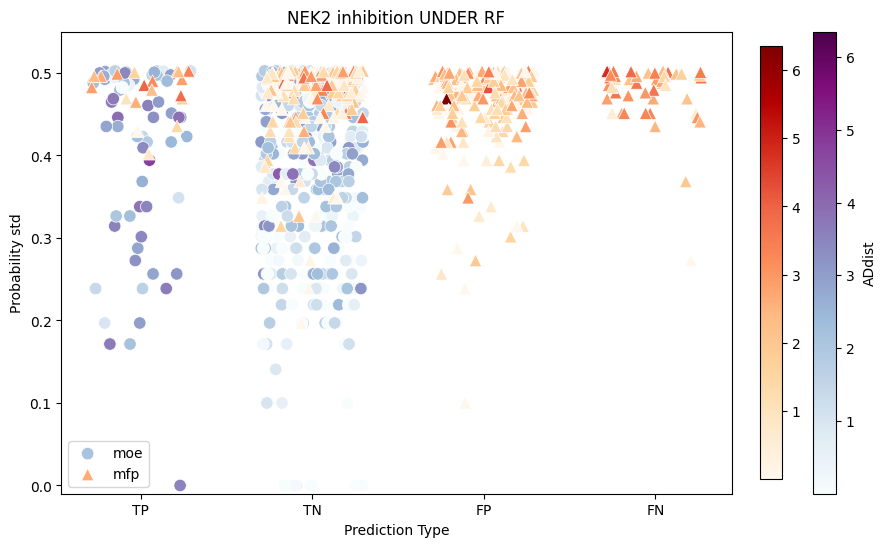

NEK2 UNDER RF_BCW


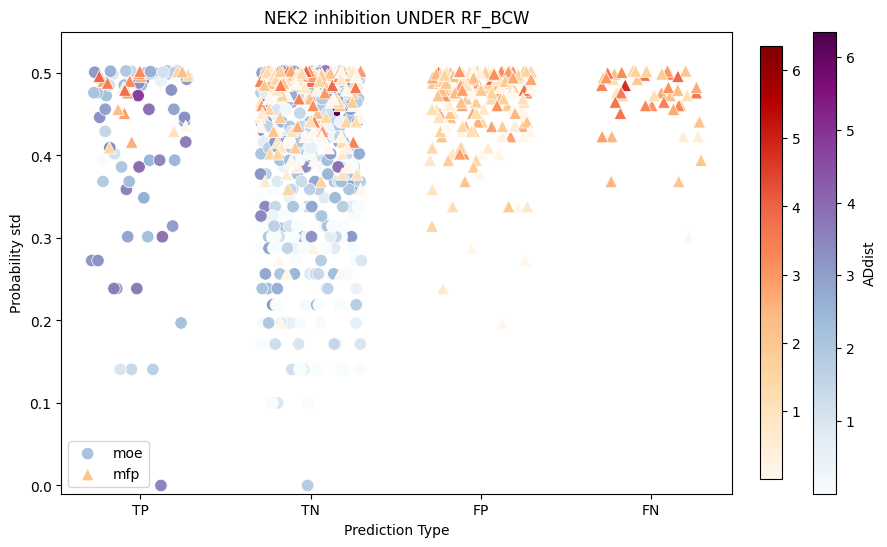

NEK2 UNDER BRFC


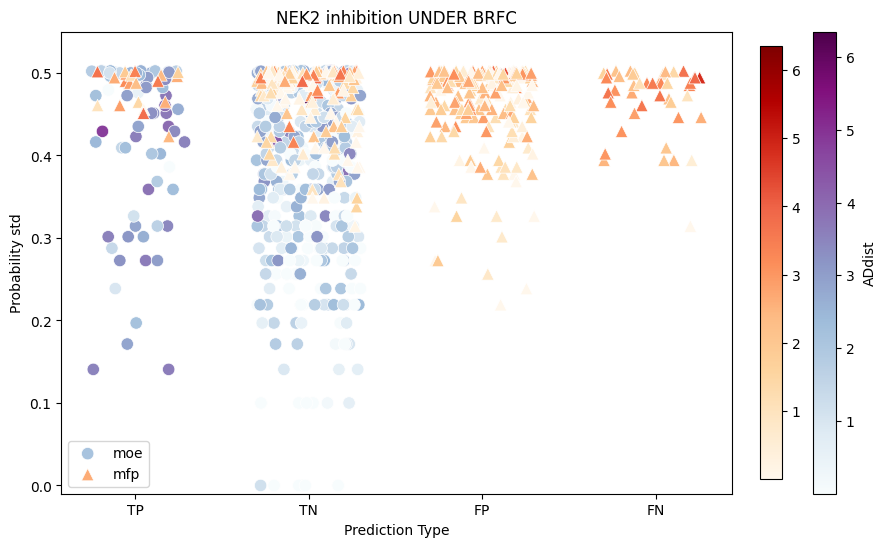

NEK2 UNDER BRFC_BCW


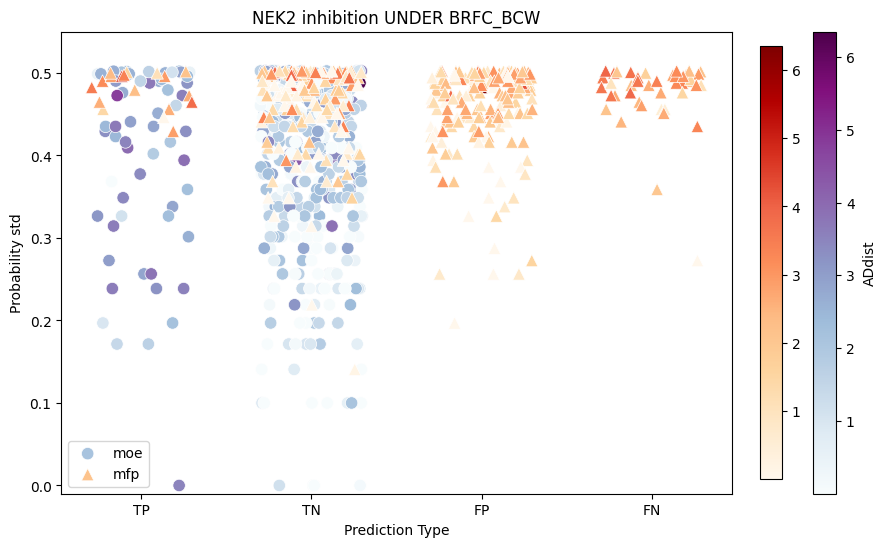

NEK2 SMOTE RF


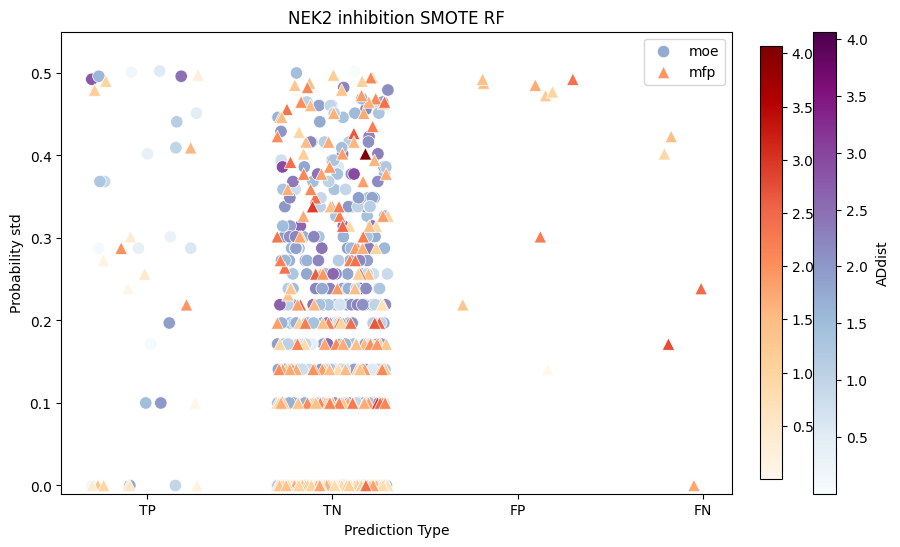

NEK2 SMOTE RF_BCW


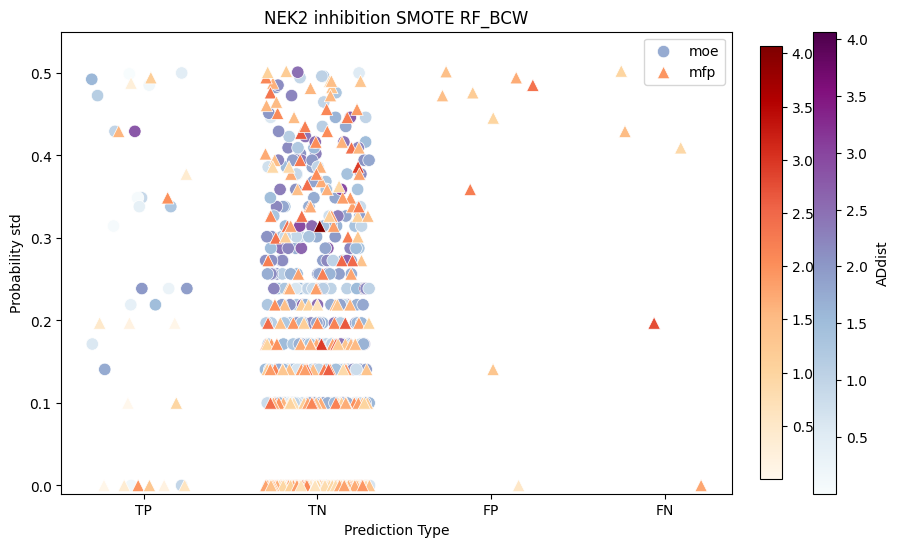

NEK2 SMOTE BRFC


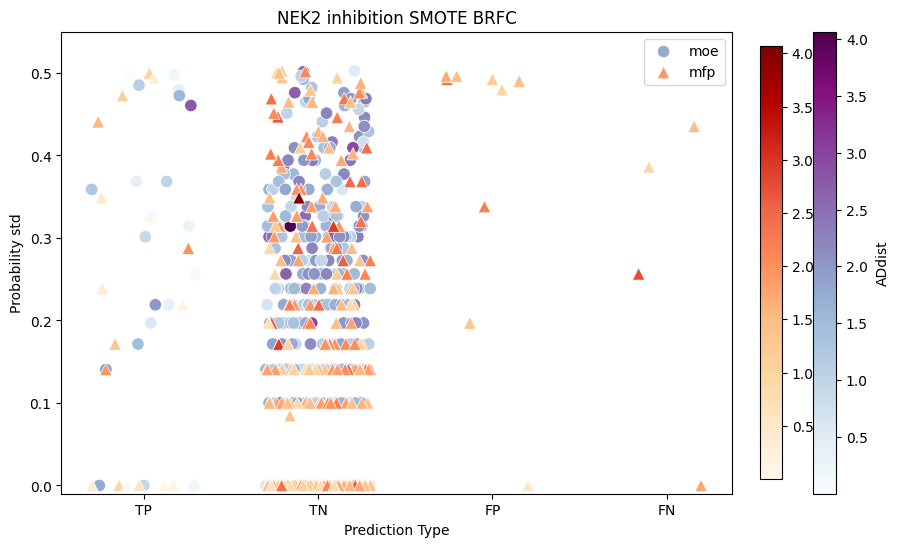

NEK2 SMOTE BRFC_BCW


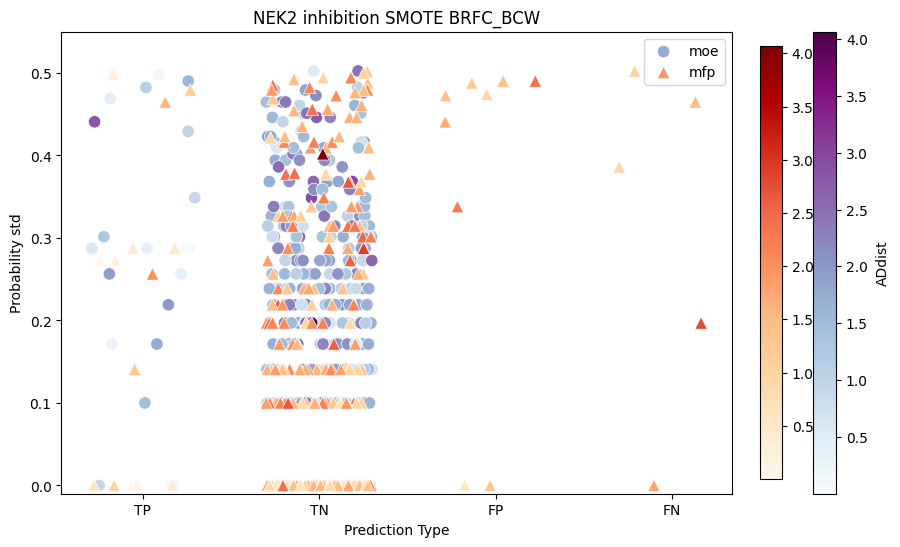

NEK2 ADASYN RF


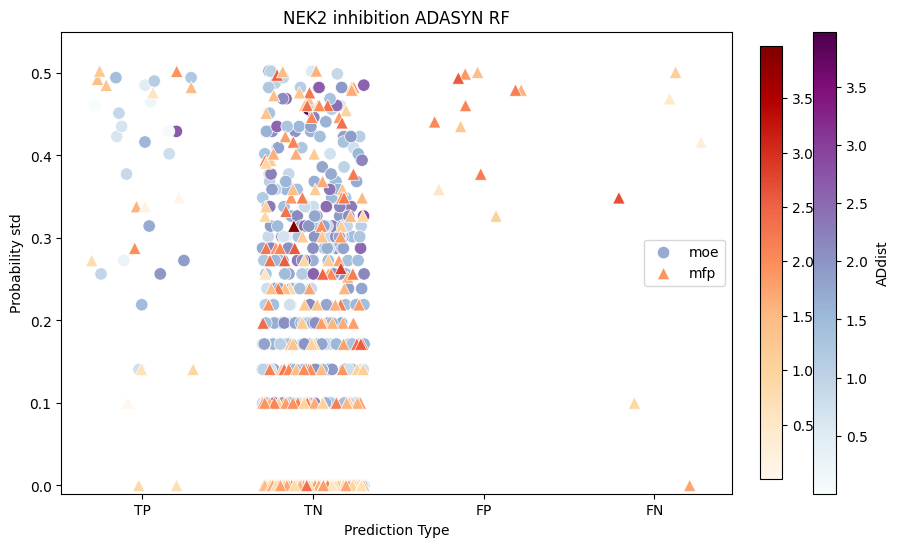

NEK2 ADASYN RF_BCW


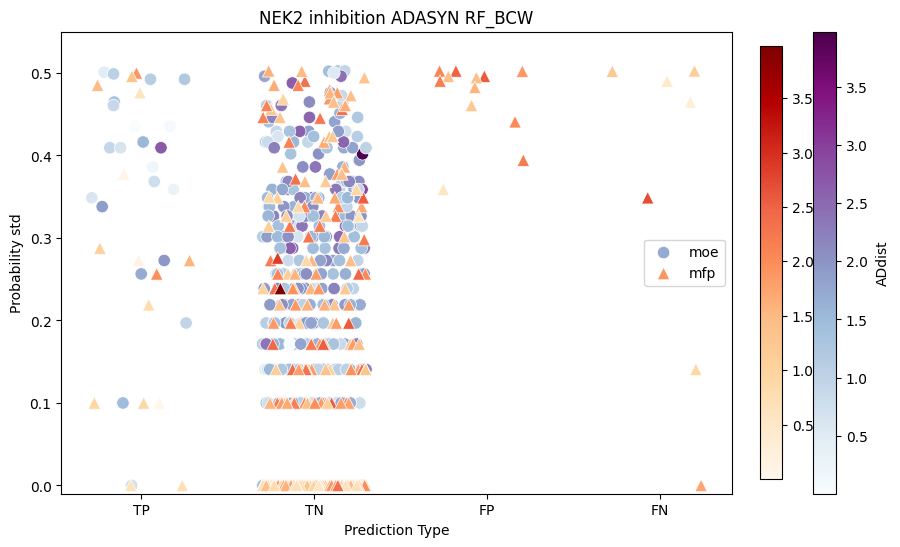

NEK2 ADASYN BRFC


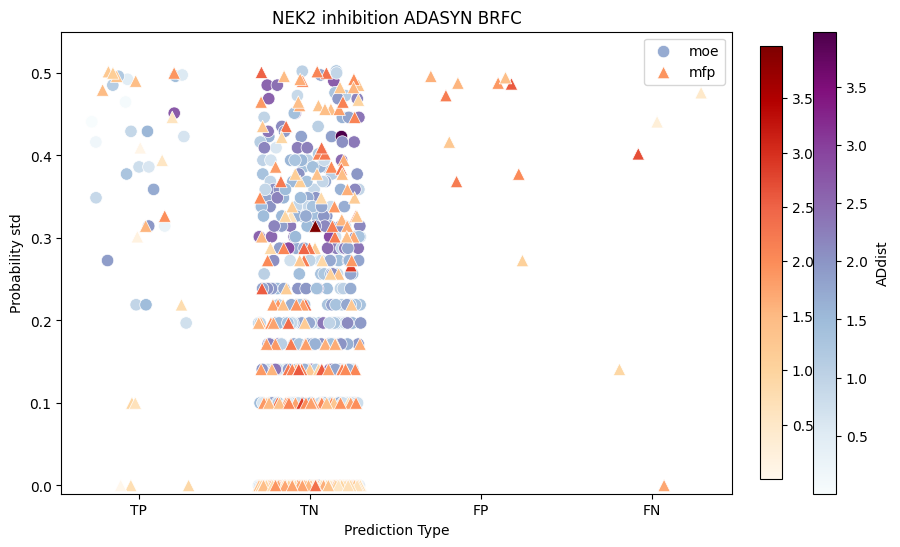

NEK2 ADASYN BRFC_BCW


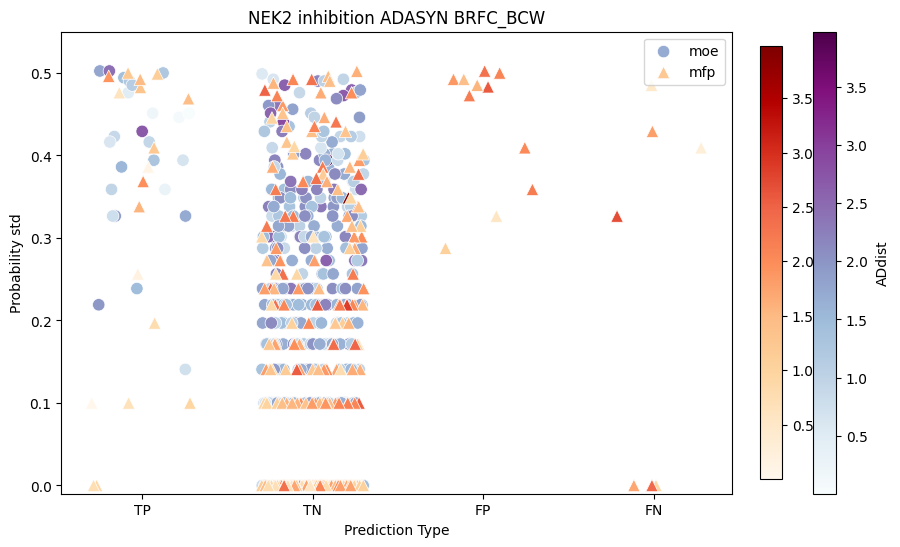

NEK9 scaled RF


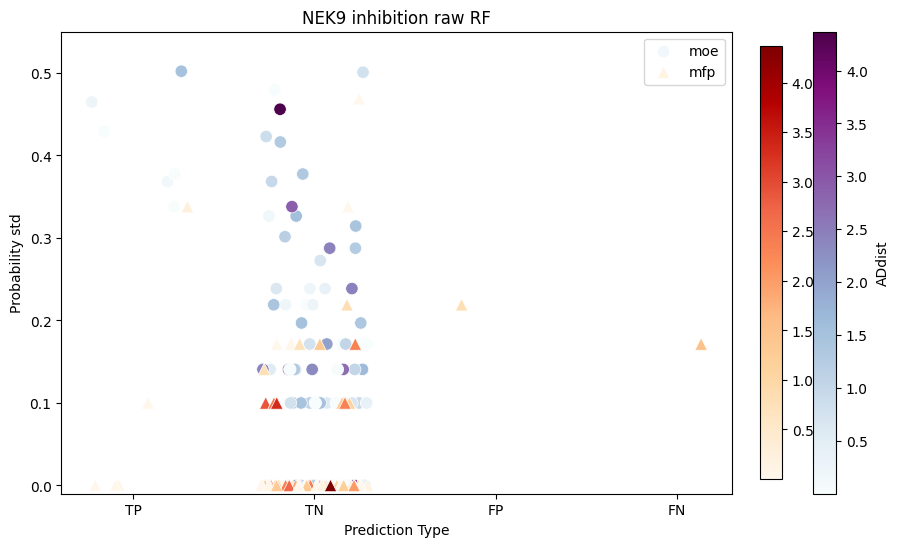

NEK9 scaled RF_BCW


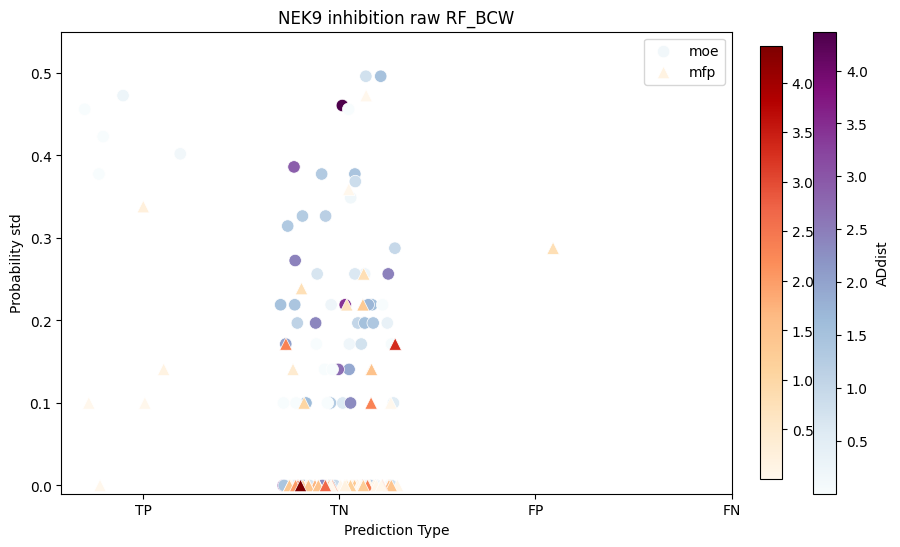

NEK9 scaled BRFC


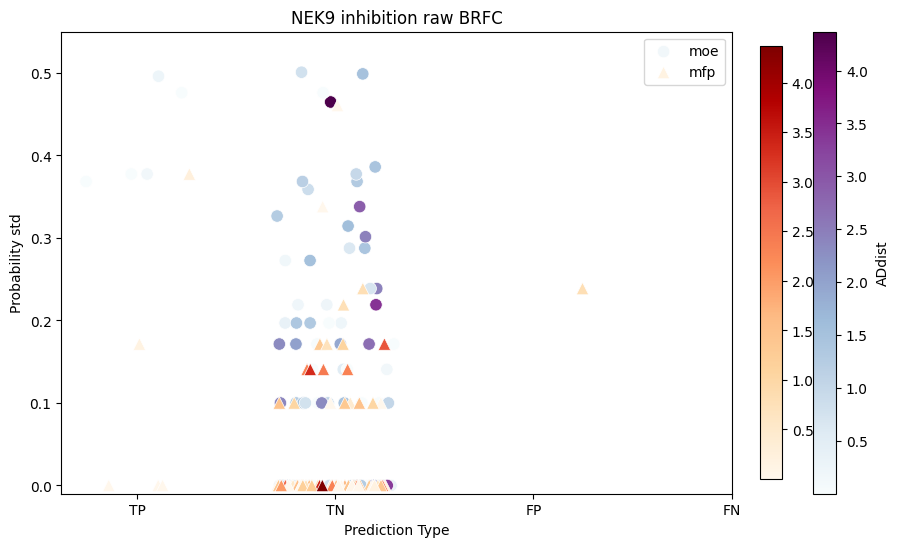

NEK9 scaled BRFC_BCW


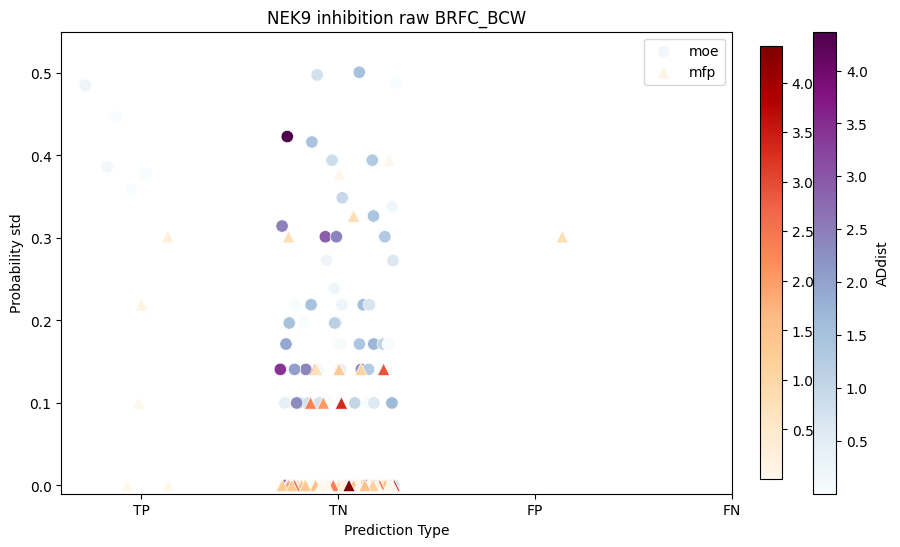

NEK9 UNDER RF


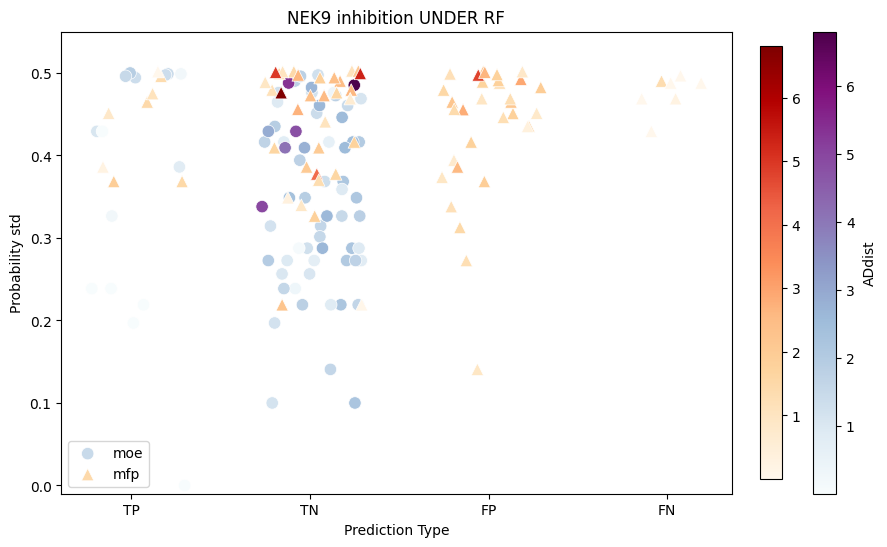

NEK9 UNDER RF_BCW


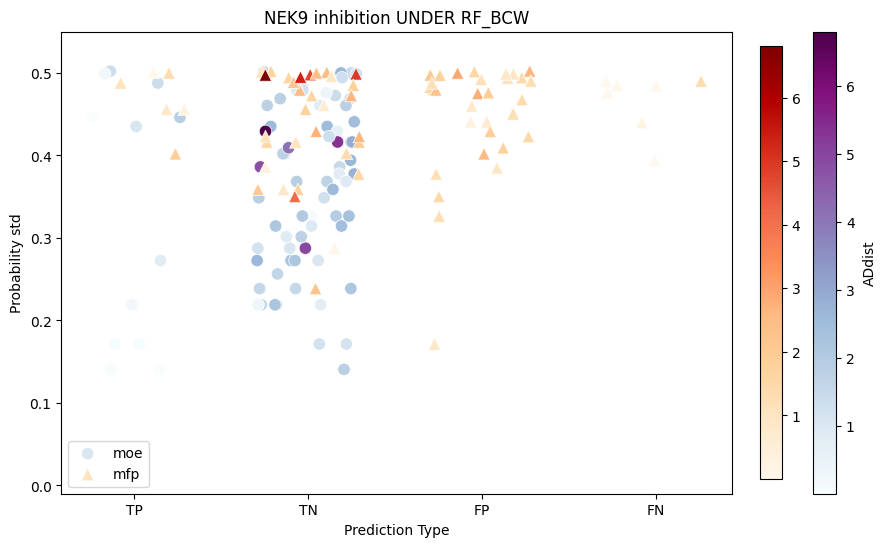

NEK9 UNDER BRFC


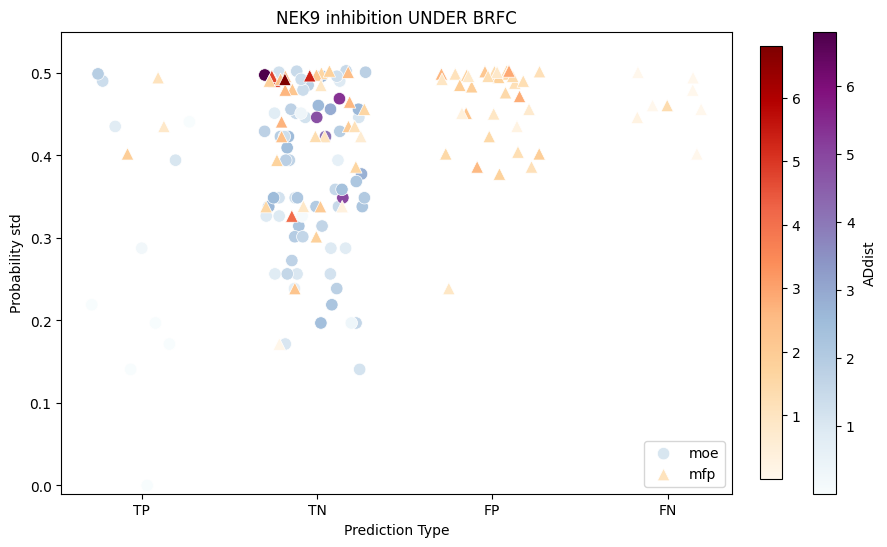

NEK9 UNDER BRFC_BCW


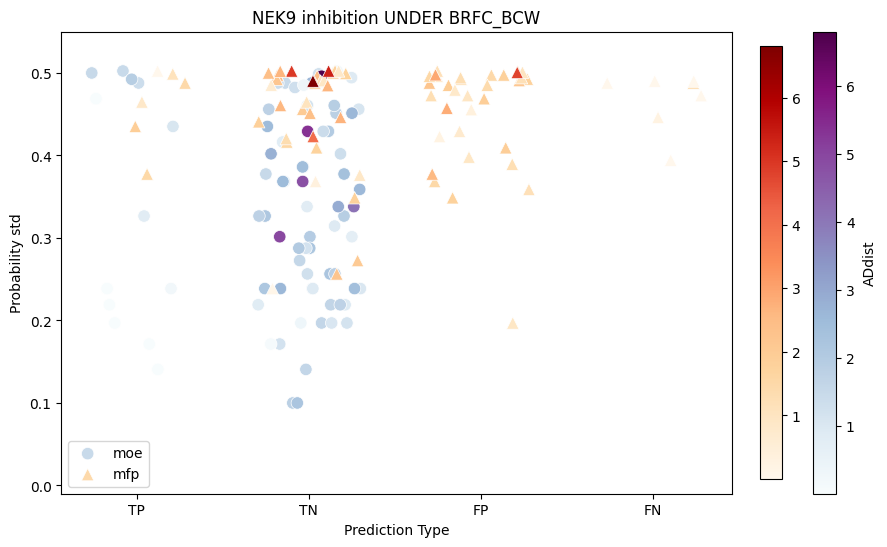

NEK9 SMOTE RF


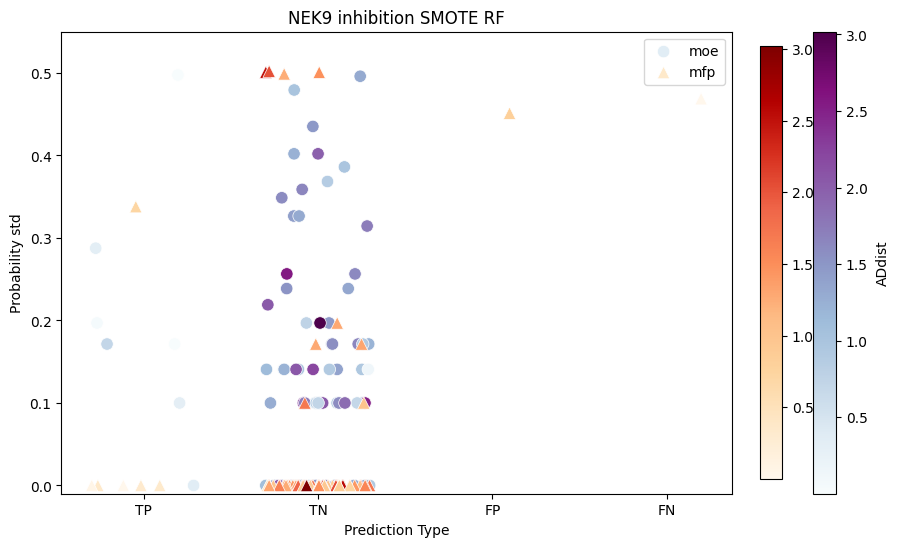

NEK9 SMOTE RF_BCW


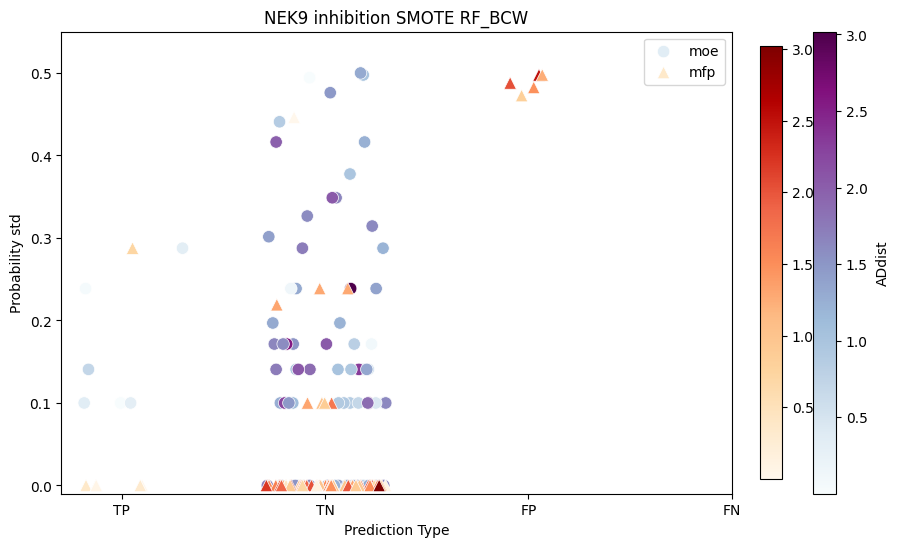

NEK9 SMOTE BRFC


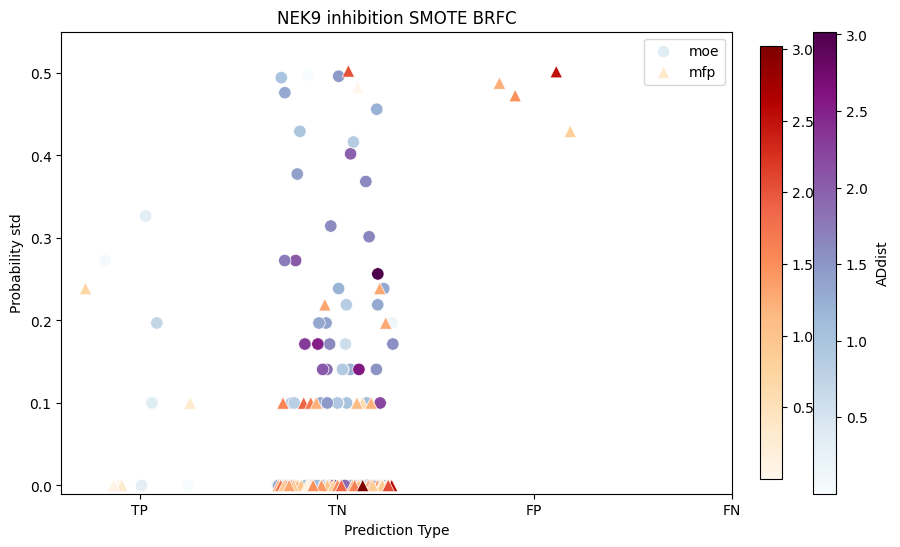

NEK9 SMOTE BRFC_BCW


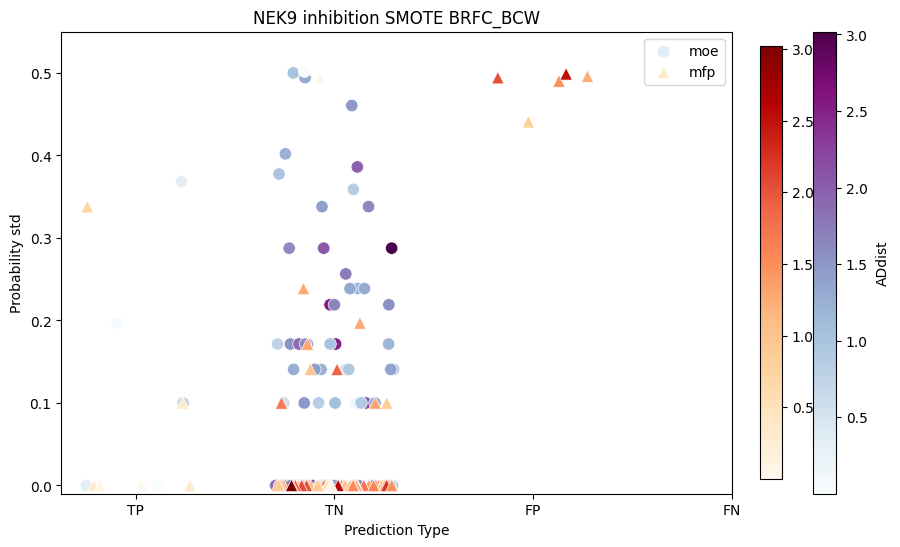

NEK9 ADASYN RF


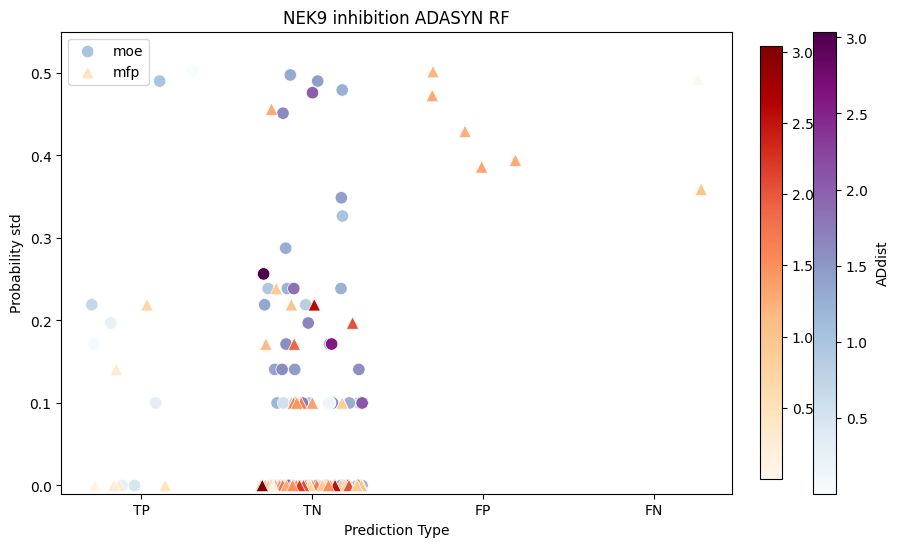

NEK9 ADASYN RF_BCW


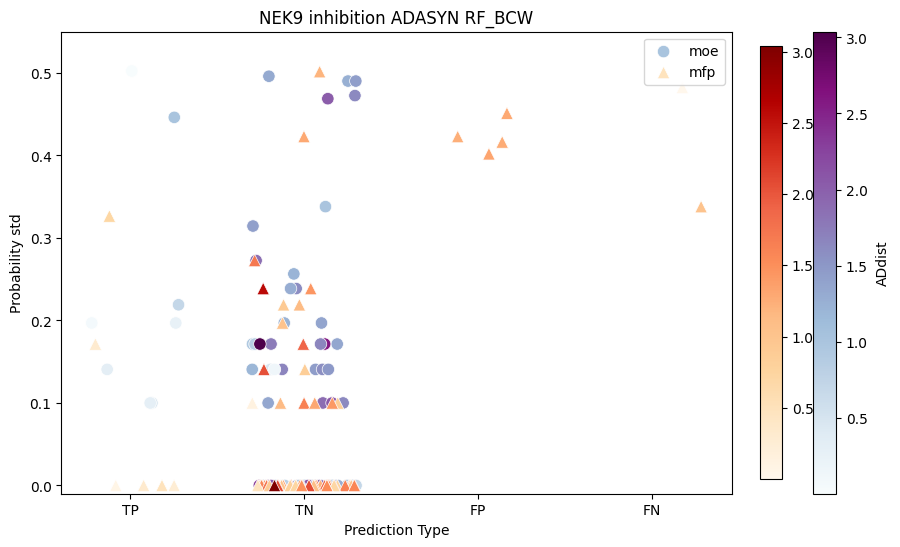

NEK9 ADASYN BRFC


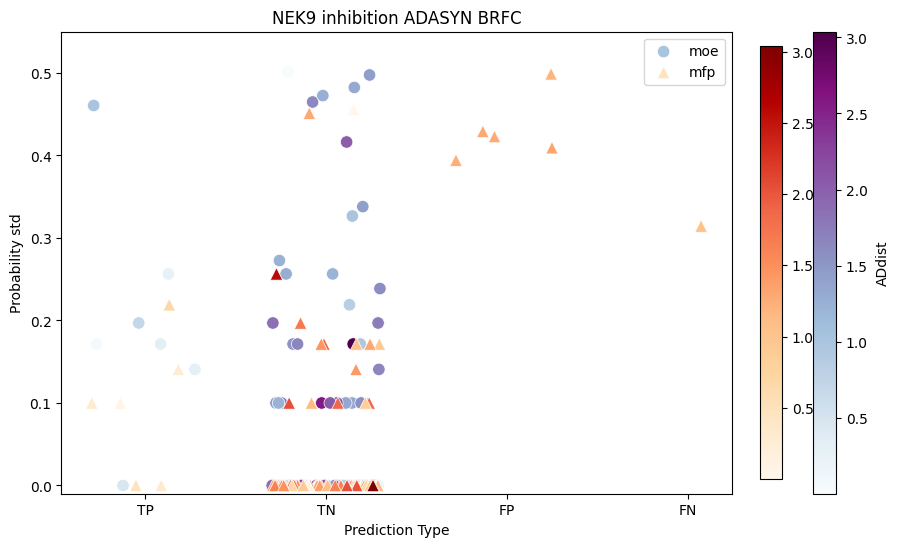

NEK9 ADASYN BRFC_BCW


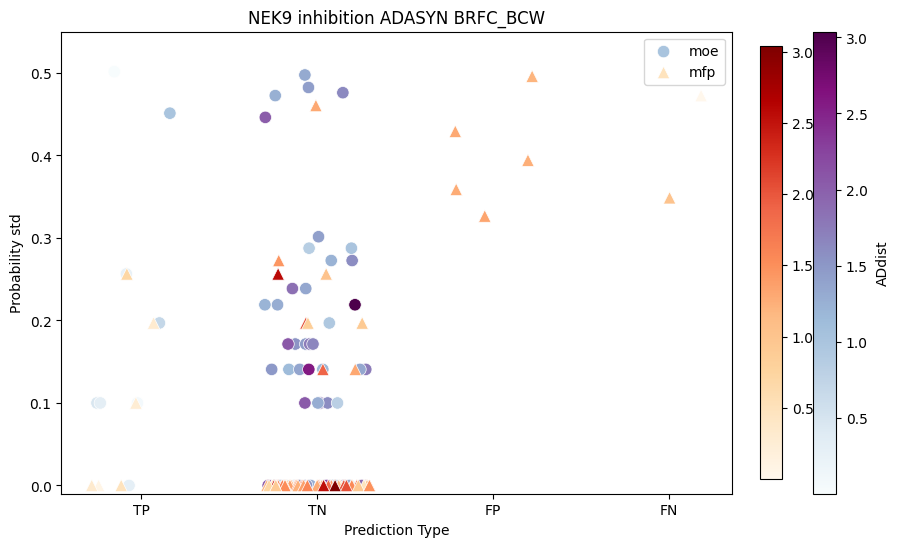

NEK9 scaled RF


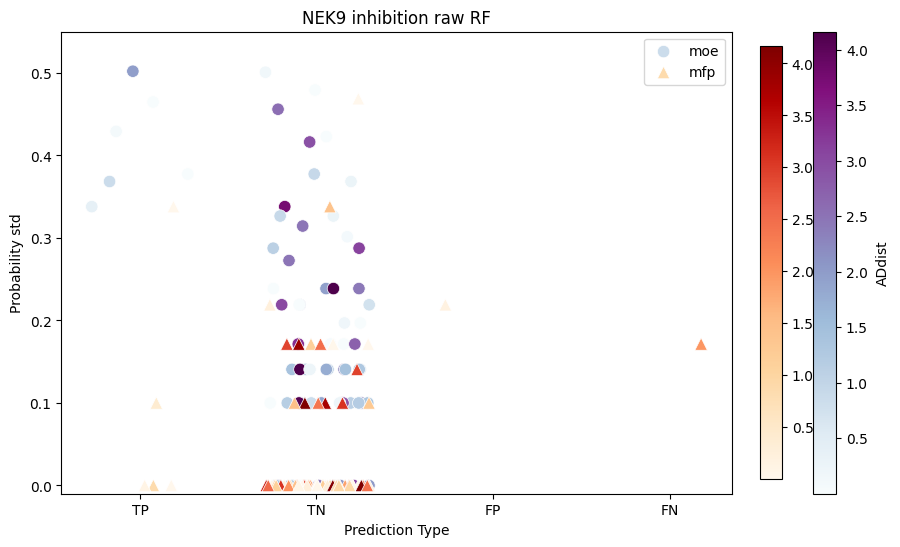

NEK9 scaled RF_BCW


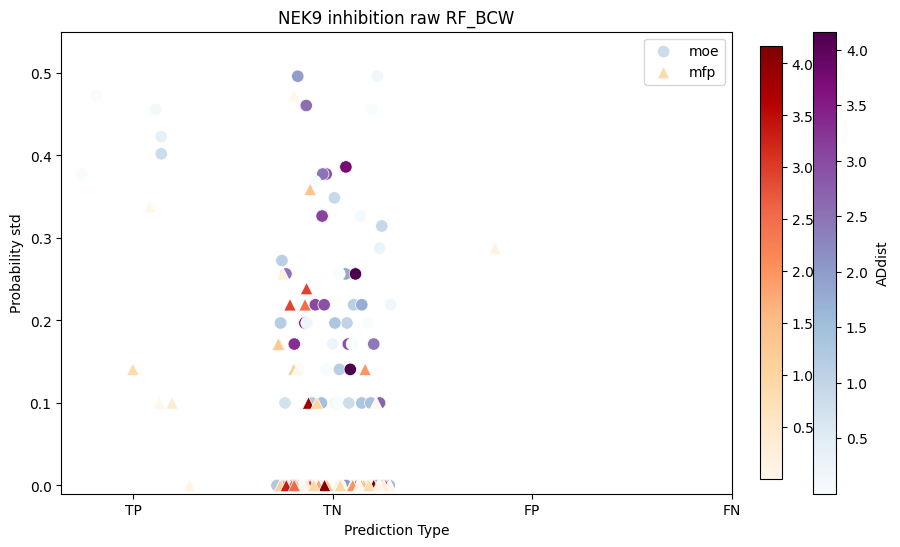

NEK9 scaled BRFC


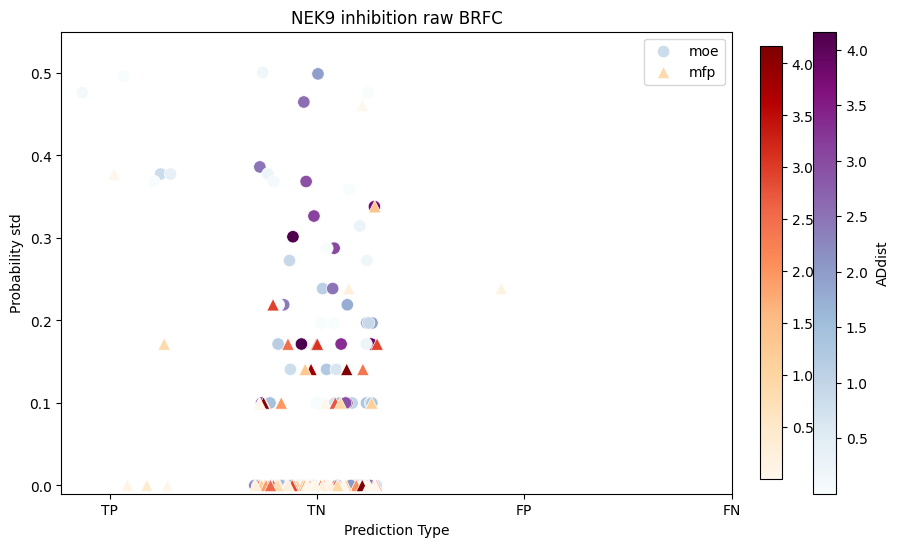

NEK9 scaled BRFC_BCW


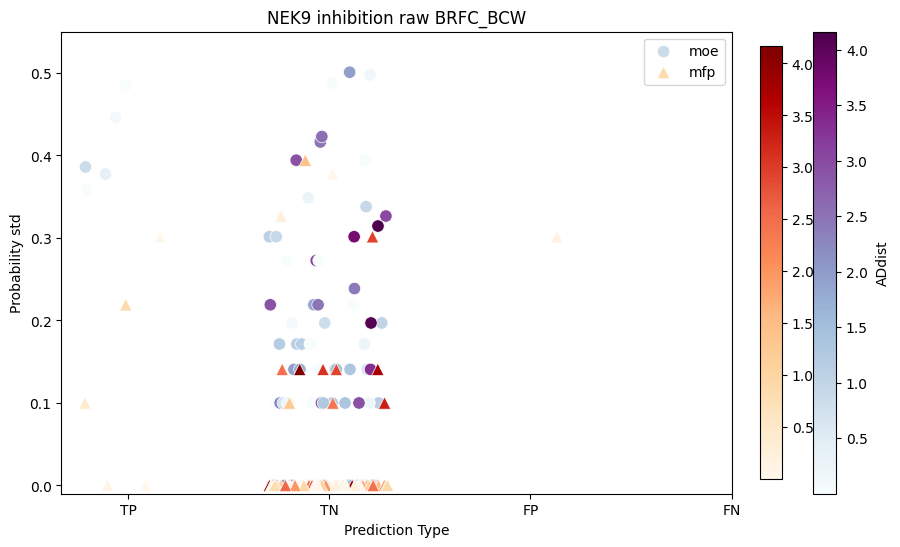

NEK9 UNDER RF


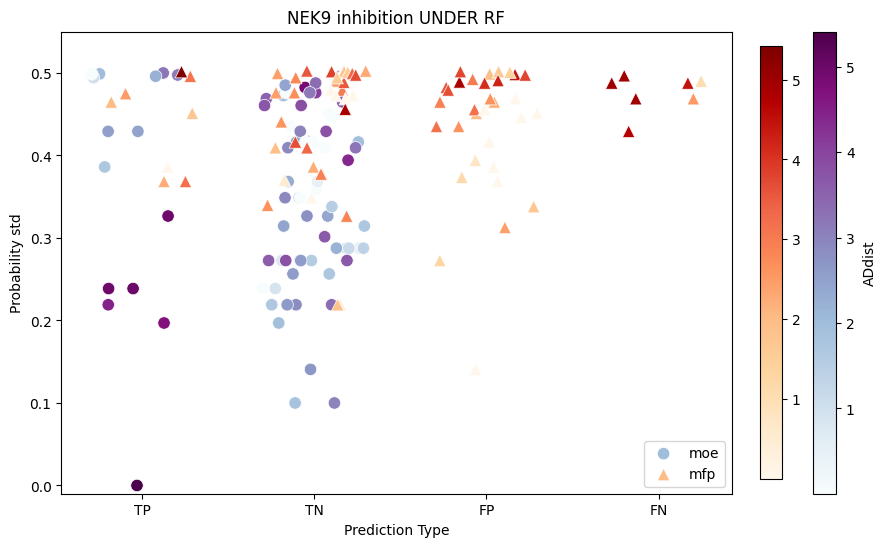

NEK9 UNDER RF_BCW


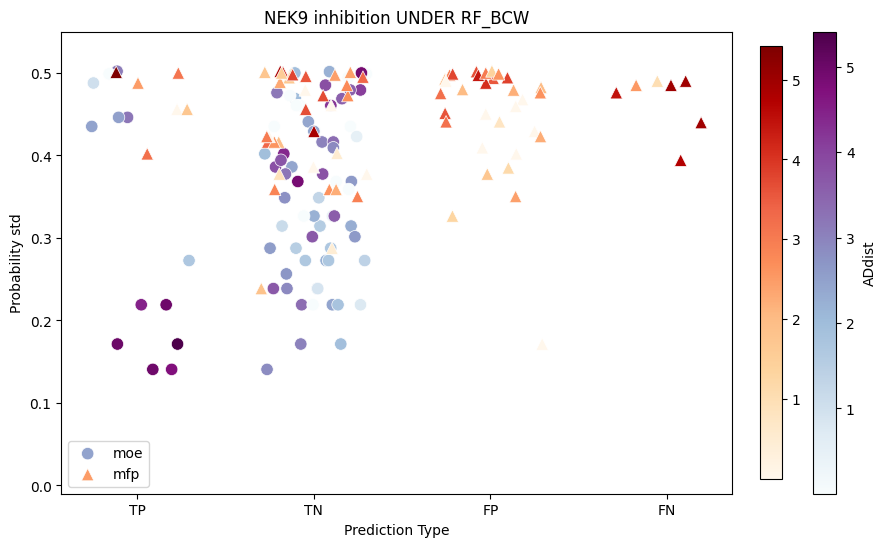

NEK9 UNDER BRFC


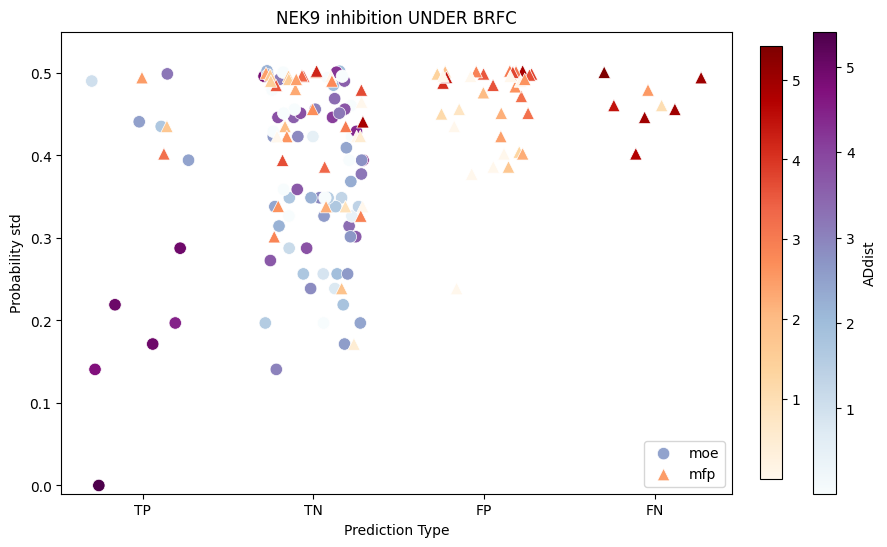

NEK9 UNDER BRFC_BCW


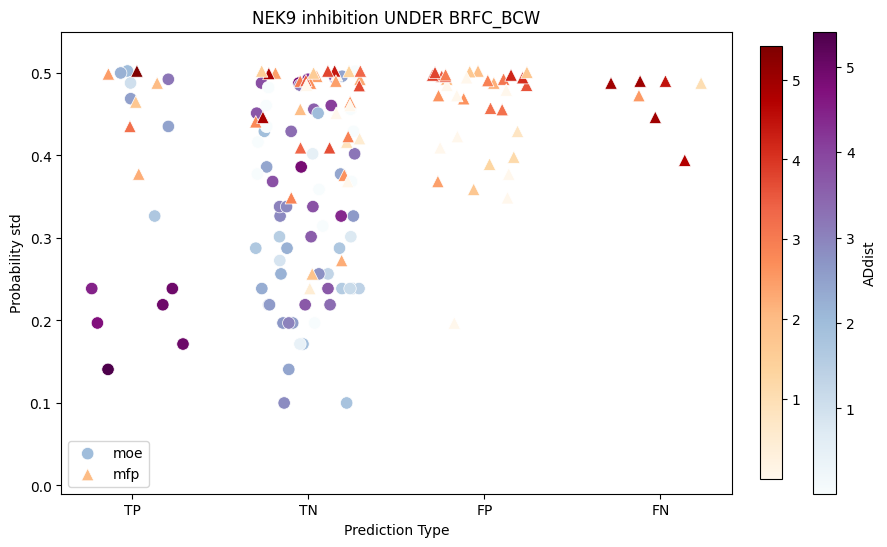

NEK9 SMOTE RF


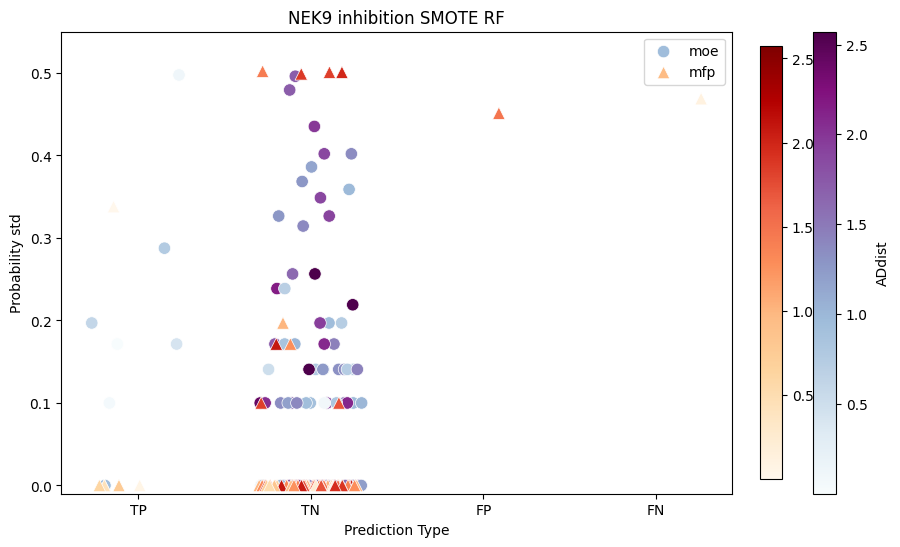

NEK9 SMOTE RF_BCW


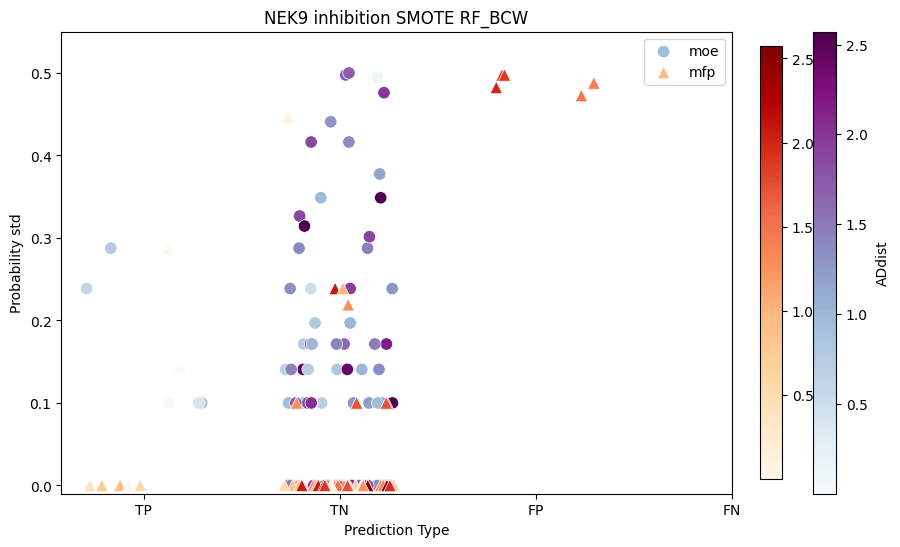

NEK9 SMOTE BRFC


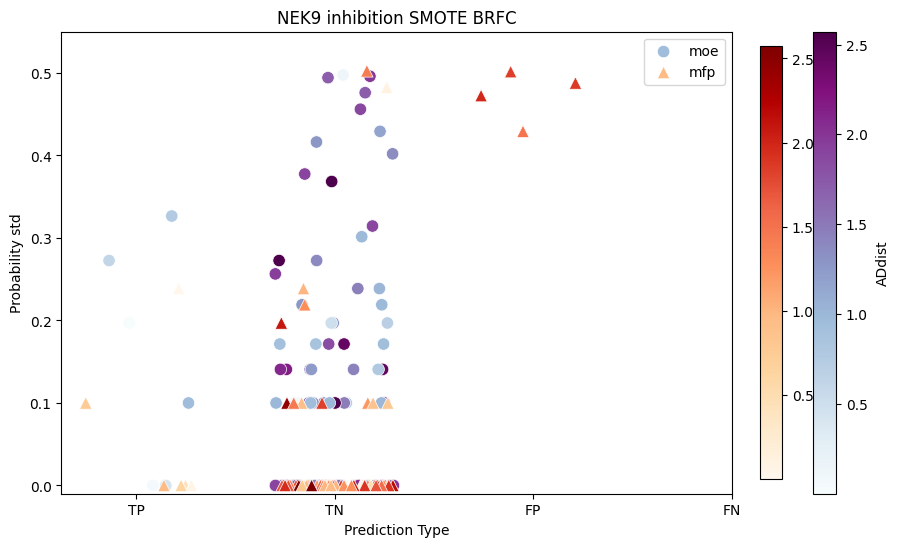

NEK9 SMOTE BRFC_BCW


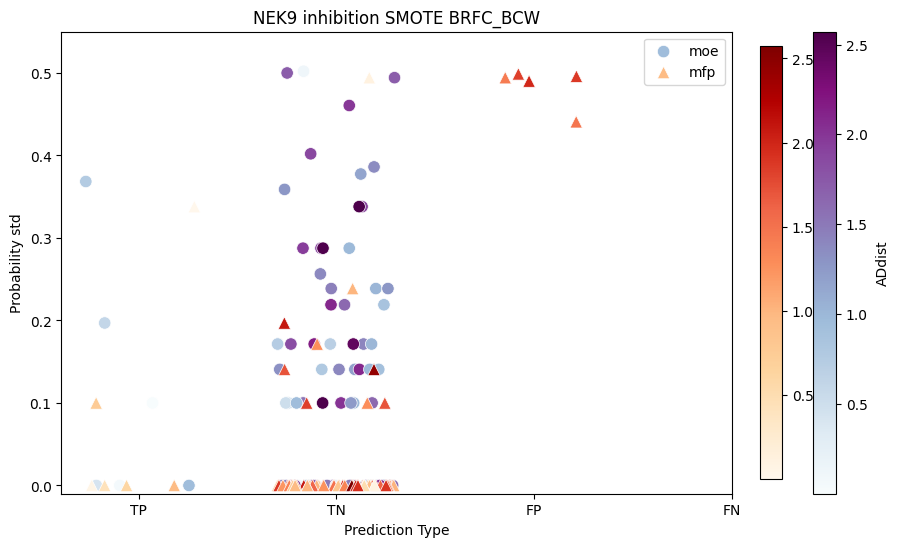

NEK9 ADASYN RF


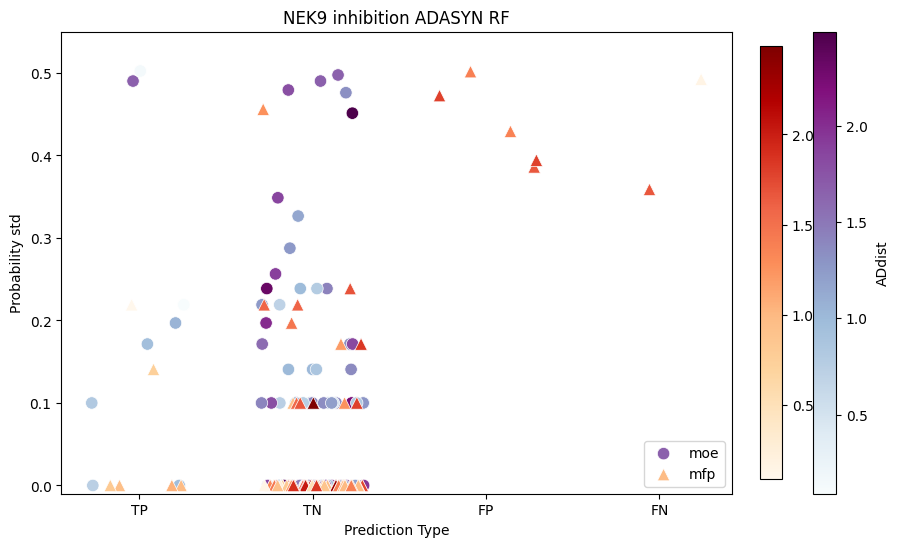

NEK9 ADASYN RF_BCW


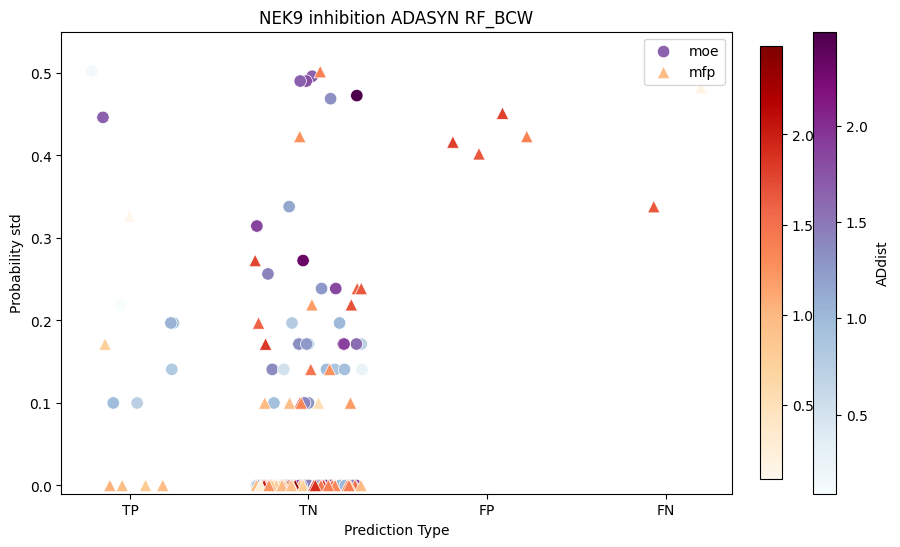

NEK9 ADASYN BRFC


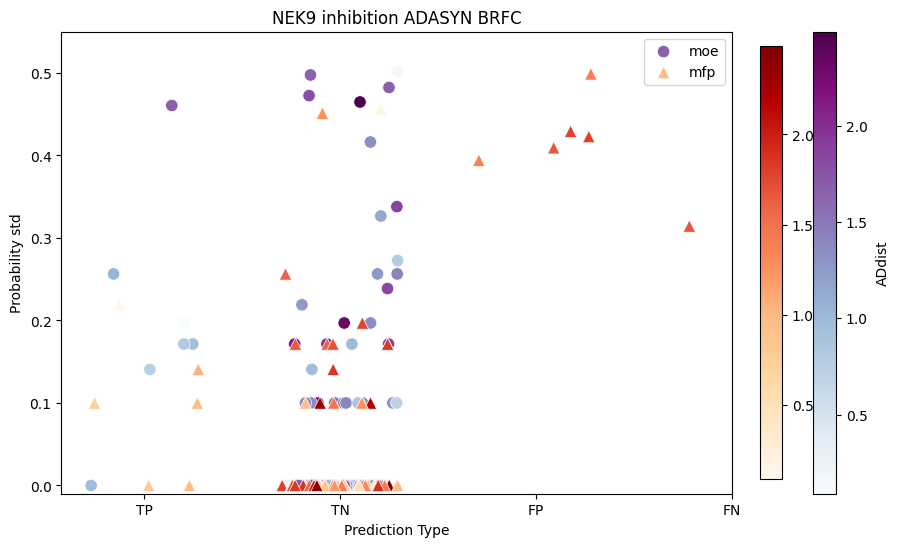

NEK9 ADASYN BRFC_BCW


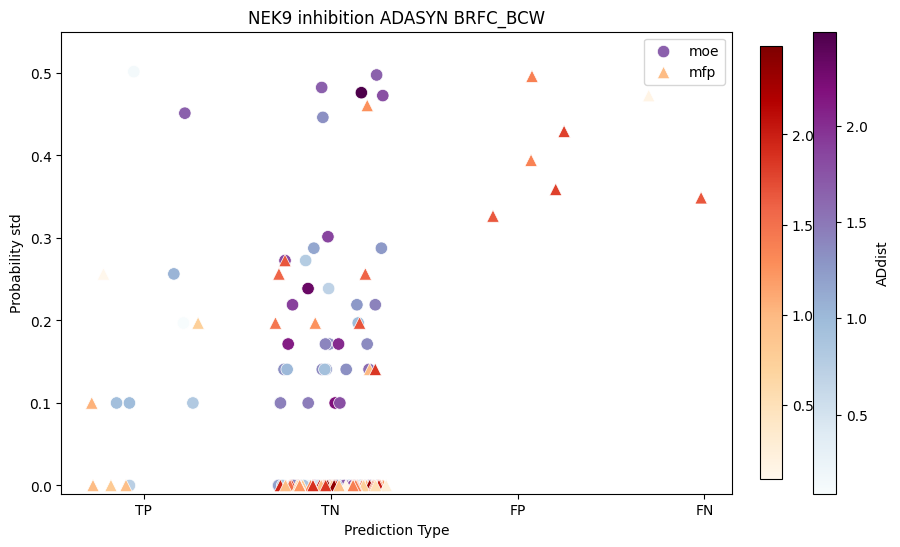

In [249]:
RFpath = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_results/'
col_names = ['prediction_type', 'ADdist', 'model_type']
model_palette = sns.cubehelix_palette(start=.5, rot=-.5, n_colors=2)
category_order = ['TP', 'TN', 'FP', 'FN']
figure_path = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/plots/AD/figures/AD_RF_std_prob/'
for nek in nek_list:
    for feat in feat_types: 
        for samp in samplings: 
            df_path = f'/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK{nek}/bind/'
            full_df = pd.read_csv(f'{df_path}NEK{nek}_binding_{feat}_{samp}_df.csv') 
            train_df = full_df[full_df['subset'] == 'train'].select_dtypes(include=numerics).drop(columns=['active'])
            test_df = full_df[full_df['subset'] == 'test'].select_dtypes(include=numerics).drop(columns=['active'])
            test_dist = calc_AD_kmean_dist(train_df, test_df, k)
            train_dist = calc_AD_kmean_dist(train_df, train_df, k)
            
            for rf in RF_types:
                print(f'NEK{nek} {samp} {rf}')

                moe_pred = pd.read_csv(f'{result_path}NEK{nek}_binding_moe_{samp}_{rf}_test.csv')
                mfp_pred = pd.read_csv(f'{result_path}NEK{nek}_binding_mfp_{samp}_{rf}_test.csv')
                stdprobs = pd.read_csv(f'{prob_path}NEK{nek}_binding_std_prob_{samp}_{rf}.csv')
                std0_moe = stdprobs['std0_moe'].to_numpy()
                std1_moe = stdprobs['std1_moe'].to_numpy()
                std0_mfp = stdprobs['std0_mfp'].to_numpy()
                std1_mfp  = stdprobs['std1_mfp'].to_numpy()
                moe_preds = moe_pred['prediction']
                mfp_preds = mfp_pred['prediction']
      
                true_labels =moe_pred['y'].to_numpy()
    
                # print(moe_preds.shape, mfp_preds.shape, stdprobs.shape, std0_moe.shape, std1_moe.shape,std0_mfp.shape,std1_mfp.shape)

                moe_df = pd.DataFrame({'prediction': moe_preds, 'category': moe_pred['prediction_type'], 'std0': std0_moe, 'std1': std1_moe, 'ADdist': test_dist})
                mfp_df = pd.DataFrame({'prediction': mfp_preds, 'category': mfp_pred['prediction_type'], 'std0': std0_mfp, 'std1': std1_mfp, 'ADdist': test_dist})
                moe_df['feat_type'] = 'moe'
                mfp_df['feat_type']= 'mfp' 
                df = pd.concat([moe_df, mfp_df])
                if (samp=='scaled'): 
                    samp='raw'
                # swarm_stdprob_AD_simple(moe_preds.to_numpy(), true_labels,std1_moe, std0_moe, test_dist, f'NEK{nek}_binding_moe_{samp}_{rf}_AD')
                # swarm_stdprob_AD_simple(mfp_preds.to_numpy(), true_labels,std1_mfp, std0_mfp, test_dist, f'NEK{nek}_binding_mfp_{samp}_{rf}_AD')
                # swarm_stdprob_AD2(df,f'NEK{nek} binding {samp} {rf}',figure_path, f'NEK{nek}_binding_{samp}_{rf}_AD_moemfp')
                # swarm_stdprob_AD4(df,f'NEK{nek} binding {samp} {rf}')
                swarm_stdprob_AD4_jitter(df,f'NEK{nek} binding {samp} {rf}', figure_path,f'NEK{nek}_binding_{samp}_{rf}_AD_stdprob_moemfp.png' )
                if (samp=='raw'): 
                    samp='scaled'

# DO IT FOR INHIBITION
for nek in ['2','9']:
    for feat in feat_types: 
        for samp in samplings: 
            df_path = f'/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK{nek}/inhib/'
            full_df = pd.read_csv(f'{df_path}NEK{nek}_inhibition_{feat}_{samp}_df.csv') 
            train_df = full_df[full_df['subset'] == 'train'].select_dtypes(include=numerics).drop(columns=['active'])
            test_df = full_df[full_df['subset'] == 'test'].select_dtypes(include=numerics).drop(columns=['active'])
            test_dist = calc_AD_kmean_dist(train_df, test_df, k)
            train_dist = calc_AD_kmean_dist(train_df, train_df, k)
            for rf in RF_types:
                print(f'NEK{nek} {samp} {rf}')

                moe_pred = pd.read_csv(f'{result_path}NEK{nek}_inhibition_moe_{samp}_{rf}_test.csv')
                mfp_pred = pd.read_csv(f'{result_path}NEK{nek}_inhibition_mfp_{samp}_{rf}_test.csv')
                stdprobs = pd.read_csv(f'{prob_path}NEK{nek}_inhibition_std_prob_{samp}_{rf}.csv')
                std0_moe = stdprobs['std0_moe'].to_numpy()
                std1_moe = stdprobs['std1_moe'].to_numpy()
                std0_mfp = stdprobs['std0_mfp'].to_numpy()
                std1_mfp  = stdprobs['std1_mfp'].to_numpy()
                moe_preds = moe_pred['prediction']
                mfp_preds = mfp_pred['prediction']
                true_labels =moe_pred['y'].to_numpy()
  
                # print(moe_preds.shape, mfp_preds.shape, stdprobs.shape, std0_moe.shape, std1_moe.shape,std0_mfp.shape,std1_mfp.shape)

                moe_df = pd.DataFrame({'prediction': moe_preds, 'category': moe_pred['prediction_type'], 'std0': std0_moe, 'std1': std1_moe, 'ADdist': test_dist})
                mfp_df = pd.DataFrame({'prediction': mfp_preds, 'category': mfp_pred['prediction_type'], 'std0': std0_mfp, 'std1': std1_mfp, 'ADdist': test_dist})
                moe_df['feat_type'] = 'moe'
                mfp_df['feat_type']= 'mfp' 
                moe_df = moe_df.reset_index(drop=True)
                mfp_df = mfp_df.reset_index(drop=True)
                df = pd.concat([moe_df, mfp_df])
                if (samp=='scaled'): 
                    samp='raw'
                # swarm_stdprob_AD2(df,f'NEK{nek} inhibition {samp} {rf}',figure_path, f'NEK{nek}_inhibition_{samp}_{rf}_AD_moemfp')
                swarm_stdprob_AD4_jitter(df,f'NEK{nek} inhibition {samp} {rf}', figure_path,f'NEK{nek}_inhibition_{samp}_{rf}_AD_stdprob_moemfp.png' )
                # swarm_stdprob_AD_simple(moe_preds.to_numpy(), true_labels,std1_moe, std0_moe, test_dist, f'NEK{nek}_inhibition_moe_{samp}_{rf}_AD')
                # swarm_stdprob_AD_simple(mfp_preds.to_numpy(), true_labels,std1_mfp, std0_mfp, test_dist, f'NEK{nek}_inhibition_mfp_{samp}_{rf}_AD')
                if (samp=='raw'): 
                    samp='scaled'

In [240]:
def swarm_stdprob_AD_simple(predictions, true_labels,std1, std0, ad_dist, title):
    # works for one at a time
    print(predictions.shape, true_labels.shape)
    
    true_pos = np.where((predictions == 1) & (true_labels == 1).flatten())[0] 
    true_neg = np.where((predictions == 0) & (true_labels == 0).flatten())[0]
    false_pos = np.where((predictions == 1) & (true_labels == 0).flatten())[0] 
    false_neg = np.where((predictions == 0) & (true_labels == 1).flatten())[0] 
    tp_std1 = std1[true_pos]
    tn_std0 = std0[true_neg]
    fp_std1 = std1[false_pos]
    fn_std1 = std1[false_neg]
    tp_ad = ad_dist[true_pos]
    tn_ad = ad_dist[true_neg]
    fp_ad = ad_dist[false_pos]
    fn_ad = ad_dist[false_neg]

    data = {
        'std of probabilities': np.concatenate([tp_std1,tn_std0,fp_std1, fn_std1]),
        'Prediction Type': ['TP'] * len(true_pos) + ['TN'] * len(true_neg) + ['FP'] * len(false_pos) + ['FN'] * len(false_neg),
        'ADdist': np.concatenate([tp_ad, tn_ad, fp_ad,fn_ad])
    }
    df=pd.DataFrame(data) 
    norm1 = plt.Normalize(0.1, 8)
    # norm1 = plt.Normalize(df['ADdist'].min(), df['ADdist'].max())
    sm1 = plt.cm.ScalarMappable(cmap="BuPu", norm=norm1)
    sm1.set_array([])
    plt.figure(figsize=(10, 6))
    ax = sns.swarmplot(x='Prediction Type', y='std of probabilities', data=df,hue='ADdist', order=category_order)
    for artist in ax.collections:
        facecolors = artist.get_facecolors()
        for i, fc in enumerate(facecolors):
            fc[:] = sm1.to_rgba(df['ADdist'].iloc[i])
    cbar1 = plt.colorbar(sm1, ax=ax, orientation='vertical', fraction=0.03, pad=0.04)
    cbar1.set_label('ADdist')
    if ax.legend_:
        ax.legend_.remove()
    plt.title(title)
    plt.xlabel('Prediction Type')
    plt.ylabel('Std of probability')
    figure_path2 = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/plots/AD/figures/AD_RF_std_prob/individual_std_prob_and_AD/' 
    plt.savefig(figure_path2+title+'.png')
    plt.show();


In [176]:
def swarm_stdprob_AD2(df, title=None, figure_path=None, filename=None): 
    moe_df = df[df['feat_type'] == 'moe'] 
    mfp_df = df[df['feat_type']=='mfp']
    
    moe_pred = moe_df['prediction'].to_numpy()
    mfp_pred = mfp_df['prediction'].to_numpy()
    true_labels = moe_pred
    ad_dist = moe_df['ADdist']
    moe_tp = np.where((moe_pred == 1) & (true_labels == 1).flatten())[0] 
    moe_tn = np.where((moe_pred == 0) & (true_labels == 0).flatten())[0]
    moe_fp = np.where((moe_pred == 1) & (true_labels == 0).flatten())[0] 
    moe_fn = np.where((moe_pred == 0) & (true_labels == 1).flatten())[0] 
    moe_std0 = moe_df['std0']
    moe_std1 = moe_df['std1'] 
    moe_tp_std1 = moe_std1[moe_tp]
    moe_tn_std0 = moe_std0[moe_tn]
    moe_fp_std1 = moe_std1[moe_fp]
    moe_fn_std1 = moe_std1[moe_fn]
    moe_tp_ad = ad_dist[moe_tp]
    moe_tn_ad = ad_dist[moe_tn]
    moe_fp_ad = ad_dist[moe_fp]
    moe_fn_ad = ad_dist[moe_fn]


    mfp_tp = np.where((mfp_pred == 1) & (true_labels == 1).flatten())[0] 
    mfp_tn = np.where((mfp_pred == 0) & (true_labels == 0).flatten())[0]
    mfp_fp = np.where((mfp_pred == 1) & (true_labels == 0).flatten())[0] 
    mfp_fn = np.where((mfp_pred == 0) & (true_labels == 1).flatten())[0] 
    mfp_std0 = mfp_df['std0']
    mfp_std1 = mfp_df['std1'] 
    mfp_tp_std1 = mfp_std1[mfp_tp]
    mfp_tn_std0 = mfp_std0[mfp_tn]
    mfp_fp_std1 = mfp_std1[mfp_fp]
    mfp_fn_std1 = mfp_std1[mfp_fn]
    mfp_tp_ad = ad_dist[mfp_tp]
    mfp_tn_ad = ad_dist[mfp_tn]
    mfp_fp_ad = ad_dist[mfp_fp]
    mfp_fn_ad = ad_dist[mfp_fn]
    

    data_moe = {
        'std of probabilities': np.concatenate([moe_tp_std1, moe_tn_std0,moe_fp_std1,moe_fn_std1]),
        'Prediction Type': ['TP']*len(moe_tp) + ['TN'] * len(moe_tn) + ['FP'] *len(moe_fp)+['FN'] * len(moe_fn),
        'ADdist': np.concatenate([moe_tp_ad,moe_tn_ad,moe_fp_ad,moe_fn_ad])
    }
    df1=pd.DataFrame(data_moe) 
    norm1 = plt.Normalize(df1['ADdist'].min(), df1['ADdist'].max())
    sm1 = plt.cm.ScalarMappable(cmap="BuPu", norm=norm1)
    # sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True)
    sm1.set_array([])
    
    data_mfp = {
        'std of probabilities': np.concatenate([mfp_tp_std1, mfp_tn_std0,mfp_fp_std1,mfp_fn_std1]),
        'Prediction Type': ['TP']*len(mfp_tp) + ['TN'] * len(mfp_tn) + ['FP'] *len(mfp_fp)+['FN'] * len(mfp_fn),
        'ADdist': np.concatenate([mfp_tp_ad,mfp_tn_ad,mfp_fp_ad,mfp_fn_ad])
    }
    df2=pd.DataFrame(data_mfp) 
    norm2 = plt.Normalize(df2['ADdist'].min(), df2['ADdist'].max())
    sm2 = plt.cm.ScalarMappable(cmap="OrRd", norm=norm2)
    sm2.set_array([])
    
    plt.figure(figsize=(10, 6))
    ax = sns.swarmplot(x='Prediction Type', y='std of probabilities', data=df1,hue='ADdist',order=category_order,legend=False)
    for artist in ax.collections:
        facecolors = artist.get_facecolors()
        for i, fc in enumerate(facecolors):
            fc[:] = sm1.to_rgba(df1['ADdist'].iloc[i])
    cbar1 = plt.colorbar(sm1, ax=ax, orientation='vertical', fraction=0.03, pad=0.04)
    # cbar1.set_label('ADdist')
    ax2 = sns.swarmplot(x='Prediction Type', y='std of probabilities', data=df2, hue='ADdist',order=category_order)
    for artist in ax2.collections:
        facecolors = artist.get_facecolors()
        for i, fc in enumerate(facecolors):
            fc[:] = sm2.to_rgba(df2['ADdist'].iloc[i])

    cbar2 = plt.colorbar(sm2, ax=ax2, orientation='vertical', fraction=0.03, pad=0.04)
    cbar2.set_label('ADdist',  labelpad=50)

    plt.title(title)
    plt.xlabel('Prediction Type')
    plt.ylabel('Std of probability')
    if filename is not None: 
        plt.savefig(f'{figure_path}{filename}.png')
    plt.show();
    

    

In [102]:
def swarm_stdprob_AD3(df, title=None, figure_path=None, filename=None): 
    moe_df = df[df['feat_type'] == 'moe'] 
    mfp_df = df[df['feat_type'] == 'mfp']

    moe_pred = moe_df['prediction'].to_numpy()
    mfp_pred = mfp_df['prediction'].to_numpy()
    true_labels = moe_pred 
    ad_dist = moe_df['ADdist']

    moe_tp = np.where((moe_pred == 1) & (true_labels == 1).flatten())[0] 
    moe_tn = np.where((moe_pred == 0) & (true_labels == 0).flatten())[0]
    moe_fp = np.where((moe_pred == 1) & (true_labels == 0).flatten())[0] 
    moe_fn = np.where((moe_pred == 0) & (true_labels == 1).flatten())[0] 
    moe_std0 = moe_df['std0']
    moe_std1 = moe_df['std1'] 
    moe_tp_std1 = moe_std1[moe_tp]
    moe_tn_std0 = moe_std0[moe_tn]
    moe_fp_std1 = moe_std1[moe_fp]
    moe_fn_std1 = moe_std1[moe_fn]
    moe_tp_ad = ad_dist[moe_tp]
    moe_tn_ad = ad_dist[moe_tn]
    moe_fp_ad = ad_dist[moe_fp]
    moe_fn_ad = ad_dist[moe_fn]

    mfp_tp = np.where((mfp_pred == 1) & (true_labels == 1).flatten())[0] 
    mfp_tn = np.where((mfp_pred == 0) & (true_labels == 0).flatten())[0]
    mfp_fp = np.where((mfp_pred == 1) & (true_labels == 0).flatten())[0] 
    mfp_fn = np.where((mfp_pred == 0) & (true_labels == 1).flatten())[0] 
    mfp_std0 = mfp_df['std0']
    mfp_std1 = mfp_df['std1'] 
    mfp_tp_std1 = mfp_std1[mfp_tp]
    mfp_tn_std0 = mfp_std0[mfp_tn]
    mfp_fp_std1 = mfp_std1[mfp_fp]
    mfp_fn_std1 = mfp_std1[mfp_fn]
    mfp_tp_ad = ad_dist[mfp_tp]
    mfp_tn_ad = ad_dist[mfp_tn]
    mfp_fp_ad = ad_dist[mfp_fp]
    mfp_fn_ad = ad_dist[mfp_fn]

    data_moe = {
        'std of probabilities': np.concatenate([moe_tp_std1, moe_tn_std0, moe_fp_std1, moe_fn_std1]),
        'Prediction Type': ['TP']*len(moe_tp) + ['TN']*len(moe_tn) + ['FP']*len(moe_fp) + ['FN']*len(moe_fn),
        'ADdist': np.concatenate([moe_tp_ad, moe_tn_ad, moe_fp_ad, moe_fn_ad]),
        'Data Source': ['moe']*len(moe_tp_std1) + ['moe']*len(moe_tn_std0) + ['moe']*len(moe_fp_std1) + ['moe']*len(moe_fn_std1)
    }
    df1 = pd.DataFrame(data_moe) 

    data_mfp = {
        'std of probabilities': np.concatenate([mfp_tp_std1, mfp_tn_std0, mfp_fp_std1, mfp_fn_std1]),
        'Prediction Type': ['TP']*len(mfp_tp) + ['TN']*len(mfp_tn) + ['FP']*len(mfp_fp) + ['FN']*len(mfp_fn),
        'ADdist': np.concatenate([mfp_tp_ad, mfp_tn_ad, mfp_fp_ad, mfp_fn_ad]),
        'Data Source': ['mfp']*len(mfp_tp_std1) + ['mfp']*len(mfp_tn_std0) + ['mfp']*len(mfp_fp_std1) + ['mfp']*len(mfp_fn_std1)
    }
    df2 = pd.DataFrame(data_mfp) 


    combined_df = pd.concat([df1, df2])


    norm_moe = plt.Normalize(combined_df[combined_df['Data Source'] == 'moe']['ADdist'].min(),
                             combined_df[combined_df['Data Source'] == 'moe']['ADdist'].max())
    norm_mfp = plt.Normalize(combined_df[combined_df['Data Source'] == 'mfp']['ADdist'].min(),
                             combined_df[combined_df['Data Source'] == 'mfp']['ADdist'].max())
    sm_moe = plt.cm.ScalarMappable(cmap="BuPu", norm=norm_moe)
    sm_mfp = plt.cm.ScalarMappable(cmap="OrRd", norm=norm_mfp)
    sm_moe.set_array([])
    sm_mfp.set_array([])

    plt.figure(figsize=(10, 6))
    ax = sns.swarmplot(x='Prediction Type', y='std of probabilities', data=combined_df, hue='Data Source', order=['TP', 'TN', 'FP', 'FN'])

    for artist in ax.collections:
        label = artist.get_label()
        data_source = combined_df[combined_df['Data Source'] == label]
        norm = norm_moe if label == 'moe' else norm_mfp
        sm = sm_moe if label == 'moe' else sm_mfp
        facecolors = artist.get_facecolors()
        
    
        for i in range(len(facecolors)):
            if i < len(data_source):
                facecolors[i] = sm.to_rgba(data_source['ADdist'].iloc[i])
            else:
                print(f"Index {i} is out of bounds for data_source.")
        artist.set_facecolor(facecolors)

    plt.colorbar(sm_moe, ax=ax, orientation='vertical', fraction=0.03, pad=0.04).set_label('ADdist (moe)', labelpad=20)
    plt.colorbar(sm_mfp, ax=ax, orientation='vertical', fraction=0.03, pad=0.04).set_label('ADdist (mfp)', labelpad=20)

    plt.title(title)
    plt.xlabel('Prediction Type')
    plt.ylabel('Std of probability')
    plt.show()

In [221]:
def swarm_stdprob_AD4(df, title=None, figure_path=None, filename=None): 
    moe_df = df[df['feat_type'] == 'moe'] 
    mfp_df = df[df['feat_type'] == 'mfp']

    moe_pred = moe_df['prediction'].to_numpy()
    mfp_pred = mfp_df['prediction'].to_numpy()
    true_labels = moe_pred 
    ad_dist = moe_df['ADdist']

    moe_tp = np.where((moe_pred == 1) & (true_labels == 1))[0] 
    moe_tn = np.where((moe_pred == 0) & (true_labels == 0))[0]
    moe_fp = np.where((moe_pred == 1) & (true_labels == 0))[0] 
    moe_fn = np.where((moe_pred == 0) & (true_labels == 1))[0] 
    moe_std0 = moe_df['std0']
    moe_std1 = moe_df['std1'] 
    moe_tp_std1 = moe_std1[moe_tp]
    moe_tn_std0 = moe_std0[moe_tn]
    moe_fp_std1 = moe_std1[moe_fp]
    moe_fn_std1 = moe_std1[moe_fn]
    moe_tp_ad = ad_dist[moe_tp]
    moe_tn_ad = ad_dist[moe_tn]
    moe_fp_ad = ad_dist[moe_fp]
    moe_fn_ad = ad_dist[moe_fn]

    mfp_tp = np.where((mfp_pred == 1) & (true_labels == 1))[0] 
    mfp_tn = np.where((mfp_pred == 0) & (true_labels == 0))[0]
    mfp_fp = np.where((mfp_pred == 1) & (true_labels == 0))[0] 
    mfp_fn = np.where((mfp_pred == 0) & (true_labels == 1))[0] 
    mfp_std0 = mfp_df['std0']
    mfp_std1 = mfp_df['std1'] 
    mfp_tp_std1 = mfp_std1[mfp_tp]
    mfp_tn_std0 = mfp_std0[mfp_tn]
    mfp_fp_std1 = mfp_std1[mfp_fp]
    mfp_fn_std1 = mfp_std1[mfp_fn]
    mfp_tp_ad = ad_dist[mfp_tp]
    mfp_tn_ad = ad_dist[mfp_tn]
    mfp_fp_ad = ad_dist[mfp_fp]
    mfp_fn_ad = ad_dist[mfp_fn]

    data_moe = {
        'std of probabilities': np.concatenate([moe_tp_std1, moe_tn_std0, moe_fp_std1, moe_fn_std1]),
        'prediction_type': ['TP']*len(moe_tp) + ['TN']*len(moe_tn) + ['FP']*len(moe_fp) + ['FN']*len(moe_fn),
        'ADdist': np.concatenate([moe_tp_ad, moe_tn_ad, moe_fp_ad, moe_fn_ad]),
        'feat_type': ['moe']*len(moe_tp_std1) + ['moe']*len(moe_tn_std0) + ['moe']*len(moe_fp_std1) + ['moe']*len(moe_fn_std1)
    }
    df1 = pd.DataFrame(data_moe) 

    data_mfp = {
        'std of probabilities': np.concatenate([mfp_tp_std1, mfp_tn_std0, mfp_fp_std1, mfp_fn_std1]),
        'prediction_type': ['TP']*len(mfp_tp) + ['TN']*len(mfp_tn) + ['FP']*len(mfp_fp) + ['FN']*len(mfp_fn),
        'ADdist': np.concatenate([mfp_tp_ad, mfp_tn_ad, mfp_fp_ad, mfp_fn_ad]),
        'feat_type': ['mfp']*len(mfp_tp_std1) + ['mfp']*len(mfp_tn_std0) + ['mfp']*len(mfp_fp_std1) + ['mfp']*len(mfp_fn_std1)
    }
    df2 = pd.DataFrame(data_mfp) 
    combined_df = pd.concat([df1, df2])

    plt.figure(figsize=(10, 6))
    # sns.stripplot(data=combined_df,x='prediction_type',y='std of probabilities', hue='feat_type', 
    #               order=['TP', 'TN', 'FP','FN'], dodge=True, jitter=True, alpha=0.5)
    norm_moe = plt.Normalize(combined_df[combined_df['feat_type'] == 'moe']['ADdist'].min(),
                             combined_df[combined_df['feat_type'] == 'moe']['ADdist'].max())
    norm_mfp = plt.Normalize(combined_df[combined_df['feat_type'] == 'mfp']['ADdist'].min(),
                             combined_df[combined_df['feat_type'] == 'mfp']['ADdist'].max())
    sm_moe = plt.cm.ScalarMappable(cmap="BuPu", norm=norm_moe)
    sm_mfp = plt.cm.ScalarMappable(cmap="OrRd", norm=norm_mfp)
    sm_moe.set_array([])
    sm_mfp.set_array([])


    for data_source, marker, norm, sm in zip(['moe','mfp'], ['*','^'], [norm_moe,norm_mfp],[sm_moe, sm_mfp]):
        source_df = combined_df[combined_df['feat_type'] == data_source]
        plt.scatter(source_df['prediction_type'],source_df['std of probabilities'],
            c=source_df['ADdist'],cmap=sm.cmap,norm=norm,marker=marker,edgecolor='w',linewidth=0.5,s=80,label=f'{data_source}: {marker})')


    plt.colorbar(sm_moe, ax=plt.gca(), orientation='vertical', fraction=0.03, pad=0.04).set_label('ADdist (moe)', labelpad=1)
    plt.colorbar(sm_mfp, ax=plt.gca(), orientation='vertical', fraction=0.03, pad=0.04).set_label('ADdist (mfp)', labelpad=20)

    plt.title(title)
    plt.xlabel('Prediction Type')
    plt.ylabel('Std of probability')
    plt.legend()
    plt.show();

In [248]:
def swarm_stdprob_AD4_jitter(df, title=None, figure_path=None, filename=None): 
    moe_df = df[df['feat_type'] == 'moe'] 
    mfp_df = df[df['feat_type'] == 'mfp']

    moe_pred = moe_df['prediction'].to_numpy()
    mfp_pred = mfp_df['prediction'].to_numpy()
    true_labels = moe_pred 
    ad_dist = moe_df['ADdist']

    moe_tp = np.where((moe_pred == 1) & (true_labels == 1))[0] 
    moe_tn = np.where((moe_pred == 0) & (true_labels == 0))[0]
    moe_fp = np.where((moe_pred == 1) & (true_labels == 0))[0] 
    moe_fn = np.where((moe_pred == 0) & (true_labels == 1))[0] 
    moe_std0 = moe_df['std0']
    moe_std1 = moe_df['std1'] 
    moe_tp_std1 = moe_std1[moe_tp]
    moe_tn_std0 = moe_std0[moe_tn]
    moe_fp_std1 = moe_std1[moe_fp]
    moe_fn_std1 = moe_std1[moe_fn]
    moe_tp_ad = ad_dist[moe_tp]
    moe_tn_ad = ad_dist[moe_tn]
    moe_fp_ad = ad_dist[moe_fp]
    moe_fn_ad = ad_dist[moe_fn]

    mfp_tp = np.where((mfp_pred == 1) & (true_labels == 1))[0] 
    mfp_tn = np.where((mfp_pred == 0) & (true_labels == 0))[0]
    mfp_fp = np.where((mfp_pred == 1) & (true_labels == 0))[0] 
    mfp_fn = np.where((mfp_pred == 0) & (true_labels == 1))[0] 
    mfp_std0 = mfp_df['std0']
    mfp_std1 = mfp_df['std1'] 
    mfp_tp_std1 = mfp_std1[mfp_tp]
    mfp_tn_std0 = mfp_std0[mfp_tn]
    mfp_fp_std1 = mfp_std1[mfp_fp]
    mfp_fn_std1 = mfp_std1[mfp_fn]
    mfp_tp_ad = ad_dist[mfp_tp]
    mfp_tn_ad = ad_dist[mfp_tn]
    mfp_fp_ad = ad_dist[mfp_fp]
    mfp_fn_ad = ad_dist[mfp_fn]

    data_moe = {
        'std of probabilities': np.concatenate([moe_tp_std1, moe_tn_std0, moe_fp_std1, moe_fn_std1]),
        'prediction_type': ['TP']*len(moe_tp) + ['TN']*len(moe_tn) + ['FP']*len(moe_fp) + ['FN']*len(moe_fn),
        'ADdist': np.concatenate([moe_tp_ad, moe_tn_ad, moe_fp_ad, moe_fn_ad]),
        'feat_type': ['moe']*len(moe_tp_std1) + ['moe']*len(moe_tn_std0) + ['moe']*len(moe_fp_std1) + ['moe']*len(moe_fn_std1)
    }
    df1 = pd.DataFrame(data_moe) 

    data_mfp = {
        'std of probabilities': np.concatenate([mfp_tp_std1, mfp_tn_std0, mfp_fp_std1, mfp_fn_std1]),
        'prediction_type': ['TP']*len(mfp_tp) + ['TN']*len(mfp_tn) + ['FP']*len(mfp_fp) + ['FN']*len(mfp_fn),
        'ADdist': np.concatenate([mfp_tp_ad, mfp_tn_ad, mfp_fp_ad, mfp_fn_ad]),
        'feat_type': ['mfp']*len(mfp_tp_std1) + ['mfp']*len(mfp_tn_std0) + ['mfp']*len(mfp_fp_std1) + ['mfp']*len(mfp_fn_std1)
    }
    df2 = pd.DataFrame(data_mfp) 
    combined_df = pd.concat([df1, df2])

    plt.figure(figsize=(10, 6))

    norm_moe = plt.Normalize(combined_df[combined_df['feat_type'] == 'moe']['ADdist'].min(),
                             combined_df[combined_df['feat_type'] == 'moe']['ADdist'].max())
    norm_mfp = plt.Normalize(combined_df[combined_df['feat_type'] == 'mfp']['ADdist'].min(),
                             combined_df[combined_df['feat_type'] == 'mfp']['ADdist'].max())
    sm_moe = plt.cm.ScalarMappable(cmap="BuPu", norm=norm_moe)
    sm_mfp = plt.cm.ScalarMappable(cmap="OrRd", norm=norm_mfp)
    sm_moe.set_array([])
    sm_mfp.set_array([])

    prediction_types = ['TP', 'TN', 'FP', 'FN']
    jitter_strength = 0.3
    pred_type_to_idx = {ptype: i for i, ptype in enumerate(prediction_types)}

    for data_source, marker, norm, sm in zip(['moe', 'mfp'], ['o', '^'], [norm_moe,norm_mfp],[sm_moe, sm_mfp]):
        source_df = combined_df[combined_df['feat_type'] == data_source]
        x_values = source_df['prediction_type'].apply(lambda pt: pred_type_to_idx[pt] + np.random.uniform(-jitter_strength, jitter_strength))
        plt.scatter(x_values,source_df['std of probabilities'],c=source_df['ADdist'],
            cmap=sm.cmap, norm=norm,marker=marker,edgecolor='w',linewidth=0.5, s=80, label=f'{data_source}')
    plt.ylim(-0.01,0.55)
    plt.colorbar(sm_moe, ax=plt.gca(), orientation='vertical', fraction=0.03, pad=0.04)
    plt.colorbar(sm_mfp, ax=plt.gca(), orientation='vertical', fraction=0.03, pad=0.04).set_label('ADdist', labelpad=45)

    plt.title(title)
    plt.xlabel('Prediction Type')
    plt.ylabel('Probability std')
    plt.legend()
    plt.xticks(range(len(prediction_types)),prediction_types)
    if filename is not None: 
        plt.savefig(f'{figure_path}{filename}.png',bbox_inches='tight' )
    plt.show();

# SUBPLOTS 